# COVID-19 CAPSTONE PROJECT

## Background
The SARS-CoV-2 virus, also known as, Coronavirus 2019 and popularly referred to as Covid-19 was first reported in 2019 and declared a pandemic in March, 2020. For two years, the world has battled the disease through traditional public health measures such as quarantine and social distancing as well as innovative technologies such as rapid testing and breakthrough vaccines. In areas with overwhelmed healthcare systems, it is impractical to test every patient that presents with flu-like symptoms. It is therefore important to set up a targeted testing criteria that will be effective in identifying positive Covid-19 cases.

## Problem Statement
To predict chances of a positive or negative Covid-19 test result and identify the factors that influence these results by using a collection of laboratory tests from suspected cases.

## Need for the study
In areas with overwhelmed healthcare systems, it is impractical to test every patient that presents with flu-like symptoms. It is therefore important to set up a targeted testing criteria that will be effective in identifying positive Covid-19 cases.


## Business/ Social Opportunities
a)	This will enable fair allocation of resources in the management of Covid-19 cases.

b)	Developing an effective criteria will enable rapid detection of cases and reduce the disease burden by quickly initiating management of positive cases.

c)	This algorithm could reduce hospital wait times and shorten queues in the waiting rooms and testing centers.


In [1]:
# To supress warnings
import warnings

warnings.filterwarnings("ignore")


# import libraries for data manipulation
import numpy as np
import pandas as pd

# import libraries for data visualization
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To be used for tuning the model
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV


# Libraries to build decision tree classifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# To tune different models
from sklearn.model_selection import GridSearchCV

# To perform statistical analysis
import scipy.stats as stats

# To get diferent metric scores
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    plot_confusion_matrix,
    make_scorer,precision_recall_curve,
    roc_curve, 
    roc_auc_score
)

# To build model for prediction
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from statsmodels.tools.tools import add_constant
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score


from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier


# To be used for creating pipelines and personalizing them
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To undersample and oversample the data
!pip install imblearn
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler



In [2]:
data=pd.read_excel('covid19_dataset.xlsx')

In [3]:
df=data.copy()
df.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Serum Glucose,Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Mycoplasma pneumoniae,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,Neutrophils,Urea,Proteina C reativa mg/dL,Creatinine,Potassium,Sodium,"Influenza B, rapid test","Influenza A, rapid test",Alanine transaminase,Aspartate transaminase,Gamma-glutamyltransferase,Total Bilirubin,Direct Bilirubin,Indirect Bilirubin,Alkaline phosphatase,Ionized calcium,Strepto A,Magnesium,pCO2 (venous blood gas analysis),Hb saturation (venous blood gas analysis),Base excess (venous blood gas analysis),pO2 (venous blood gas analysis),Fio2 (venous blood gas analysis),Total CO2 (venous blood gas analysis),pH (venous blood gas analysis),HCO3 (venous blood gas analysis),Rods #,Segmented,Promyelocytes,Metamyelocytes,Myelocytes,Myeloblasts,Urine - Esterase,Urine - Aspect,Urine - pH,Urine - Hemoglobin,Urine - Bile pigments,Urine - Ketone Bodies,Urine - Nitrite,Urine - Density,Urine - Urobilinogen,Urine - Protein,Urine - Sugar,Urine - Leukocytes,Urine - Crystals,Urine - Red blood cells,Urine - Hyaline cylinders,Urine - Granular cylinders,Urine - Yeasts,Urine - Color,Partial thromboplastin time (PTT),Relationship (Patient/Normal),International normalized ratio (INR),Lactic Dehydrogenase,"Prothrombin time (PT), Activity",Vitamin B12,Creatine phosphokinase (CPK),Ferritin,Arterial Lactic Acid,Lipase dosage,D-Dimer,Albumin,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis)
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.237,-0.022,-0.517,0.011,0.102,0.318,-0.951,-0.095,-0.224,-0.292,1.482,0.166,0.358,-0.625,-0.141,not_detected,not_detected,not_detected,not_detected,not_detected,detected,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,-0.619,1.198,-0.148,2.090,-0.306,0.863,negative,negative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,N

In [4]:
# viewing a random sample of the dataset
df.sample(n=10, random_state=1)

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Serum Glucose,Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Mycoplasma pneumoniae,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,Neutrophils,Urea,Proteina C reativa mg/dL,Creatinine,Potassium,Sodium,"Influenza B, rapid test","Influenza A, rapid test",Alanine transaminase,Aspartate transaminase,Gamma-glutamyltransferase,Total Bilirubin,Direct Bilirubin,Indirect Bilirubin,Alkaline phosphatase,Ionized calcium,Strepto A,Magnesium,pCO2 (venous blood gas analysis),Hb saturation (venous blood gas analysis),Base excess (venous blood gas analysis),pO2 (venous blood gas analysis),Fio2 (venous blood gas analysis),Total CO2 (venous blood gas analysis),pH (venous blood gas analysis),HCO3 (venous blood gas analysis),Rods #,Segmented,Promyelocytes,Metamyelocytes,Myelocytes,Myeloblasts,Urine - Esterase,Urine - Aspect,Urine - pH,Urine - Hemoglobin,Urine - Bile pigments,Urine - Ketone Bodies,Urine - Nitrite,Urine - Density,Urine - Urobilinogen,Urine - Protein,Urine - Sugar,Urine - Leukocytes,Urine - Crystals,Urine - Red blood cells,Urine - Hyaline cylinders,Urine - Granular cylinders,Urine - Yeasts,Urine - Color,Partial thromboplastin time (PTT),Relationship (Patient/Normal),International normalized ratio (INR),Lactic Dehydrogenase,"Prothrombin time (PT), Activity",Vitamin B12,Creatine phosphokinase (CPK),Ferritin,Arterial Lactic Acid,Lipase dosage,D-Dimer,Albumin,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis)
4441,b7c8bff333721c1,12,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,negative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1603,484d8a9c71f01d2,1,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1206,1f3c363371d0462,10,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1586,938004044cac19f,6,positive,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

### Methodology
The data from this dataset seems to have been collected from patient medical records.

It is likely a secondary source of data.

## Data Overview
#### Observations and Sanity Checks

In [5]:
#Code to asscertain number of rows and columns
df.shape

(5644, 111)

In [6]:
# Use info() to print a concise summary of the DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5644 entries, 0 to 5643
Columns: 111 entries, Patient ID to ctO2 (arterial blood gas analysis)
dtypes: float64(70), int64(4), object(37)
memory usage: 4.8+ MB


#### Observations:
- There are 111 columns and 5644 rows.
- 70 columns consist of float data types
- 4 columns contain data in the form of integers.
- 37 columns contain object data types.
- Total memory used in this format is 4.8+MB

In [7]:
df.isna().sum()

Patient ID                                                  0
Patient age quantile                                        0
SARS-Cov-2 exam result                                      0
Patient addmited to regular ward (1=yes, 0=no)              0
Patient addmited to semi-intensive unit (1=yes, 0=no)       0
Patient addmited to intensive care unit (1=yes, 0=no)       0
Hematocrit                                               5041
Hemoglobin                                               5041
Platelets                                                5042
Mean platelet volume                                     5045
Red blood Cells                                          5042
Lymphocytes                                              5042
Mean corpuscular hemoglobin concentration (MCHC)         5042
Leukocytes                                               5042
Basophils                                                5042
Mean corpuscular hemoglobin (MCH)                        5042
Eosinoph

#### Comment:

The dataset contains missing data.

In [8]:
# checking for duplicate values
df.duplicated().sum()

0

#### Comment:

There are no duplicated values in this dataset


In [9]:
#Code to check for number of unique values in each data set
df.nunique()

Patient ID                                               5644
Patient age quantile                                       20
SARS-Cov-2 exam result                                      2
Patient addmited to regular ward (1=yes, 0=no)              2
Patient addmited to semi-intensive unit (1=yes, 0=no)       2
Patient addmited to intensive care unit (1=yes, 0=no)       2
Hematocrit                                                176
Hemoglobin                                                 84
Platelets                                                 249
Mean platelet volume                                       48
Red blood Cells                                           211
Lymphocytes                                               318
Mean corpuscular hemoglobin concentration (MCHC)           57
Leukocytes                                                475
Basophils                                                  17
Mean corpuscular hemoglobin (MCH)                          91
Eosinoph

#### Comment:
There are 5644 unique patients.

In [10]:
# statistical summary of the data
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Patient ID,5644,5644,44477f75e8169d2,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Patient age quantile,5644.000,NaN,NaN,NaN,9.318,5.778,0.000,4.000,9.000,14.000,19.000
SARS-Cov-2 exam result,5644,2,negative,5086,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"Patient addmited to regular ward (1=yes, 0=no)",5644.000,NaN,NaN,NaN,0.014,0.117,0.000,0.000,0.000,0.000,1.000
"Patient addmited to semi-intensive unit (1=yes, 0=no)",5644.000,NaN,NaN,NaN,0.009,0.094,0.000,0.000,0.000,0.000,1.000
"Patient addmited to intensive care unit (1=yes, 0=no)",5644.000,NaN,NaN,NaN,0.007,0.085,0.000,0.000,0.000,0.000,1.000
Hematocrit,603.000,NaN,NaN,NaN,-0.000,1.001,-4.501,-0.519,0.053,0.717,2.663
Hemoglobin,603.000,NaN,NaN,NaN,-0.000,1.001,-4.346,-0.586,0.040,0.730,2.672
Platelets,602.000,NaN,NaN,NaN,-0.000,1.001,-2.552,-0.605,-0.122,0.531,9.532
Mean platelet volume,599.000,NaN,NaN,NaN,0.000,1.001,-2.458,-0.662,-0.102,0.684,3.713


#### Comment:
- The mean value for bicarbonate levels in arterial blood gas analysis is 0.
- The mean partial pressure of oxygen in arterial blood gas analysis is 0.
- The mean serum phosphorous level is 0.
- There is a need for some data cleaning as some of the statistical summaries for some variables such as Patient ID and Yes/No columns do not provide meaningful insight.

## Initial Exploratory Data Analysis

In [11]:
# Columns to be analyzed
df.columns.tolist()

['Patient ID',
 'Patient age quantile',
 'SARS-Cov-2 exam result',
 'Patient addmited to regular ward (1=yes, 0=no)',
 'Patient addmited to semi-intensive unit (1=yes, 0=no)',
 'Patient addmited to intensive care unit (1=yes, 0=no)',
 'Hematocrit',
 'Hemoglobin',
 'Platelets',
 'Mean platelet volume ',
 'Red blood Cells',
 'Lymphocytes',
 'Mean corpuscular hemoglobin concentration\xa0(MCHC)',
 'Leukocytes',
 'Basophils',
 'Mean corpuscular hemoglobin (MCH)',
 'Eosinophils',
 'Mean corpuscular volume (MCV)',
 'Monocytes',
 'Red blood cell distribution width (RDW)',
 'Serum Glucose',
 'Respiratory Syncytial Virus',
 'Influenza A',
 'Influenza B',
 'Parainfluenza 1',
 'CoronavirusNL63',
 'Rhinovirus/Enterovirus',
 'Mycoplasma pneumoniae',
 'Coronavirus HKU1',
 'Parainfluenza 3',
 'Chlamydophila pneumoniae',
 'Adenovirus',
 'Parainfluenza 4',
 'Coronavirus229E',
 'CoronavirusOC43',
 'Inf A H1N1 2009',
 'Bordetella pertussis',
 'Metapneumovirus',
 'Parainfluenza 2',
 'Neutrophils',
 'Urea',

In [12]:
# Create a subset of the df dataframe comprising continuous data variables
df1=df[['Patient age quantile','Hematocrit', 'Hemoglobin', 'Platelets','Red blood Cells',
 'Lymphocytes',
 'Mean corpuscular hemoglobin concentration\xa0(MCHC)',
 'Leukocytes',
 'Basophils',
 'Mean corpuscular hemoglobin (MCH)',
 'Eosinophils',
 'Mean corpuscular volume (MCV)',
 'Monocytes',
 'Red blood cell distribution width (RDW)',
 'Serum Glucose',
 'Neutrophils',
 'Urea',
 'Proteina C reativa mg/dL',
 'Creatinine',
 'Potassium',
 'Sodium',
 'Aspartate transaminase',
 'Gamma-glutamyltransferase\xa0',
 'Total Bilirubin',
 'Direct Bilirubin',
 'Indirect Bilirubin',
 'Alkaline phosphatase',
 'Ionized calcium\xa0',
 'Magnesium',
 'pCO2 (venous blood gas analysis)',
 'Hb saturation (venous blood gas analysis)',
 'Base excess (venous blood gas analysis)',
 'pO2 (venous blood gas analysis)',
 'Fio2 (venous blood gas analysis)',
 'Total CO2 (venous blood gas analysis)',
 'pH (venous blood gas analysis)',
 'HCO3 (venous blood gas analysis)',
 'Rods #',
 'Segmented',
 'Promyelocytes',
 'Metamyelocytes',
 'Myelocytes',
 'Myeloblasts',
 'Relationship (Patient/Normal)',
 'International normalized ratio (INR)',
 'Lactic Dehydrogenase',
 'Vitamin B12',
 'Creatine phosphokinase\xa0(CPK)\xa0',
 'Ferritin','Urine - Red blood cells',
 'Arterial Lactic Acid',
 'Lipase dosage',
 'Albumin', 'Hb saturation (arterial blood gases)', 'pCO2 (arterial blood gas analysis)', 'Base excess (arterial blood gas analysis)', 'pH (arterial blood gas analysis)', 'Total CO2 (arterial blood gas analysis)', 'HCO3 (arterial blood gas analysis)', 'pO2 (arterial blood gas analysis)','Arteiral Fio2','Phosphor', 'ctO2 (arterial blood gas analysis)']]

In [13]:
df2=df[['SARS-Cov-2 exam result',
 'Patient addmited to regular ward (1=yes, 0=no)',
 'Patient addmited to semi-intensive unit (1=yes, 0=no)',
 'Patient addmited to intensive care unit (1=yes, 0=no)',  'Respiratory Syncytial Virus',
 'Influenza A',
 'Influenza B',
 'Parainfluenza 1',
 'CoronavirusNL63',
 'Rhinovirus/Enterovirus',
 'Coronavirus HKU1',
 'Parainfluenza 3',
 'Chlamydophila pneumoniae',
 'Adenovirus',
 'Parainfluenza 4',
 'Coronavirus229E',
 'CoronavirusOC43',
 'Inf A H1N1 2009',
 'Bordetella pertussis',
 'Metapneumovirus',
 'Parainfluenza 2','Influenza B, rapid test',
 'Influenza A, rapid test', 'Strepto A', 'Urine - Esterase',
 'Urine - Aspect',
 'Urine - Hemoglobin',
 'Urine - Bile pigments',
 'Urine - Ketone Bodies',
 'Urine - Nitrite',
 'Urine - Urobilinogen',
 'Urine - Protein',
 'Urine - Crystals',
 'Urine - Hyaline cylinders',
 'Urine - Granular cylinders',
 'Urine - Yeasts',
 'Urine - Color',]]

### Univariate Analysis

In [14]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram


In [15]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

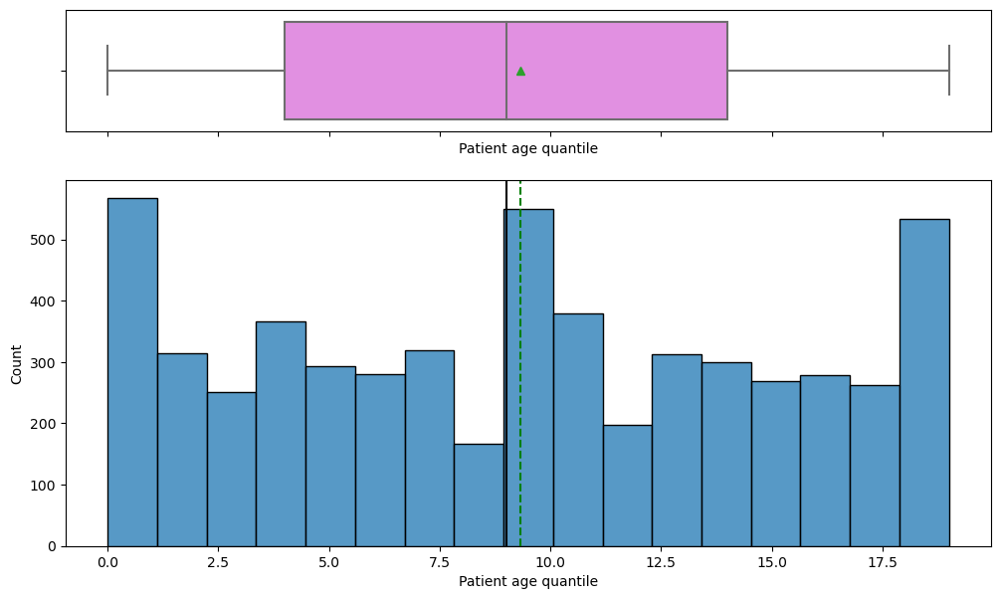

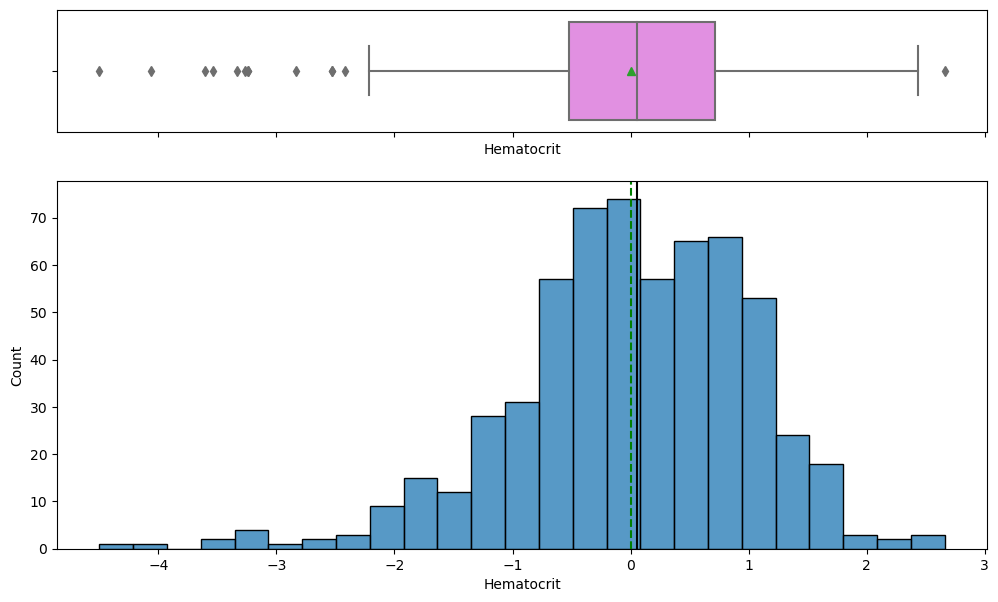

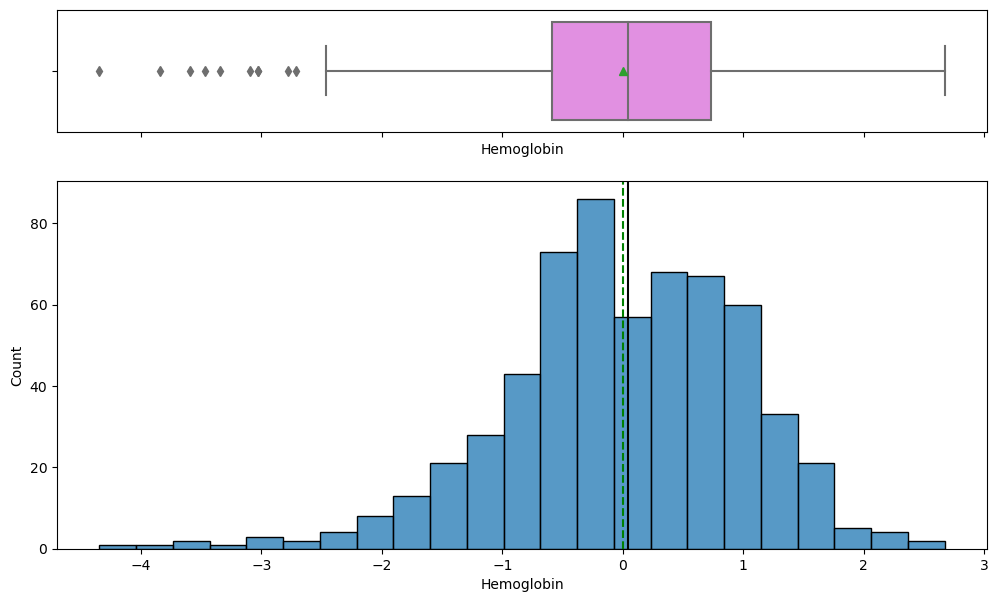

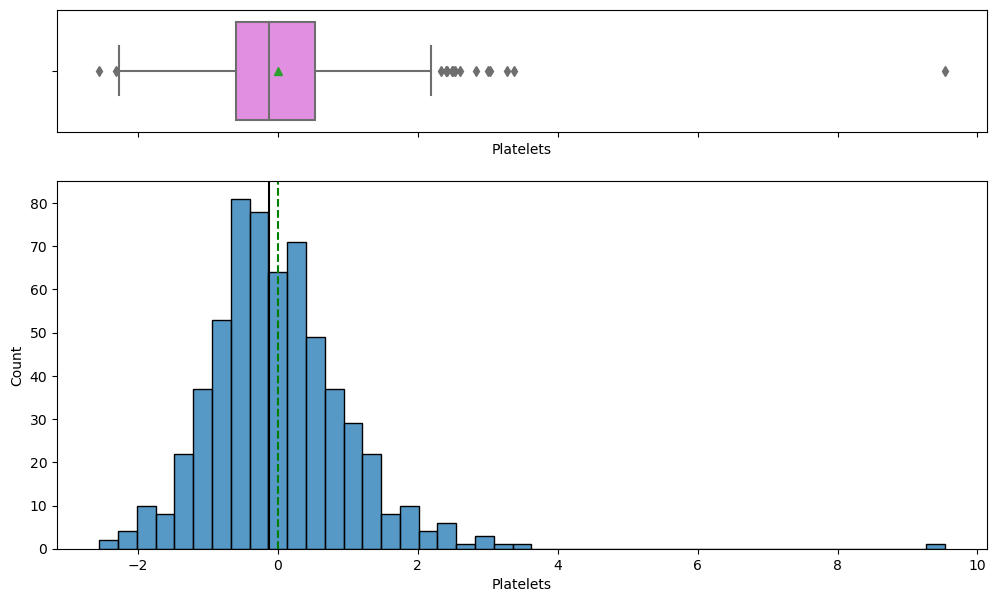

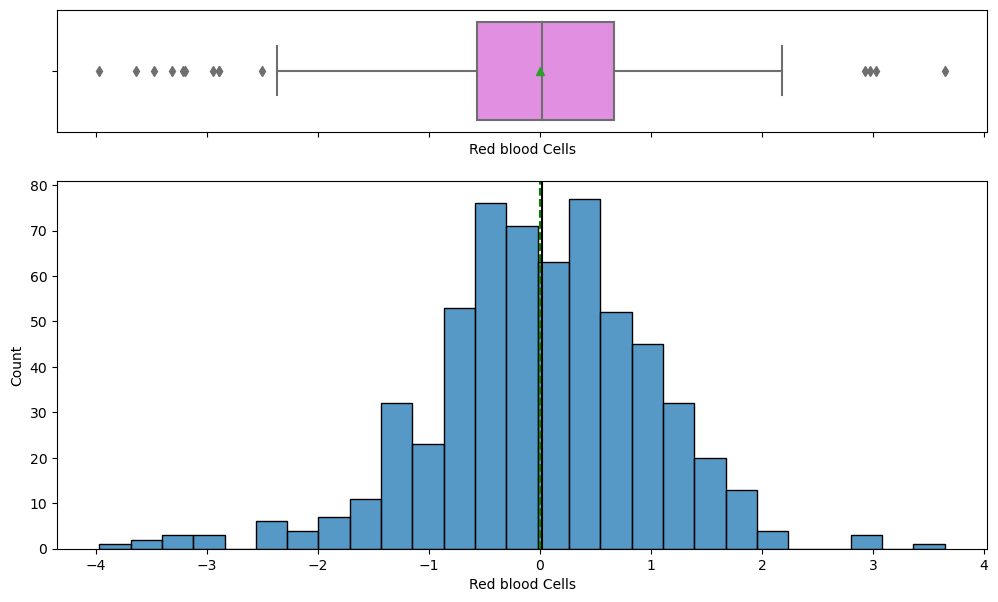

...

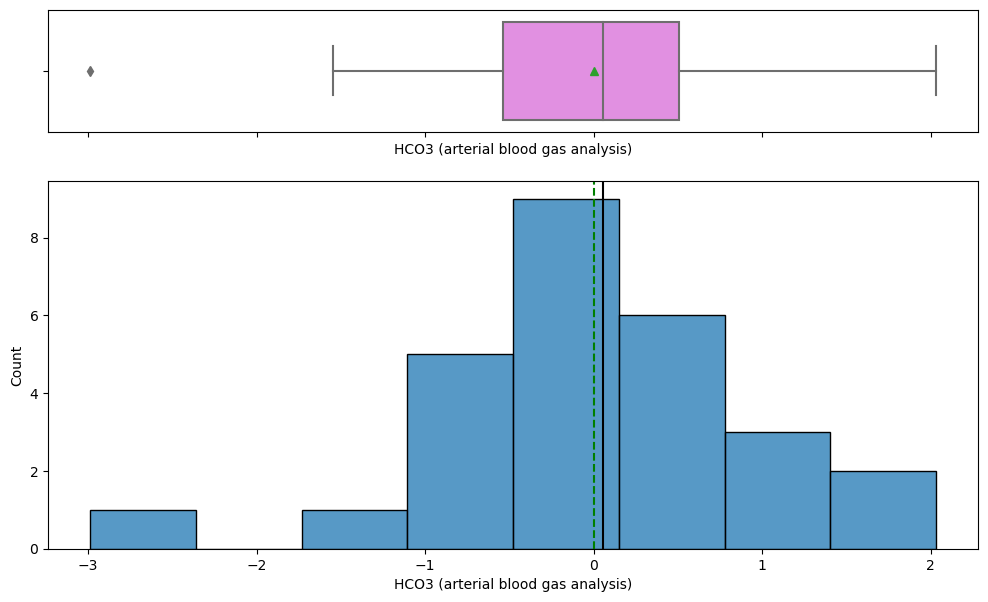

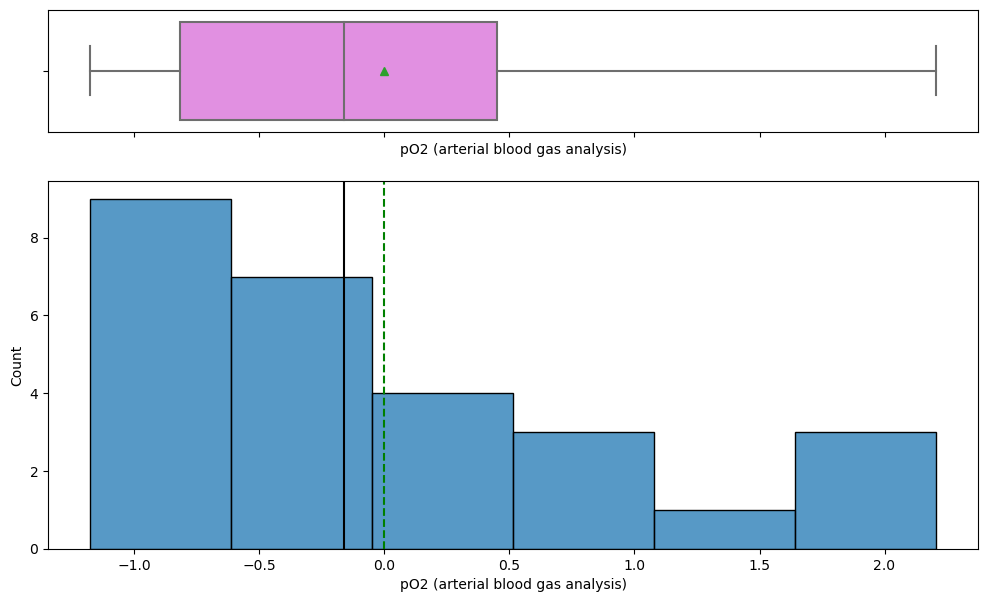

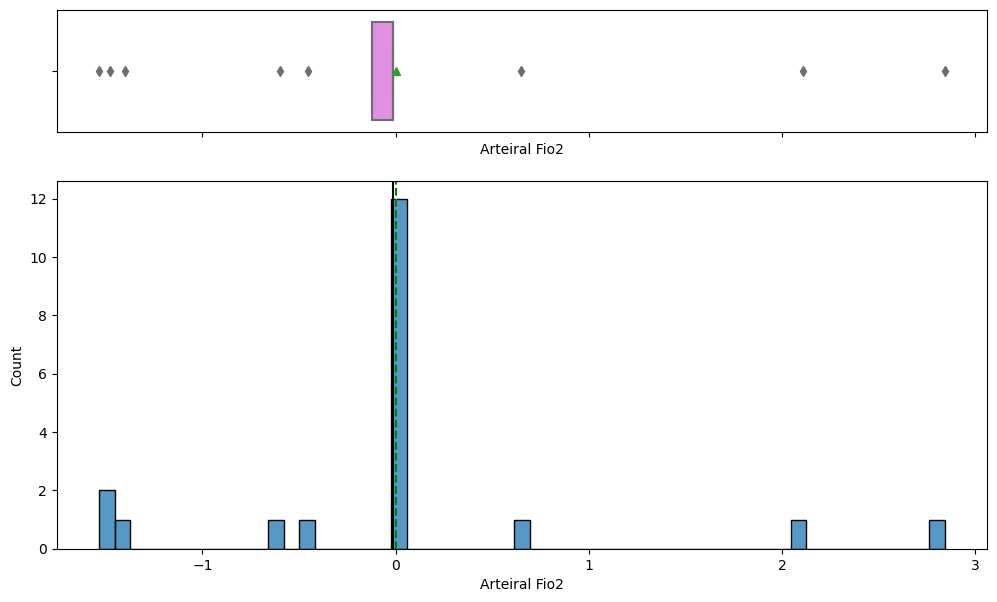

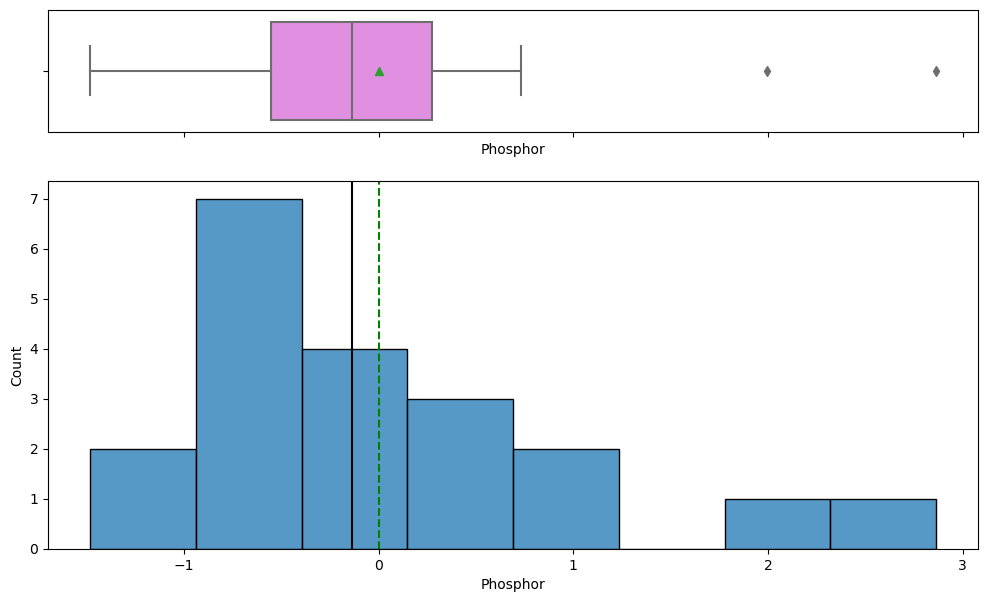

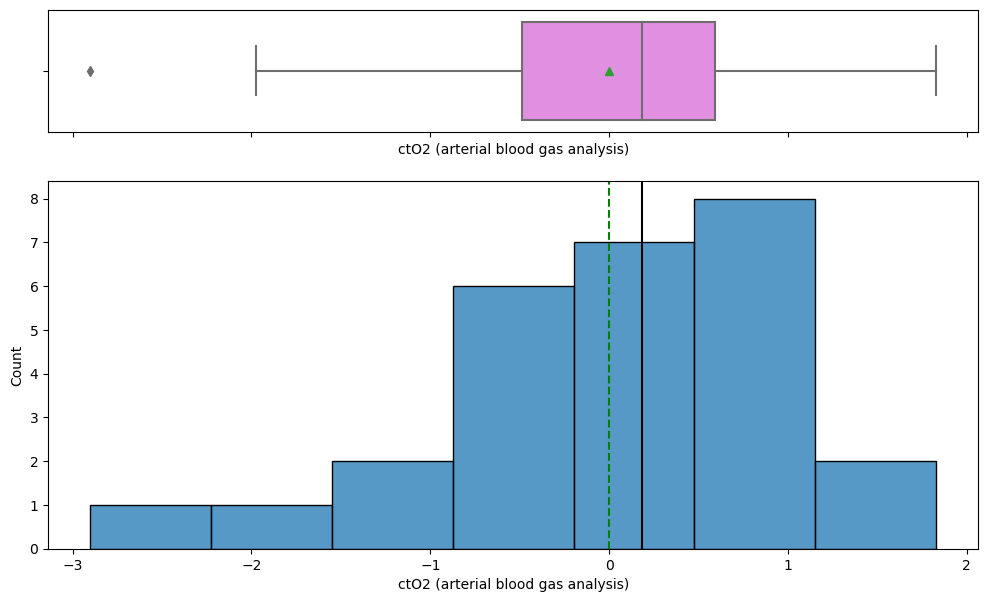

In [16]:
## Code to visualize df columns in histogram_boxplot feature
for feature in df1.columns:
    histogram_boxplot(
        df1, feature, figsize=(12, 7), kde=False, bins=None,
    ) 


#### Observations
- Many of the variables in this dataset have skewed data.
- Majority of the variables have a mean of 0.

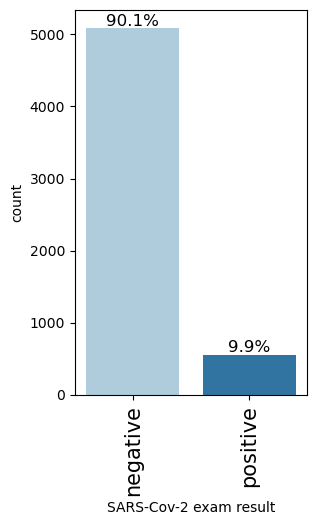

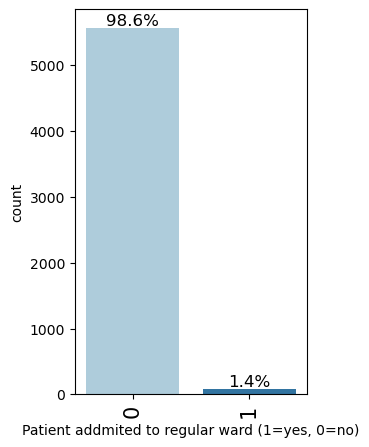

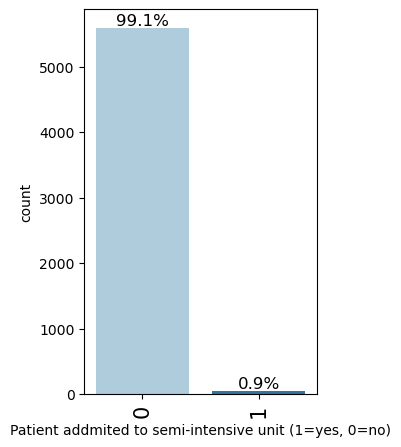

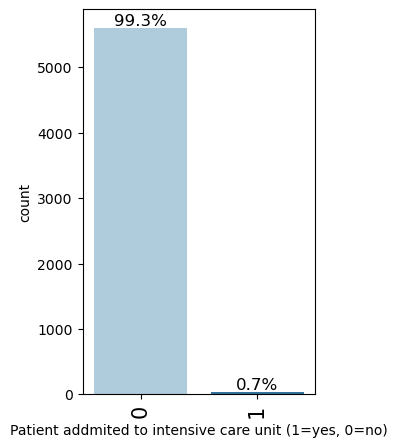

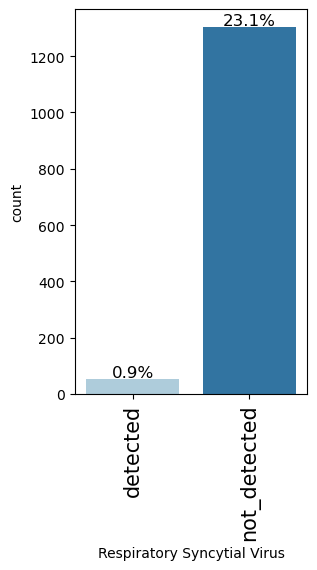

...

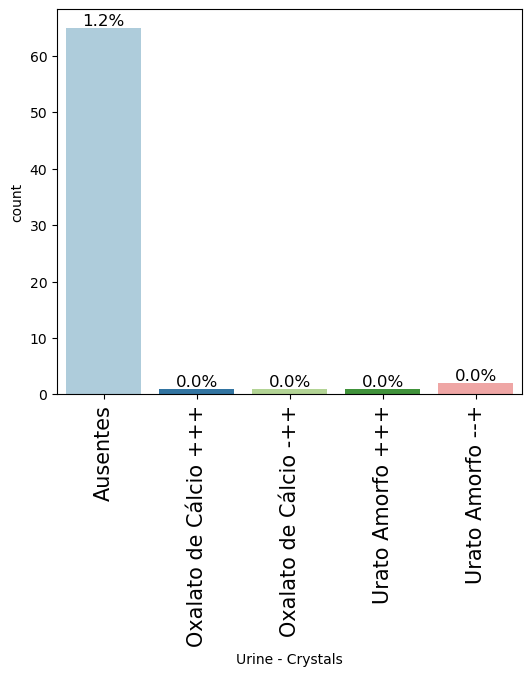

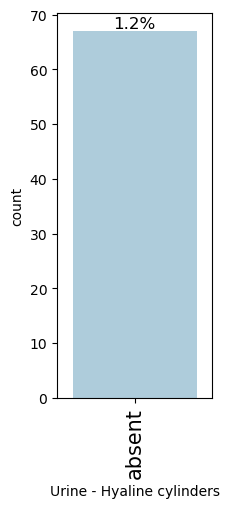

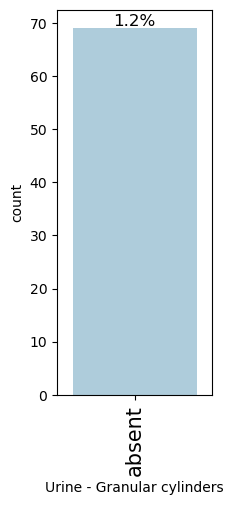

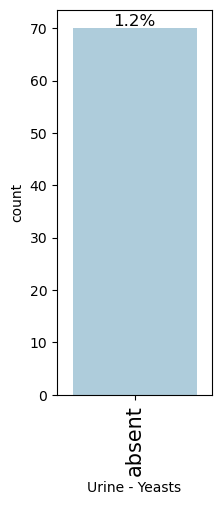

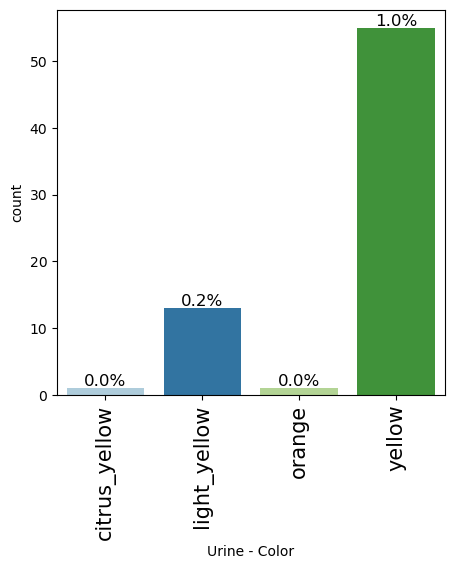

In [17]:
## Code to visualize df columns in histogram_boxplot feature
for feature in df2.columns:
    labeled_barplot(
        df2, feature, perc= True
    ) 



#### Observations
- Majority of cases in the dataset (90.1%) tested negative for SARS CoV-2.
- Few patients (0.9%) were admitted to the semi-intensive unit.
- 0.7% were admitted into the intensive care unit.
- A few of the cases had either isolated infections or co-infections from other virus (Respiratory Synctitial Virus-0.9%, Infuenza A- 0.3%, Influenza B- 1.4%, Parainfluenza 1-0.1%, Coronavirus NL63-0.8%)

## Bivariate analysis

#### 1. Age distribution of positive covid-19 cases vs negative cases

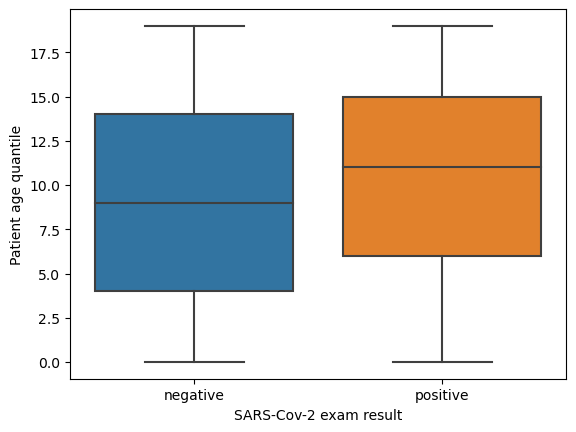

In [18]:
sns.boxplot(data=df, x='SARS-Cov-2 exam result', y='Patient age quantile')
plt.show()


#### Observations:
- The mean age quantile for positive covid-19 cases is higher than negative cases.
- The patient age quantile distribution for both positive and negative cases are comparable.

#### 2.  Age distribution among covid-19 positive cases in the ICU


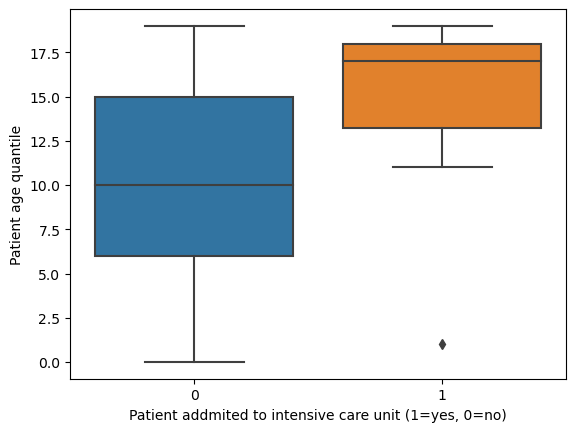

In [19]:
sns.boxplot(data =df[df['SARS-Cov-2 exam result']=='positive'], x='Patient addmited to intensive care unit (1=yes, 0=no)', y='Patient age quantile')
plt.show()


#### Observation:
Among covid cases, patients in the higher age quantiles are more likely to be admitted into the ICU.

#### 3.  Age distribution of patients admitted to the ICU

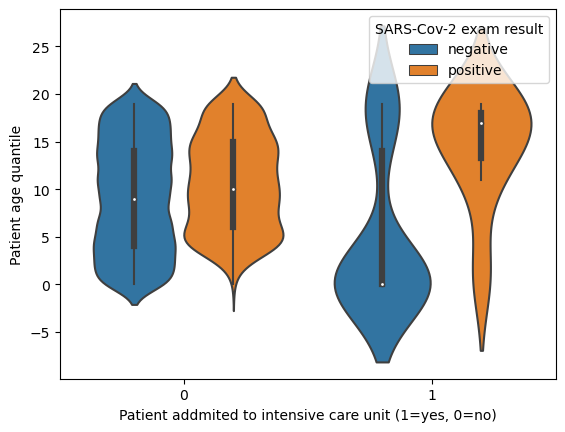

In [20]:
sns.violinplot(data=df, x='Patient addmited to intensive care unit (1=yes, 0=no)', y='Patient age quantile', hue="SARS-Cov-2 exam result")
plt.show()



#### Observation:
- Among ICU patients, Covid-19 patients are more advanced in age. 


#### 4.  pCO2 (arterial blood gas analysis) vs. SARS-Cov-2 exam result

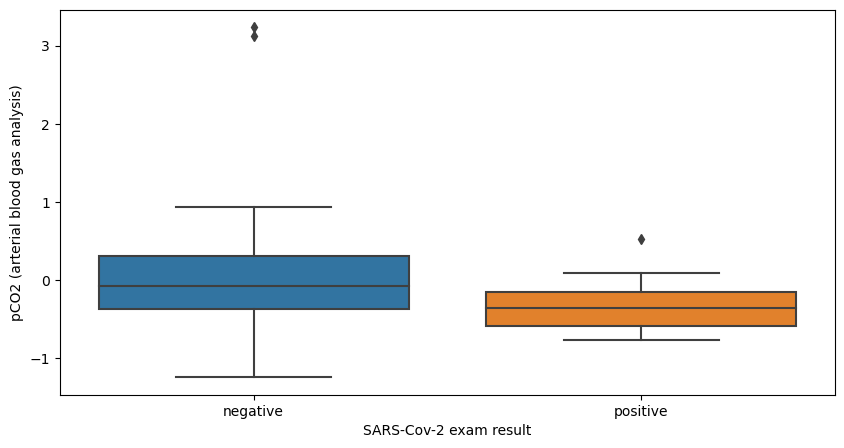

In [21]:
plt.figure(figsize=(10,5))
sns.boxplot(data=df, x="SARS-Cov-2 exam result", y='pCO2 (arterial blood gas analysis)' )
plt.show()

#### Observation:
- Patients who were Covid-19 positive had a lower mean pCO2 (arterial blood gas analysis).


#### 5. Urea vs. SARS-Cov-2 exam result

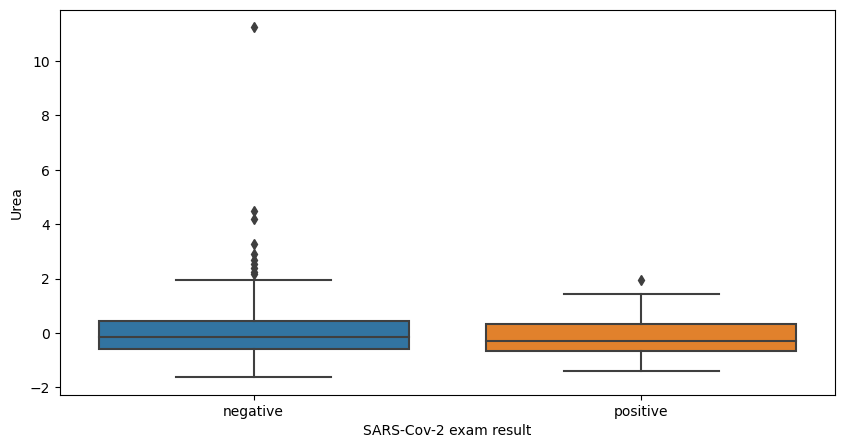

In [22]:
plt.figure(figsize=(10,5))
sns.boxplot(data=df, x="SARS-Cov-2 exam result", y='Urea' )
plt.show()

#### Observation:
- There is no significant difference in the Urea levels of either group, positive or negative.

#### 6. International normalized ratio (INR) vs SARS-Cov-2 exam result

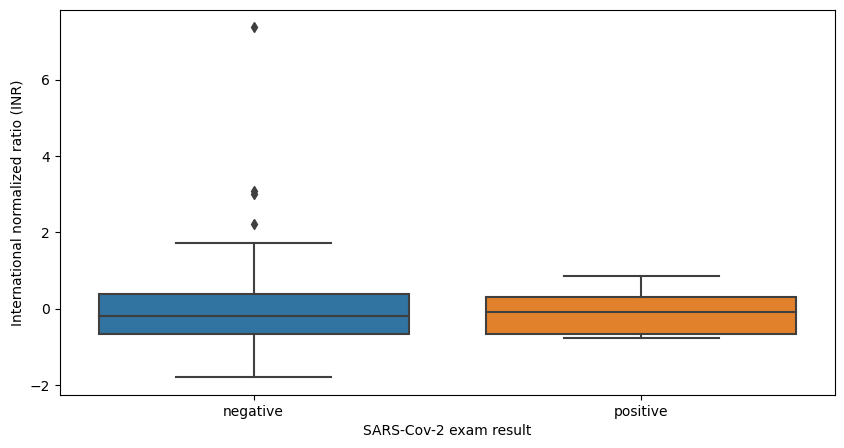

In [23]:
plt.figure(figsize=(10,5))
sns.boxplot(data=df, x="SARS-Cov-2 exam result", y='International normalized ratio (INR)' )
plt.show()

#### Observation
- There is no significant difference in the INR of either group.

#### 7. Correlation Table

In [24]:
corr = df.corr() #code to evaluate correlation between variables
corr

,Patient age quantile,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Serum Glucose,Mycoplasma pneumoniae,Neutrophils,Urea,Proteina C reativa mg/dL,Creatinine,Potassium,Sodium,Alanine transaminase,Aspartate transaminase,Gamma-glutamyltransferase,Total Bilirubin,Direct Bilirubin,Indirect Bilirubin,Alkaline phosphatase,Ionized calcium,Magnesium,pCO2 (venous blood gas analysis),Hb saturation (venous blood gas analysis),Base excess (venous blood gas analysis),pO2 (venous blood gas analysis),Fio2 (venous blood gas analysis),Total CO2 (venous blood gas analysis),pH (venous blood gas analysis),HCO3 (venous blood gas analysis),Rods #,Segmented,Promyelocytes,Metamyelocytes,Myelocytes,Myeloblasts,Urine - Density,Urine - Sugar,Urine - Red blood cells,Partial thromboplastin time (PTT),Relationship (Patient/Normal),International normalized ratio (INR),Lactic Dehydrogenase,"Prothrombin time (PT), Activity",Vitamin B12,Creatine phosphokinase (CPK),Ferritin,Arterial Lactic Acid,Lipase dosage,D-Dimer,Albumin,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis)
Patient age quantile,1.000,0.046,0.016,-0.036,0.097,0.060,-0.159,0.119,-0.038,-0.126,-0.125,-0.166,0.108,0.197,0.022,0.282,0.051,0.166,0.216,NaN,0.087,0.338,0.088,0.373,0.002,-0.005,0.129,0.039,0.224,0.146,0.268,0.008,-0.481,-0.310,-0.128,0.208,-0.059,0.555,-0.071,NaN,0.503,0.256,0.511,0.047,0.284,0.130,0.179,0.089,NaN,-0.118,NaN,0.160,NaN,-0.123,0.014,-0.150,NaN,0.981,-0.101,0.396,0.097,-0.357,NaN,-0.137,-0.224,-0.469,0.570,0.571,0.086,0.166,-0.098,-0.335,-0.512,-0.061
"Patient addmited to regular ward (1=yes, 0=no)",0.046,1.000,-0.011,-0.010,-0.087,-0.092,-0.183,-0.013,-0.053,-0.095,-0.035,-0.103,0.032,-0.051,-0.086,-0.039,-0.000,0.102,0.059,NaN,0.127,-0.012,0.133,0.085,-0.027,-0.087,-0.004,-0.007,0.032,-0.030,-0.010,-0.040,-0.055,-0.187,-0.006,-0.136,-0.088,0.042,-0.071,NaN,-0.041,0.181,-0.034,0.085,0.063,-0.031,-0.034,-0.070,NaN,-0.202,NaN,-0.049,NaN,0.024,-0.100,0.118,NaN,NaN,-0.080,0.410,-0.076,0.316,NaN,NaN,0.198,-0.227,0.033,0.204,-0.160,-0.133,0.106,-0.174,NaN,0.273
"Patient addmited to semi-intensive unit (1=yes, 0=no)",0.016,-0.011,1.000,-0.008,-0.182,-0.177,0.007,-0.023,-0.138,-0.111,-0.023,0.138,-0.133,-0.054,-0.090,-0.051,-0.038,0.092,0.198,NaN,0.087,0.082,0.241,-0.034,-0.014,-0.127,0.022,0.085,0.158,0.027,0.059,-0.007,0.296,0.034,-0.008,-0.160,0.151,-0.026,0.183,NaN,-0.104,0.136,-0.097,0.185,0.083,0.239,0.279,0.416,NaN,-0.141,NaN,0.394,NaN,-0.183,0.083,0.191,NaN,0.615,-0.001,0.084,0.024,NaN,NaN,-0.661,-0.559,0.113,-0.226,-0.179,-0.113,-0.137,-0.339,-0.091,0.185,-0.049
"Patient addmited to intensive care unit (1=yes, 0=no)",-0.036,-0.010,-0.008,1.000,-0.184,-0.179,0.126,-0.074,-0.121,-0.110,-0.036,0.272,-0.121,-0.090,-0.089,-0.078,-0.104,0.194,0.124,NaN,0.103,0.199,0.305,-0.037,0.066,0.016,0.132,0.159,0.241,0.142,0.248,0.019,0.182,-0.273,0.156,0.069,0.190,-0.119,0.247,NaN,-0.076,-0.148,-0.081,0.316,0.201,-0.049,0.063,-0.051,NaN,-0.101,NaN,-0.045,NaN,-0.023,0.186,0.361,NaN,NaN,-0.020,0.820,-0.205,NaN,NaN,NaN,0.352,0.298,0.204,-0.180,0.425,0.411,0.156,0.348,0.130,-0.383
Hematocrit,0.097,-0.087,-0.182,-0.184,1.000,0.968,-0.082,0.084,0.873,0.002,0.131,-0.090,0.129,0.075,0.030,0.025,0.082,-0.265,-0.133,NaN,-0.017,-0.071,-0.238,0.308,0.078,0.099,-0.064,-0.150,-0.279,0.014,-0.128,0.131,-0.282,0.149,-0.210,0.083,-0.102,0.140,-0.178,NaN,0.177,0

#### Observations:
- There is strong correlation (-1.00) between serum bicarbonate (HCO3 arterial blood gas analysis) and serum Phosphorous.
- There is strong correlation (-1.00) between pO2 (arterial blood gas analysis) and Phosphorous
- There is a relatively strong correlation (0.97) between Hematocrit and Hemoglobin.
- There is a relatively strong correlation (0.87) between Hematocrit and ctO2 (arterial blood gas analysis).
- A strong correlation (1.00) exists between ctO2 and Phosphorus as well as between Phosphorous and Arterial FiO2.
- There is a relatively strong correlation (0.99) between Total CO2 (arterial blood gas analysis) and HCO3 (arterial blood gas analysis)

#### 8. Heatmap

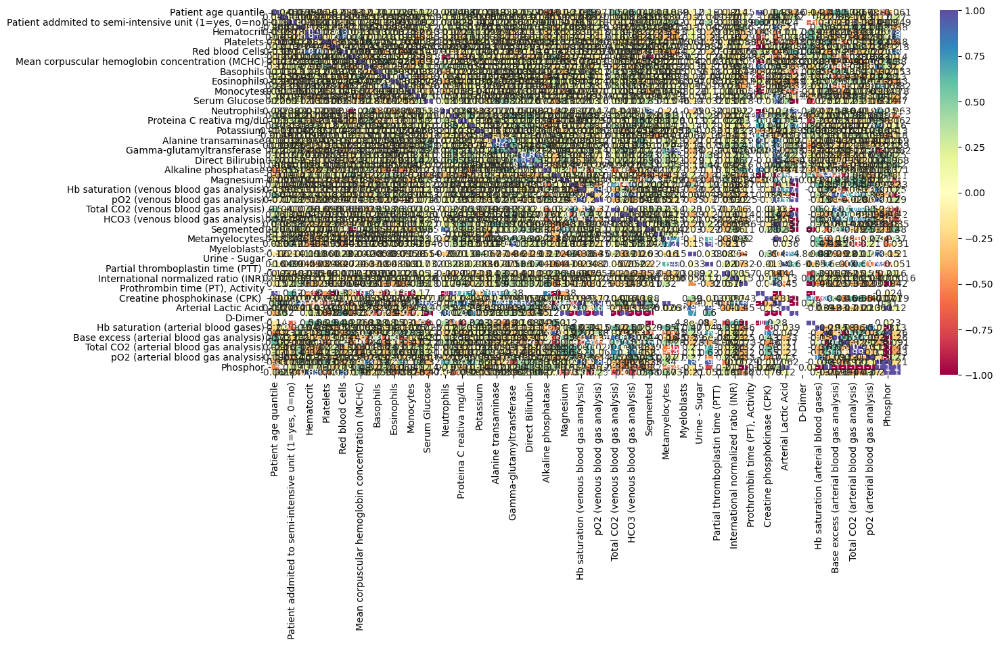

In [25]:
plt.figure(figsize=(15, 7))
sns.heatmap(corr, annot=True, cmap="Spectral")
plt.show()

## Insights
1. This dataset requires some data cleaning to enable in-depth analysis.
2. Age is a significant factor in the severity of presentation of covid-19. The older a patient is, the more likely he/she is to get admitted into the ICU.
3. Covid-19 positive patients have a relatively lower pC02.
4. There is no signifiant difference in the Urea or INR of covid-19 positive or negative patients.
5. There is a strong negative correlation (-1.00) between serum bicarbonate (HCO3 arterial blood gas analysis) and serum Phosphorous, and pO2 (arterial blood gas analysis) and Phosphorous.
6. A strong positive correlation (1.00) exists between ctO2 and Phosphorus as well as between Phosphorous and Arterial FiO2.

## Recommendations
1. This dataset holds a wealth of information concerning Covid-19 testing and predictive factors.

2. Data cleaning is recommended to facilitate a comprehensive analysis that can produce business intelligence and predictive modeling insights.

###### #END OF MILESTONE 1

### Milestone 2

## Data Pre-processing

### 1. Renaming Columns

In [26]:
df.columns= df.columns.str.strip().str.replace('(','') #Remove brackets
df.columns= df.columns.str.strip().str.replace(')','')
df.columns= df.columns.str.replace('-','_') #Replace hyphens with underscore sign
df.columns= df.columns.str.replace(',','_') #Replace commas with underscore sign
df.columns= df.columns.str.replace('/','_') #Replace backward slash with underscore sign
df.columns= df.columns.str.replace(' ','_') #Replace all spaces in column names with underscore signs
df


,Patient_ID,Patient_age_quantile,SARS_Cov_2_exam_result,Patient_addmited_to_regular_ward_1=yes__0=no,Patient_addmited_to_semi_intensive_unit_1=yes__0=no,Patient_addmited_to_intensive_care_unit_1=yes__0=no,Hematocrit,Hemoglobin,Platelets,Mean_platelet_volume,Red_blood_Cells,Lymphocytes,Mean_corpuscular_hemoglobin_concentration MCHC,Leukocytes,Basophils,Mean_corpuscular_hemoglobin_MCH,Eosinophils,Mean_corpuscular_volume_MCV,Monocytes,Red_blood_cell_distribution_width_RDW,Serum_Glucose,Respiratory_Syncytial_Virus,Influenza_A,Influenza_B,Parainfluenza_1,CoronavirusNL63,Rhinovirus_Enterovirus,Mycoplasma_pneumoniae,Coronavirus_HKU1,Parainfluenza_3,Chlamydophila_pneumoniae,Adenovirus,Parainfluenza_4,Coronavirus229E,CoronavirusOC43,Inf_A_H1N1_2009,Bordetella_pertussis,Metapneumovirus,Parainfluenza_2,Neutrophils,Urea,Proteina_C_reativa_mg_dL,Creatinine,Potassium,Sodium,Influenza_B__rapid_test,Influenza_A__rapid_test,Alanine_transaminase,Aspartate_transaminase,Gamma_glutamyltransferase,Total_Bilirubin,Direct_Bilirubin,Indirect_Bilirubin,Alkaline_phosphatase,Ionized_calcium,Strepto_A,Magnesium,pCO2_venous_blood_gas_analysis,Hb_saturation_venous_blood_gas_analysis,Base_excess_venous_blood_gas_analysis,pO2_venous_blood_gas_analysis,Fio2_venous_blood_gas_analysis,Total_CO2_venous_blood_gas_analysis,pH_venous_blood_gas_analysis,HCO3_venous_blood_gas_analysis,Rods_#,Segmented,Promyelocytes,Metamyelocytes,Myelocytes,Myeloblasts,Urine___Esterase,Urine___Aspect,Urine___pH,Urine___Hemoglobin,Urine___Bile_pigments,Urine___Ketone_Bodies,Urine___Nitrite,Urine___Density,Urine___Urobilinogen,Urine___Protein,Urine___Sugar,Urine___Leukocytes,Urine___Crystals,Urine___Red_blood_cells,Urine___Hyaline_cylinders,Urine___Granular_cylinders,Urine___Yeasts,Urine___Color,Partial_thromboplastin_time PTT,Relationship_Patient_Normal,International_normalized_ratio_INR,Lactic_Dehydrogenase,Prothrombin_time_PT__Activity,Vitamin_B12,Creatine_phosphokinase CPK,Ferritin,Arterial_Lactic_Acid,Lipase_dosage,D_Dimer,Albumin,Hb_saturation_arterial_blood_gases,pCO2_arterial_blood_gas_analysis,Base_excess_arterial_blood_gas_analysis,pH_arterial_blood_gas_analysis,Total_CO2_arterial_blood_gas_analysis,HCO3_arterial_blood_gas_analysis,pO2_arterial_blood_gas_analysis,Arteiral_Fio2,Phosphor,ctO2_arterial_blood_gas_analysis
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.237,-0.022,-0.517,0.011,0.102,0.318,-0.951,-0.095,-0.224,-0.292,1.482,0.166,0.358,-0.625,-0.141,not_detected,not_detected,not_detected,not_detected,not_detected,detected,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,-0.619,1.198,-0.148,2.090,-0.306,0.863,negative,negative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [27]:
#Editing column names: Correcting grammatical errors
# Changing "addmited" to "admitted"
df.rename(columns={'Patient_addmited_to_regular_ward_1=yes__0=no': 'Patient_admitted_to_regular_ward_1=yes__0=no', 'Patient_addmited_to_semi_intensive_unit_1=yes__0=no': 'Patient_admitted_to_semi_intensive_unit_1=yes__0=no', 'Patient_addmited_to_intensive_care_unit_1=yes__0=no': 'Patient_admitted_to_intensive_care_unit_1=yes__0=no'}, inplace=True)
df

,Patient_ID,Patient_age_quantile,SARS_Cov_2_exam_result,Patient_admitted_to_regular_ward_1=yes__0=no,Patient_admitted_to_semi_intensive_unit_1=yes__0=no,Patient_admitted_to_intensive_care_unit_1=yes__0=no,Hematocrit,Hemoglobin,Platelets,Mean_platelet_volume,Red_blood_Cells,Lymphocytes,Mean_corpuscular_hemoglobin_concentration MCHC,Leukocytes,Basophils,Mean_corpuscular_hemoglobin_MCH,Eosinophils,Mean_corpuscular_volume_MCV,Monocytes,Red_blood_cell_distribution_width_RDW,Serum_Glucose,Respiratory_Syncytial_Virus,Influenza_A,Influenza_B,Parainfluenza_1,CoronavirusNL63,Rhinovirus_Enterovirus,Mycoplasma_pneumoniae,Coronavirus_HKU1,Parainfluenza_3,Chlamydophila_pneumoniae,Adenovirus,Parainfluenza_4,Coronavirus229E,CoronavirusOC43,Inf_A_H1N1_2009,Bordetella_pertussis,Metapneumovirus,Parainfluenza_2,Neutrophils,Urea,Proteina_C_reativa_mg_dL,Creatinine,Potassium,Sodium,Influenza_B__rapid_test,Influenza_A__rapid_test,Alanine_transaminase,Aspartate_transaminase,Gamma_glutamyltransferase,Total_Bilirubin,Direct_Bilirubin,Indirect_Bilirubin,Alkaline_phosphatase,Ionized_calcium,Strepto_A,Magnesium,pCO2_venous_blood_gas_analysis,Hb_saturation_venous_blood_gas_analysis,Base_excess_venous_blood_gas_analysis,pO2_venous_blood_gas_analysis,Fio2_venous_blood_gas_analysis,Total_CO2_venous_blood_gas_analysis,pH_venous_blood_gas_analysis,HCO3_venous_blood_gas_analysis,Rods_#,Segmented,Promyelocytes,Metamyelocytes,Myelocytes,Myeloblasts,Urine___Esterase,Urine___Aspect,Urine___pH,Urine___Hemoglobin,Urine___Bile_pigments,Urine___Ketone_Bodies,Urine___Nitrite,Urine___Density,Urine___Urobilinogen,Urine___Protein,Urine___Sugar,Urine___Leukocytes,Urine___Crystals,Urine___Red_blood_cells,Urine___Hyaline_cylinders,Urine___Granular_cylinders,Urine___Yeasts,Urine___Color,Partial_thromboplastin_time PTT,Relationship_Patient_Normal,International_normalized_ratio_INR,Lactic_Dehydrogenase,Prothrombin_time_PT__Activity,Vitamin_B12,Creatine_phosphokinase CPK,Ferritin,Arterial_Lactic_Acid,Lipase_dosage,D_Dimer,Albumin,Hb_saturation_arterial_blood_gases,pCO2_arterial_blood_gas_analysis,Base_excess_arterial_blood_gas_analysis,pH_arterial_blood_gas_analysis,Total_CO2_arterial_blood_gas_analysis,HCO3_arterial_blood_gas_analysis,pO2_arterial_blood_gas_analysis,Arteiral_Fio2,Phosphor,ctO2_arterial_blood_gas_analysis
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.237,-0.022,-0.517,0.011,0.102,0.318,-0.951,-0.095,-0.224,-0.292,1.482,0.166,0.358,-0.625,-0.141,not_detected,not_detected,not_detected,not_detected,not_detected,detected,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,-0.619,1.198,-0.148,2.090,-0.306,0.863,negative,negative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

#### Comments:
- Column names have been changed to standard format, making it more uniform and understandable.
- Grammatical errors have been corrected.

### 2. Removal of Unwanted Variables

1. Patient_ID is the first to be dropped since it only serves as an identifier and does not affect covid-19 results. It will therefore not be needed in this data analysis.
2. Other columns will be dropped based on an assessment of the extent of missing values. 
3. Columns that contain missing values but are not drooped will have their missing values treated

In [28]:
df_clean=df.drop('Patient_ID', axis=1, inplace=True)

In [29]:
#Deciding which columns to drop based on missing values
#Code to establish percentage of missing values per column
df_null_1=((df.isnull().sum())/5644*100).sort_values(ascending= False).head(60)
df_null_1

Mycoplasma_pneumoniae                     100.000
Urine___Sugar                             100.000
Partial_thromboplastin_time PTT           100.000
Prothrombin_time_PT__Activity             100.000
D_Dimer                                   100.000
Fio2_venous_blood_gas_analysis             99.982
Urine___Nitrite                            99.982
Vitamin_B12                                99.947
Lipase_dosage                              99.858
Albumin                                    99.770
Arteiral_Fio2                              99.646
Phosphor                                   99.646
Ferritin                                   99.592
Hb_saturation_arterial_blood_gases         99.522
pCO2_arterial_blood_gas_analysis           99.522
Base_excess_arterial_blood_gas_analysis    99.522
pH_arterial_blood_gas_analysis             99.522
Arterial_Lactic_Acid                       99.522
Total_CO2_arterial_blood_gas_analysis      99.522
HCO3_arterial_blood_gas_analysis           99.522


#### Observations:
- The above listed columns consist of more missing values than useful data.
- Four columns have 100% missing values. These are;
1. Urine-Sugar
2. Mycoplasma pneumonia
3. Partial thromboplastin time (PTT)
4. Prothrombin time (PT), Activity 

In [30]:
#Code to determine columns with least number of missing values
df_null_2=((df.isnull().sum())/5644*100).sort_values(ascending= True).head(51)
df_null_2

Patient_age_quantile                                   0.000
SARS_Cov_2_exam_result                                 0.000
Patient_admitted_to_regular_ward_1=yes__0=no           0.000
Patient_admitted_to_semi_intensive_unit_1=yes__0=no    0.000
Patient_admitted_to_intensive_care_unit_1=yes__0=no    0.000
Influenza_B                                           76.010
Respiratory_Syncytial_Virus                           76.010
Influenza_A                                           76.010
Rhinovirus_Enterovirus                                76.045
Inf_A_H1N1_2009                                       76.045
CoronavirusOC43                                       76.045
Coronavirus229E                                       76.045
Parainfluenza_4                                       76.045
Adenovirus                                            76.045
Chlamydophila_pneumoniae                              76.045
Parainfluenza_3                                       76.045
Coronavirus_HKU1        

#### Observation
- The columns with no missing data are;
1. Patient age quantile
2. SARS-Cov-2 exam result
3. Patient addmited to regular ward (1=yes, 0=no)
4. Patient addmited to semi-intensive unit (1=yes, 0=no)
5. Patient addmited to intensive care unit (1=yes, 0=no)

In [31]:
#Dropping columns with more than 98% of missing values
df_clean1=df.loc[:,df.isnull().mean()<0.90]
df_clean1

,Patient_age_quantile,SARS_Cov_2_exam_result,Patient_admitted_to_regular_ward_1=yes__0=no,Patient_admitted_to_semi_intensive_unit_1=yes__0=no,Patient_admitted_to_intensive_care_unit_1=yes__0=no,Hematocrit,Hemoglobin,Platelets,Mean_platelet_volume,Red_blood_Cells,Lymphocytes,Mean_corpuscular_hemoglobin_concentration MCHC,Leukocytes,Basophils,Mean_corpuscular_hemoglobin_MCH,Eosinophils,Mean_corpuscular_volume_MCV,Monocytes,Red_blood_cell_distribution_width_RDW,Respiratory_Syncytial_Virus,Influenza_A,Influenza_B,Parainfluenza_1,CoronavirusNL63,Rhinovirus_Enterovirus,Coronavirus_HKU1,Parainfluenza_3,Chlamydophila_pneumoniae,Adenovirus,Parainfluenza_4,Coronavirus229E,CoronavirusOC43,Inf_A_H1N1_2009,Bordetella_pertussis,Metapneumovirus,Parainfluenza_2,Influenza_B__rapid_test,Influenza_A__rapid_test
0,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17,negative,0,0,0,0.237,-0.022,-0.517,0.011,0.102,0.318,-0.951,-0.095,-0.224,-0.292,1.482,0.166,0.358,-0.625,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,15,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5639,3,positive,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5640,17,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5641,4,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5642,10,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Comments:
- Patient_ID has been dropped
- 72 other columns/variables have also been dropped on account of total or near total (more than 90) missing values.
- A total of 73 columns/variables out of 111 have been removed.
- 38 columns now remain.

### 3. Missing value treatment

1. Numerical data columns will have their missing data replaced by their respective medians
2. Missing categorical data will be replaced by 'Unknown'

#### A) Treating missing numerical data

In [32]:
#Code to fill in missing values of numeric data with a median
numeric_columns = df_clean1.select_dtypes(include=np.number).columns
df_clean1[numeric_columns]=df_clean1[numeric_columns].fillna(df_clean1[numeric_columns].median())
df_clean1

,Patient_age_quantile,SARS_Cov_2_exam_result,Patient_admitted_to_regular_ward_1=yes__0=no,Patient_admitted_to_semi_intensive_unit_1=yes__0=no,Patient_admitted_to_intensive_care_unit_1=yes__0=no,Hematocrit,Hemoglobin,Platelets,Mean_platelet_volume,Red_blood_Cells,Lymphocytes,Mean_corpuscular_hemoglobin_concentration MCHC,Leukocytes,Basophils,Mean_corpuscular_hemoglobin_MCH,Eosinophils,Mean_corpuscular_volume_MCV,Monocytes,Red_blood_cell_distribution_width_RDW,Respiratory_Syncytial_Virus,Influenza_A,Influenza_B,Parainfluenza_1,CoronavirusNL63,Rhinovirus_Enterovirus,Coronavirus_HKU1,Parainfluenza_3,Chlamydophila_pneumoniae,Adenovirus,Parainfluenza_4,Coronavirus229E,CoronavirusOC43,Inf_A_H1N1_2009,Bordetella_pertussis,Metapneumovirus,Parainfluenza_2,Influenza_B__rapid_test,Influenza_A__rapid_test
0,13,negative,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17,negative,0,0,0,0.237,-0.022,-0.517,0.011,0.102,0.318,-0.951,-0.095,-0.224,-0.292,1.482,0.166,0.358,-0.625,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,8,negative,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5,negative,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,15,negative,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5639,3,positive,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5640,17,negative,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5641,4,negative,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5642,10,negative,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### B) Treating missing categorical data

In [33]:
# filling with Unknown class
cat_cols= ['Respiratory_Syncytial_Virus','Influenza_A','Influenza_B','Parainfluenza_1',
           'CoronavirusNL63','Rhinovirus_Enterovirus','Coronavirus_HKU1','Parainfluenza_3',
           'Chlamydophila_pneumoniae','Adenovirus','Parainfluenza_4','Coronavirus229E', 
           'CoronavirusOC43', 'Inf_A_H1N1_2009', 'Bordetella_pertussis','Metapneumovirus',
           'Parainfluenza_2','Influenza_B__rapid_test','Influenza_A__rapid_test'
          ]
df_clean1[cat_cols] = df_clean1[cat_cols].fillna("Unknown")
df_clean1

,Patient_age_quantile,SARS_Cov_2_exam_result,Patient_admitted_to_regular_ward_1=yes__0=no,Patient_admitted_to_semi_intensive_unit_1=yes__0=no,Patient_admitted_to_intensive_care_unit_1=yes__0=no,Hematocrit,Hemoglobin,Platelets,Mean_platelet_volume,Red_blood_Cells,Lymphocytes,Mean_corpuscular_hemoglobin_concentration MCHC,Leukocytes,Basophils,Mean_corpuscular_hemoglobin_MCH,Eosinophils,Mean_corpuscular_volume_MCV,Monocytes,Red_blood_cell_distribution_width_RDW,Respiratory_Syncytial_Virus,Influenza_A,Influenza_B,Parainfluenza_1,CoronavirusNL63,Rhinovirus_Enterovirus,Coronavirus_HKU1,Parainfluenza_3,Chlamydophila_pneumoniae,Adenovirus,Parainfluenza_4,Coronavirus229E,CoronavirusOC43,Inf_A_H1N1_2009,Bordetella_pertussis,Metapneumovirus,Parainfluenza_2,Influenza_B__rapid_test,Influenza_A__rapid_test
0,13,negative,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
1,17,negative,0,0,0,0.237,-0.022,-0.517,0.011,0.102,0.318,-0.951,-0.095,-0.224,-0.292,1.482,0.166,0.358,-0.625,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,8,negative,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
3,5,negative,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
4,15,negative,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,Unknown,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5639,3,positive,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
5640,17,negative,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
5641,4,negative,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
5642,10,negative,0,0,0,0.053,0.040,-0.122,-0.102,0.014,-0.014,-0.055,-0.213,-0.224,0.126,-0.330,0.066,-0.115,-0.183,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown


In [34]:
df_clean1.isna().sum()


Patient_age_quantile                                   0
SARS_Cov_2_exam_result                                 0
Patient_admitted_to_regular_ward_1=yes__0=no           0
Patient_admitted_to_semi_intensive_unit_1=yes__0=no    0
Patient_admitted_to_intensive_care_unit_1=yes__0=no    0
Hematocrit                                             0
Hemoglobin                                             0
Platelets                                              0
Mean_platelet_volume                                   0
Red_blood_Cells                                        0
Lymphocytes                                            0
Mean_corpuscular_hemoglobin_concentration MCHC         0
Leukocytes                                             0
Basophils                                              0
Mean_corpuscular_hemoglobin_MCH                        0
Eosinophils                                            0
Mean_corpuscular_volume_MCV                            0
Monocytes                      

#### Observations:
- All missing values have been treated.
- Numerical variables were treated with their median value.
- Categorical variables were treaated with their mode.

### 4. Outlier Treatment

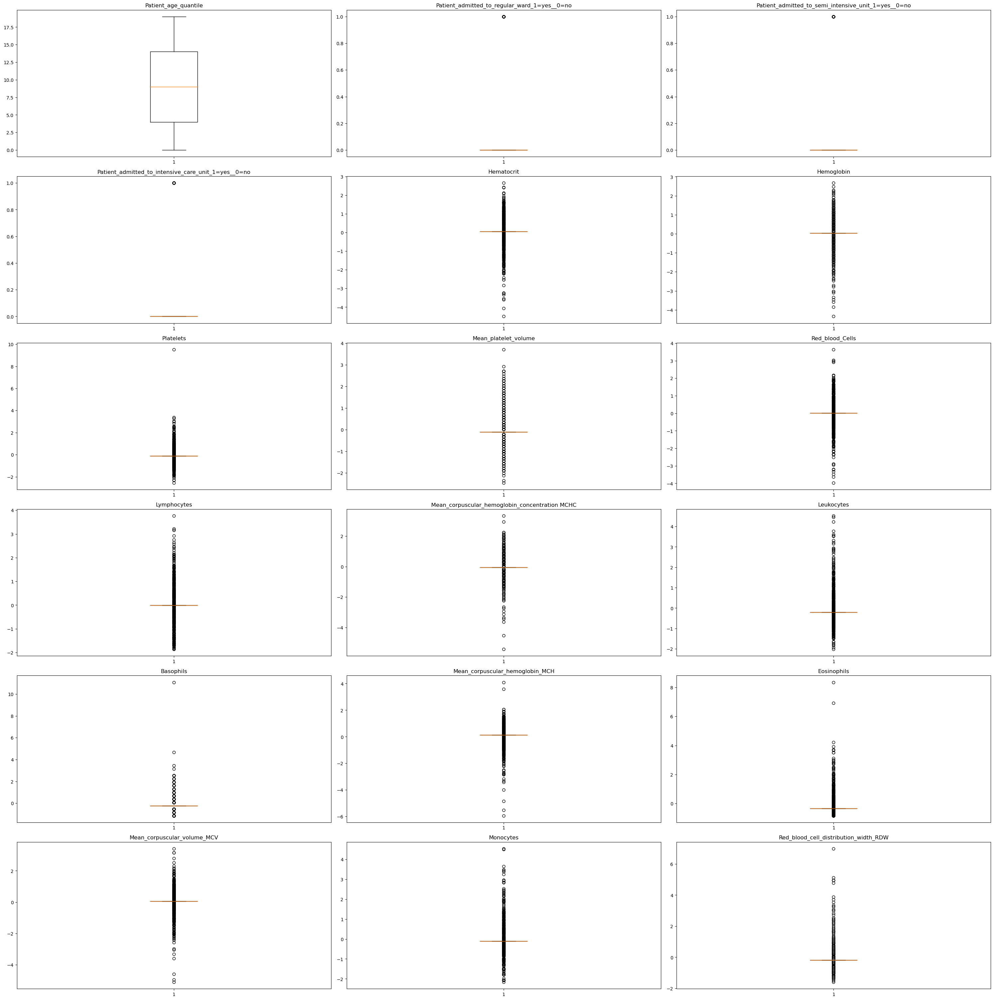

In [35]:
# outlier detection using boxplot
plt.figure(figsize=(30, 100))

for i, variable in enumerate(numeric_columns):
    plt.subplot(20, 3, i + 1)
    plt.boxplot(df_clean1[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()


#### Observation:
- Columns with distinct outliers are;
1. Platelets
2. Basophils
3. Eosinophils
4. Monocytes
5. Red_blood_cell_distribution_width_RDW

- These columns will have their outliers treated.
- The remaining numerical columns either; 
1. Do not have distinct outliers or
2. Their outliers are considered significant and thus,will not be treated

In [36]:
# functions to treat outliers by flooring and capping


def treat_outliers(df, col):
    """
    Treats outliers in a variable

    df: dataframe
    col: dataframe column
    """
    Q1 = df[col].quantile(0.25)  # 25th quantile
    Q3 = df[col].quantile(0.75)  # 75th quantile
    IQR = Q3 - Q1
    Lower_Whisker = Q1 - 1.5 * IQR
    Upper_Whisker = Q3 + 1.5 * IQR

    # all the values smaller than Lower_Whisker will be assigned the value of Lower_Whisker
    # all the values greater than Upper_Whisker will be assigned the value of Upper_Whisker
    df[col] = np.clip(df[col], Lower_Whisker, Upper_Whisker)

    return df


def treat_outliers_all(df, col_list):
    """
    Treat outliers in a list of variables

    df: dataframe
    col_list: list of dataframe columns
    """
    for c in col_list:
        df = treat_outliers(df, c)

    return df


In [37]:
treat_out_cols = [
 'Platelets',
'Basophils',
'Eosinophils',
'Monocytes',
'Red_blood_cell_distribution_width_RDW'
]

df_clean2 = treat_outliers_all(df_clean1, treat_out_cols)

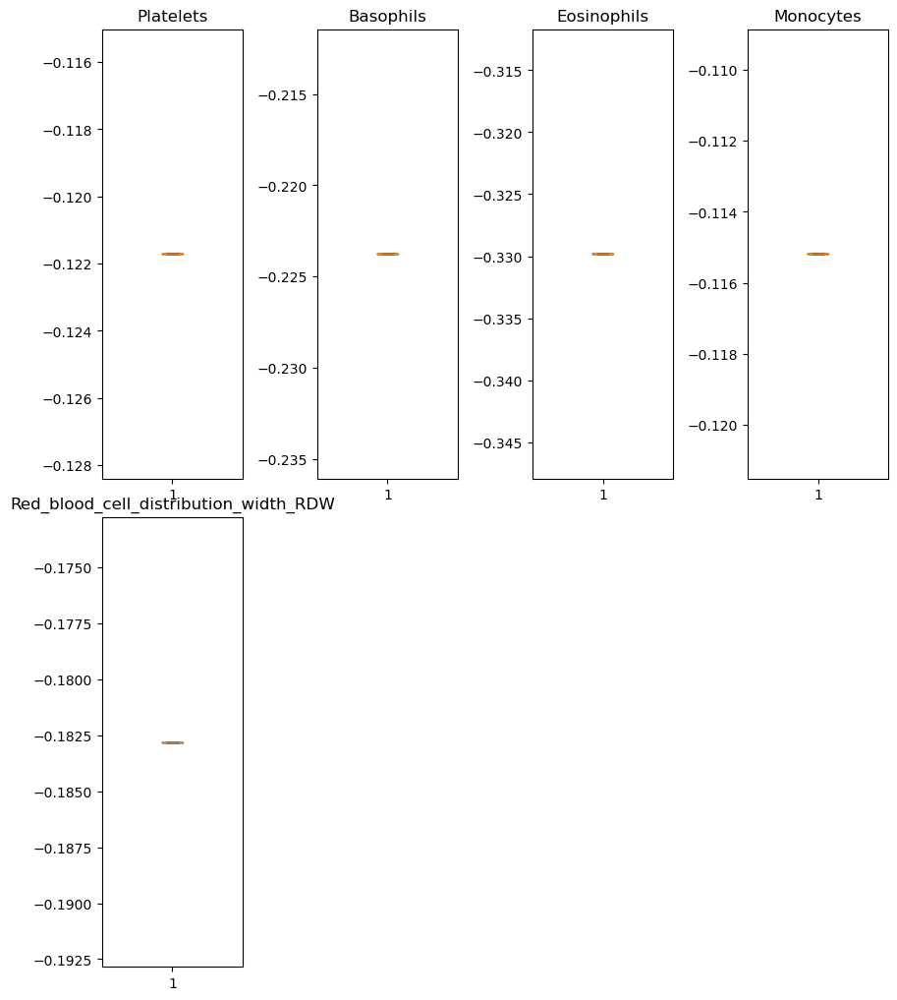

In [38]:
# Checking to see result of outlier treatment

plt.figure(figsize=(9, 15))

for i, variable in enumerate(treat_out_cols):
    plt.subplot(3, 4, i + 1)
    plt.boxplot(df_clean2[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()



#### Observation:
Selected columns have been treated

### 5. Dropping variables on account of number of unique variables

In [39]:
df_clean2.nunique()

Patient_age_quantile                                    20
SARS_Cov_2_exam_result                                   2
Patient_admitted_to_regular_ward_1=yes__0=no             2
Patient_admitted_to_semi_intensive_unit_1=yes__0=no      2
Patient_admitted_to_intensive_care_unit_1=yes__0=no      2
Hematocrit                                             176
Hemoglobin                                              84
Platelets                                                1
Mean_platelet_volume                                    48
Red_blood_Cells                                        211
Lymphocytes                                            318
Mean_corpuscular_hemoglobin_concentration MCHC          57
Leukocytes                                             476
Basophils                                                1
Mean_corpuscular_hemoglobin_MCH                         91
Eosinophils                                              1
Mean_corpuscular_volume_MCV                            1

#### Observation:
Five columns consist of only one value. 
These columns are:
- Platelets
- Red_blood_cell_distribution_width_RDW
- Monocytes
- Basophils
- Eosinophils

One value is not enough data for developing meaningful insights.
These columns will therefore be dropped.

In [40]:
df_clean3 = df_clean2.drop(
    ["Red_blood_cell_distribution_width_RDW", "Monocytes", "Basophils", "Eosinophils", "Platelets"], axis=1
)
df_clean3.head()

,Patient_age_quantile,SARS_Cov_2_exam_result,Patient_admitted_to_regular_ward_1=yes__0=no,Patient_admitted_to_semi_intensive_unit_1=yes__0=no,Patient_admitted_to_intensive_care_unit_1=yes__0=no,Hematocrit,Hemoglobin,Mean_platelet_volume,Red_blood_Cells,Lymphocytes,Mean_corpuscular_hemoglobin_concentration MCHC,Leukocytes,Mean_corpuscular_hemoglobin_MCH,Mean_corpuscular_volume_MCV,Respiratory_Syncytial_Virus,Influenza_A,Influenza_B,Parainfluenza_1,CoronavirusNL63,Rhinovirus_Enterovirus,Coronavirus_HKU1,Parainfluenza_3,Chlamydophila_pneumoniae,Adenovirus,Parainfluenza_4,Coronavirus229E,CoronavirusOC43,Inf_A_H1N1_2009,Bordetella_pertussis,Metapneumovirus,Parainfluenza_2,Influenza_B__rapid_test,Influenza_A__rapid_test
0,13,negative,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
1,17,negative,0,0,0,0.237,-0.022,0.011,0.102,0.318,-0.951,-0.095,-0.292,0.166,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,8,negative,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
3,5,negative,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
4,15,negative,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,Unknown,Unknown


#### Observation:
- The 5 columns containing only one value have been dropped.
- There are now 33 variables in the dataset

### 6. Variable transformation 

#### A) Replace values in SARS_Cov_2_exam_result column with binary values (0/1)

In [41]:
# Replace entries in 'SARS_Cov_2_exam_result' with zeros and ones
replaceStruct = {"SARS_Cov_2_exam_result": {"negative":0, 'positive':1}}
df_model = df_clean3.replace(replaceStruct)
df_model.head()

,Patient_age_quantile,SARS_Cov_2_exam_result,Patient_admitted_to_regular_ward_1=yes__0=no,Patient_admitted_to_semi_intensive_unit_1=yes__0=no,Patient_admitted_to_intensive_care_unit_1=yes__0=no,Hematocrit,Hemoglobin,Mean_platelet_volume,Red_blood_Cells,Lymphocytes,Mean_corpuscular_hemoglobin_concentration MCHC,Leukocytes,Mean_corpuscular_hemoglobin_MCH,Mean_corpuscular_volume_MCV,Respiratory_Syncytial_Virus,Influenza_A,Influenza_B,Parainfluenza_1,CoronavirusNL63,Rhinovirus_Enterovirus,Coronavirus_HKU1,Parainfluenza_3,Chlamydophila_pneumoniae,Adenovirus,Parainfluenza_4,Coronavirus229E,CoronavirusOC43,Inf_A_H1N1_2009,Bordetella_pertussis,Metapneumovirus,Parainfluenza_2,Influenza_B__rapid_test,Influenza_A__rapid_test
0,13,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
1,17,0,0,0,0,0.237,-0.022,0.011,0.102,0.318,-0.951,-0.095,-0.292,0.166,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,8,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
3,5,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
4,15,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,Unknown,Unknown


#### Observation:
Values in the 'SARS_Cov_2_exam_result' have been replaced with zeros and ones

#### B) Changing object data types to categorical

In [42]:
df_model[cat_cols]=df_model[cat_cols].astype('category')

#### Comment
Object data types have been transformed into categorical

### Exploratory Data Analysis

#### Aim: To evaluate dataset after manipulation

In [43]:
df_model.head()

,Patient_age_quantile,SARS_Cov_2_exam_result,Patient_admitted_to_regular_ward_1=yes__0=no,Patient_admitted_to_semi_intensive_unit_1=yes__0=no,Patient_admitted_to_intensive_care_unit_1=yes__0=no,Hematocrit,Hemoglobin,Mean_platelet_volume,Red_blood_Cells,Lymphocytes,Mean_corpuscular_hemoglobin_concentration MCHC,Leukocytes,Mean_corpuscular_hemoglobin_MCH,Mean_corpuscular_volume_MCV,Respiratory_Syncytial_Virus,Influenza_A,Influenza_B,Parainfluenza_1,CoronavirusNL63,Rhinovirus_Enterovirus,Coronavirus_HKU1,Parainfluenza_3,Chlamydophila_pneumoniae,Adenovirus,Parainfluenza_4,Coronavirus229E,CoronavirusOC43,Inf_A_H1N1_2009,Bordetella_pertussis,Metapneumovirus,Parainfluenza_2,Influenza_B__rapid_test,Influenza_A__rapid_test
0,13,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
1,17,0,0,0,0,0.237,-0.022,0.011,0.102,0.318,-0.951,-0.095,-0.292,0.166,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,8,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
3,5,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
4,15,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,Unknown,Unknown


#### Comment:
Column names have been revised from that of the original dataset

In [44]:
# viewing a random sample of the dataset
df_model.sample(n=10, random_state=1)


,Patient_age_quantile,SARS_Cov_2_exam_result,Patient_admitted_to_regular_ward_1=yes__0=no,Patient_admitted_to_semi_intensive_unit_1=yes__0=no,Patient_admitted_to_intensive_care_unit_1=yes__0=no,Hematocrit,Hemoglobin,Mean_platelet_volume,Red_blood_Cells,Lymphocytes,Mean_corpuscular_hemoglobin_concentration MCHC,Leukocytes,Mean_corpuscular_hemoglobin_MCH,Mean_corpuscular_volume_MCV,Respiratory_Syncytial_Virus,Influenza_A,Influenza_B,Parainfluenza_1,CoronavirusNL63,Rhinovirus_Enterovirus,Coronavirus_HKU1,Parainfluenza_3,Chlamydophila_pneumoniae,Adenovirus,Parainfluenza_4,Coronavirus229E,CoronavirusOC43,Inf_A_H1N1_2009,Bordetella_pertussis,Metapneumovirus,Parainfluenza_2,Influenza_B__rapid_test,Influenza_A__rapid_test
4441,12,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
1603,1,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
1206,10,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
1586,6,1,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
2730,16,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
3205,9,0,0,0,0,0.191,0.228,-0.438,0.031,1.461,0.244,0.573,0.283,0.226,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,negative,negative
5321,10,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
943,17,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
5029,10,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
1998,1,0,0,0,0,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown


#### Comment
A sample of 10 random cases to evaluate changes

In [45]:
df_model.shape

(5644, 33)

#### Observation:
There are 33 columns and 5644 rows

In [46]:
df_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5644 entries, 0 to 5643
Data columns (total 33 columns):
 #   Column                                               Non-Null Count  Dtype   
---  ------                                               --------------  -----   
 0   Patient_age_quantile                                 5644 non-null   int64   
 1   SARS_Cov_2_exam_result                               5644 non-null   int64   
 2   Patient_admitted_to_regular_ward_1=yes__0=no         5644 non-null   int64   
 3   Patient_admitted_to_semi_intensive_unit_1=yes__0=no  5644 non-null   int64   
 4   Patient_admitted_to_intensive_care_unit_1=yes__0=no  5644 non-null   int64   
 5   Hematocrit                                           5644 non-null   float64 
 6   Hemoglobin                                           5644 non-null   float64 
 7   Mean_platelet_volume                                 5644 non-null   float64 
 8   Red_blood_Cells                                      5644 

In [47]:
df_model.nunique()

Patient_age_quantile                                    20
SARS_Cov_2_exam_result                                   2
Patient_admitted_to_regular_ward_1=yes__0=no             2
Patient_admitted_to_semi_intensive_unit_1=yes__0=no      2
Patient_admitted_to_intensive_care_unit_1=yes__0=no      2
Hematocrit                                             176
Hemoglobin                                              84
Mean_platelet_volume                                    48
Red_blood_Cells                                        211
Lymphocytes                                            318
Mean_corpuscular_hemoglobin_concentration MCHC          57
Leukocytes                                             476
Mean_corpuscular_hemoglobin_MCH                         91
Mean_corpuscular_volume_MCV                            190
Respiratory_Syncytial_Virus                              3
Influenza_A                                              3
Influenza_B                                             

#### Comment
Summary of unique values per column

In [48]:
df_model.isna().sum()

Patient_age_quantile                                   0
SARS_Cov_2_exam_result                                 0
Patient_admitted_to_regular_ward_1=yes__0=no           0
Patient_admitted_to_semi_intensive_unit_1=yes__0=no    0
Patient_admitted_to_intensive_care_unit_1=yes__0=no    0
Hematocrit                                             0
Hemoglobin                                             0
Mean_platelet_volume                                   0
Red_blood_Cells                                        0
Lymphocytes                                            0
Mean_corpuscular_hemoglobin_concentration MCHC         0
Leukocytes                                             0
Mean_corpuscular_hemoglobin_MCH                        0
Mean_corpuscular_volume_MCV                            0
Respiratory_Syncytial_Virus                            0
Influenza_A                                            0
Influenza_B                                            0
Parainfluenza_1                

#### Comment
There are no missing values

In [49]:
df_model.describe().T

,count,mean,std,min,25%,50%,75%,max
Patient_age_quantile,5644.000,9.318,5.778,0.000,4.000,9.000,14.000,19.000
SARS_Cov_2_exam_result,5644.000,0.099,0.299,0.000,0.000,0.000,0.000,1.000
Patient_admitted_to_regular_ward_1=yes__0=no,5644.000,0.014,0.117,0.000,0.000,0.000,0.000,1.000
Patient_admitted_to_semi_intensive_unit_1=yes__0=no,5644.000,0.009,0.094,0.000,0.000,0.000,0.000,1.000
Patient_admitted_to_intensive_care_unit_1=yes__0=no,5644.000,0.007,0.085,0.000,0.000,0.000,0.000,1.000
Hematocrit,5644.000,0.048,0.327,-4.501,0.053,0.053,0.053,2.663
Hemoglobin,5644.000,0.036,0.327,-4.346,0.040,0.040,0.040,2.672
Mean_platelet_volume,5644.000,-0.091,0.327,-2.458,-0.102,-0.102,-0.102,3.713
Red_blood_Cells,5644.000,0.012,0.327,-3.971,0.014,0.014,0.014,3.646
Lymphocytes,5644.000,-0.013,0.327,-1.865,-0.014,-0.014,-0.014,3.764


#### Comment
Statistical table now provides a more comprehensive insight into the dataset

In [50]:
# Code for correlation table
corr2= df_model.corr()
corr2

,Patient_age_quantile,SARS_Cov_2_exam_result,Patient_admitted_to_regular_ward_1=yes__0=no,Patient_admitted_to_semi_intensive_unit_1=yes__0=no,Patient_admitted_to_intensive_care_unit_1=yes__0=no,Hematocrit,Hemoglobin,Mean_platelet_volume,Red_blood_Cells,Lymphocytes,Mean_corpuscular_hemoglobin_concentration MCHC,Leukocytes,Mean_corpuscular_hemoglobin_MCH,Mean_corpuscular_volume_MCV
Patient_age_quantile,1.000,0.075,0.046,0.016,-0.036,0.026,0.015,0.049,-0.014,-0.039,-0.034,-0.031,0.050,0.084
SARS_Cov_2_exam_result,0.075,1.000,0.142,0.019,0.028,0.035,0.038,0.044,0.045,-0.005,0.020,-0.098,-0.016,-0.024
Patient_admitted_to_regular_ward_1=yes__0=no,0.046,0.142,1.000,-0.011,-0.010,-0.084,-0.085,0.012,-0.047,-0.075,-0.016,-0.035,-0.070,-0.047
Patient_admitted_to_semi_intensive_unit_1=yes__0=no,0.016,0.019,-0.011,1.000,-0.008,-0.173,-0.166,0.001,-0.125,-0.095,-0.009,0.165,-0.075,-0.059
Patient_admitted_to_intensive_care_unit_1=yes__0=no,-0.036,0.028,-0.010,-0.008,1.000,-0.160,-0.154,-0.044,-0.102,-0.088,-0.021,0.252,-0.094,-0.075
Hematocrit,0.026,0.035,-0.084,-0.173,-0.160,1.000,0.968,0.078,0.872,0.001,0.128,-0.098,0.081,0.028
Hemoglobin,0.015,0.038,-0.085,-0.166,-0.154,0.968,1.000,0.075,0.841,-0.005,0.369,-0.108,0.188,0.030
Mean_platelet_volume,0.049,0.044,0.012,0.001,-0.044,0.078,0.075,1.000,0.040,0.080,0.002,-0.131,0.056,0.070
Red_blood_Cells,-0.014,0.045,-0.047,-0.125,-0.102,0.872,0.841,0.040,1.000,-0.010,0.089,-0.038,-0.363,-0.457
Lymphocytes,-0.039,-0.005,-0.075,-0.095,-0.088,0.001,-0.005,0.080,-0.010,1.000,-0.027,-0.321,0.013,0.026


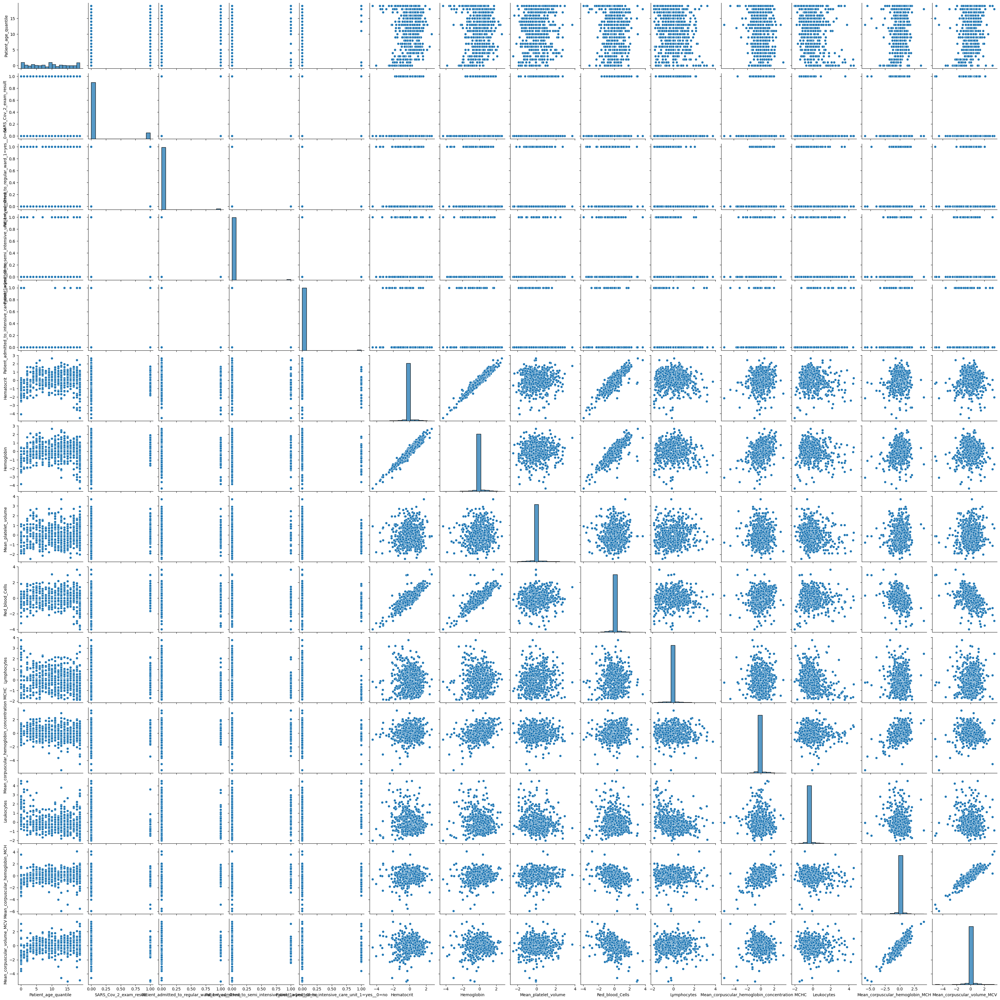

In [51]:
# Code for pairplots
sns.pairplot(df_model)
plt.show()

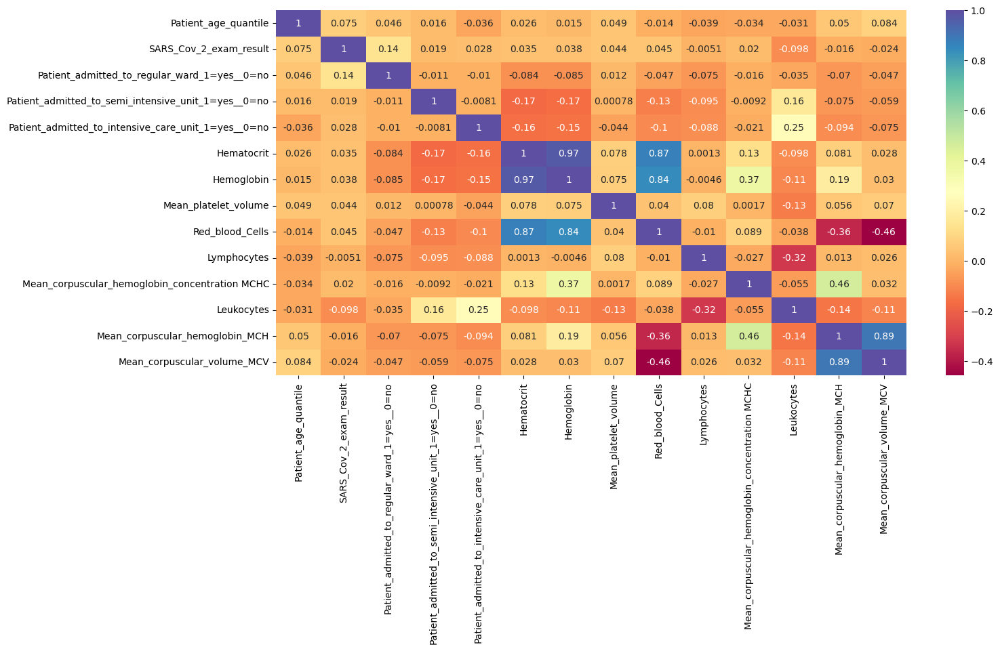

In [52]:
# Code for heatmap
plt.figure(figsize=(15, 7))
sns.heatmap(corr2, annot=True, cmap="Spectral")
plt.show()

#### Observation from Correlation table, Pairplots and Heatmap
There is a strong positive correlation between the following variables;
- Hematocrit & Red blood cells (0.87)
- Hemoglobin & Red blood cells (0.84)
- Mean corpuscular volume & Mean corpuscular hemoglobin (0.89)
- Hematocrit & Hemoglobin (0.97)

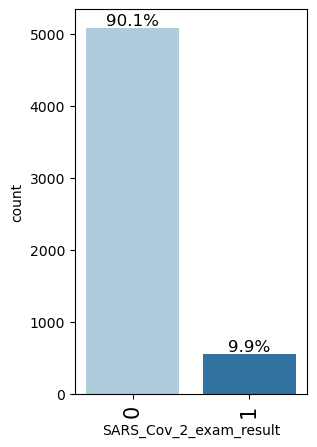

In [53]:
labeled_barplot(df_model,'SARS_Cov_2_exam_result', perc= True) 
plt.show()

In [54]:
df_model['SARS_Cov_2_exam_result'].value_counts()


0    5086
1     558
Name: SARS_Cov_2_exam_result, dtype: int64

#### Comment:
- There are 558 positive Covid-19 cases (9.9%) and 5086 cases that tested negative (90.1%).
- This was the same distribution before data pre-processing.
- The integrity of the data has therefore been maintained

## Recommendations on Analytical Approach

Analytical approaches that may be fit to be applied to this problem are:
1. Logistic Regression
2. Decision Trees
3. Random Forests

### Milestone 3

#### The analytic models will be utilized:
1. Logistic regression
2. Decision Trees
3. Random forests

### Metrics of interest
1. Recall (The ability of the model to pick up positive Covid-19 cases)
2. Accuracy
3. Precision

#### The predictions made by this classification model will translate as follows:

- True positive (TP): Positive SARS_Cov_2_exam_result cases correctly predicted by the model.
- True negative (TN): Negative SARS_Cov_2_exam_result cases correctly predicted by the model.
- False Positive (FP): Cases predicted as positive by the model but are in reality, negative.
- False negative (FN): Cases predicted to be negative by the model but are in reality, positive.



### 1. Split the data

In [55]:
# Separating features and the target column
X = df_model.drop('SARS_Cov_2_exam_result', axis=1)
Y = df_model['SARS_Cov_2_exam_result']

In [56]:
# creating dummy variables

X = pd.get_dummies(
    X,
    columns=X.select_dtypes(include=["object", "category"]).columns.tolist(),
    drop_first=True,
)

# to ensure all variables are of float type
X = X.astype(float)

X.head()

,Patient_age_quantile,Patient_admitted_to_regular_ward_1=yes__0=no,Patient_admitted_to_semi_intensive_unit_1=yes__0=no,Patient_admitted_to_intensive_care_unit_1=yes__0=no,Hematocrit,Hemoglobin,Mean_platelet_volume,Red_blood_Cells,Lymphocytes,Mean_corpuscular_hemoglobin_concentration MCHC,Leukocytes,Mean_corpuscular_hemoglobin_MCH,Mean_corpuscular_volume_MCV,Respiratory_Syncytial_Virus_detected,Respiratory_Syncytial_Virus_not_detected,Influenza_A_detected,Influenza_A_not_detected,Influenza_B_detected,Influenza_B_not_detected,Parainfluenza_1_detected,Parainfluenza_1_not_detected,CoronavirusNL63_detected,CoronavirusNL63_not_detected,Rhinovirus_Enterovirus_detected,Rhinovirus_Enterovirus_not_detected,Coronavirus_HKU1_detected,Coronavirus_HKU1_not_detected,Parainfluenza_3_detected,Parainfluenza_3_not_detected,Chlamydophila_pneumoniae_detected,Chlamydophila_pneumoniae_not_detected,Adenovirus_detected,Adenovirus_not_detected,Parainfluenza_4_detected,Parainfluenza_4_not_detected,Coronavirus229E_detected,Coronavirus229E_not_detected,CoronavirusOC43_detected,CoronavirusOC43_not_detected,Inf_A_H1N1_2009_detected,Inf_A_H1N1_2009_not_detected,Bordetella_pertussis_detected,Bordetella_pertussis_not_detected,Metapneumovirus_detected,Metapneumovirus_not_detected,Parainfluenza_2_not_detected,Influenza_B__rapid_test_negative,Influenza_B__rapid_test_positive,Influenza_A__rapid_test_negative,Influenza_A__rapid_test_positive
0,13.000,0.000,0.000,0.000,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,17.000,0.000,0.000,0.000,0.237,-0.022,0.011,0.102,0.318,-0.951,-0.095,-0.292,0.166,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,1.000,1.000,0.000,1.000,0.000
2,8.000,0.000,0.000,0.000,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,5.000,0.000,0.000,0.000,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,15.000,0.000,0.000,0.000,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,1.000,0.000,0.000,0.000,0.000


In [57]:
# Splitting the data into train and test sets in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.30, random_state=1, shuffle=True)

In [58]:
# adding constant
X = sm.add_constant(X)

# splitting into a temporary and a test set (70:30)
X_temp, X_test, y_temp, y_test = train_test_split(
    X, Y, test_size=0.3, random_state=1, stratify=Y
)

# split temp set into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.35, random_state=1, stratify=y_temp
)

In [59]:
X_train.head()

,const,Patient_age_quantile,Patient_admitted_to_regular_ward_1=yes__0=no,Patient_admitted_to_semi_intensive_unit_1=yes__0=no,Patient_admitted_to_intensive_care_unit_1=yes__0=no,Hematocrit,Hemoglobin,Mean_platelet_volume,Red_blood_Cells,Lymphocytes,Mean_corpuscular_hemoglobin_concentration MCHC,Leukocytes,Mean_corpuscular_hemoglobin_MCH,Mean_corpuscular_volume_MCV,Respiratory_Syncytial_Virus_detected,Respiratory_Syncytial_Virus_not_detected,Influenza_A_detected,Influenza_A_not_detected,Influenza_B_detected,Influenza_B_not_detected,Parainfluenza_1_detected,Parainfluenza_1_not_detected,CoronavirusNL63_detected,CoronavirusNL63_not_detected,Rhinovirus_Enterovirus_detected,Rhinovirus_Enterovirus_not_detected,Coronavirus_HKU1_detected,Coronavirus_HKU1_not_detected,Parainfluenza_3_detected,Parainfluenza_3_not_detected,Chlamydophila_pneumoniae_detected,Chlamydophila_pneumoniae_not_detected,Adenovirus_detected,Adenovirus_not_detected,Parainfluenza_4_detected,Parainfluenza_4_not_detected,Coronavirus229E_detected,Coronavirus229E_not_detected,CoronavirusOC43_detected,CoronavirusOC43_not_detected,Inf_A_H1N1_2009_detected,Inf_A_H1N1_2009_not_detected,Bordetella_pertussis_detected,Bordetella_pertussis_not_detected,Metapneumovirus_detected,Metapneumovirus_not_detected,Parainfluenza_2_not_detected,Influenza_B__rapid_test_negative,Influenza_B__rapid_test_positive,Influenza_A__rapid_test_negative,Influenza_A__rapid_test_positive
5316,1.000,10.000,0.000,0.000,0.000,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
5006,1.000,11.000,0.000,0.000,0.000,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2433,1.000,1.000,0.000,0.000,0.000,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,1.000,0.000
5437,1.000,0.000,0.000,0.000,1.000,-2.121,-2.341,-0.775,-0.973,0.387,-1.747,0.821,-2.697,-2.217,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
5032,1.000,9.000,0.000,0.000,0.000,0.053,0.040,-0.102,0.014,-0.014,-0.055,-0.213,0.126,0.066,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


### 2. Model Building

In [60]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1},
        index=[0],
    )

    return df_perf

In [61]:
# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

### Model Building with original data (Overview)

In [62]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

results1 = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models


# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Cost:" "\n")

for name, model in models:
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train, y=y_train, scoring=scorer, cv=kfold
    )
    results1.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean()))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))


Cross-Validation Cost:

dtree: 0.08258823529411764

Validation Performance:

dtree: 0.06569343065693431


In [63]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(('Logistic Regression', LogisticRegression(random_state=1)))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models


# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")

for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train, y=y_train, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))

print("\n" "Training Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train)) * 100
    print("{}: {}".format(name, scores))


Cross-Validation Performance:

Logistic Regression: 3.9294117647058826
Bagging: 8.658823529411766
Random forest: 5.52156862745098
GBM: 8.658823529411764
Adaboost: 7.482352941176471
dtree: 8.258823529411764

Training Performance:

Logistic Regression: 5.118110236220472
Bagging: 16.92913385826772
Random forest: 17.716535433070867
GBM: 16.535433070866144
Adaboost: 14.173228346456693
dtree: 16.92913385826772


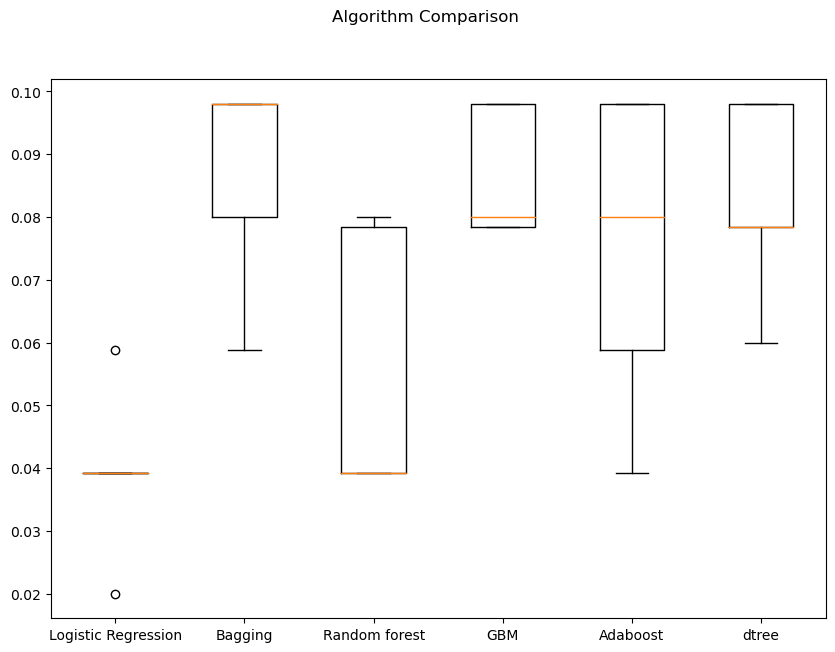

In [64]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure(figsize=(10, 7))

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

#### Comments:
#### - All models have poor recall performance with the original data.
#### - The models will be evaluated individually and undergo techniques that can optimize metrics and performance

### Logistic Rgression Model In Detail

### Important function definitions

In [65]:
# defining a function to compute different metrics to check performance of a classification model built using statsmodels
def model_performance_classification_statsmodels(
    model, predictors, target, threshold=0.5
):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """

    # checking which probabilities are greater than threshold
    pred_temp = model.predict(predictors) > threshold
    # rounding off the above values to get classes
    pred = np.round(pred_temp)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

In [66]:
# defining a function to plot the confusion_matrix of a classification model


def confusion_matrix_statsmodels(model, predictors, target, threshold=0.5):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """
    y_pred = model.predict(predictors) > threshold
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

In [67]:
# fitting the model on training set
logit = sm.Logit(y_train, X_train.astype(float))
lg = logit.fit(
    disp=False
)  # setting disp=False will remove the information on number of iterations

print(lg.summary())

                             Logit Regression Results                             
Dep. Variable:     SARS_Cov_2_exam_result   No. Observations:                 2567
Model:                              Logit   Df Residuals:                     2533
Method:                               MLE   Df Model:                           33
Date:                    Sat, 11 Feb 2023   Pseudo R-squ.:                 0.09229
Time:                            06:36:12   Log-Likelihood:                -752.07
converged:                          False   LL-Null:                       -828.54
Covariance Type:                nonrobust   LLR p-value:                 2.324e-17
                                                          coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------
const                                                  -2.9542      0.340     -8.694      0.000 

/Users/kofori/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


### Model performance evaluation

In [68]:
# predicting on training set
# default threshold is 0.5, if predicted probability is greater than 0.5 the observation will be classified as 1

pred_train = lg.predict(X_train) > 0.5
pred_train = np.round(pred_train)

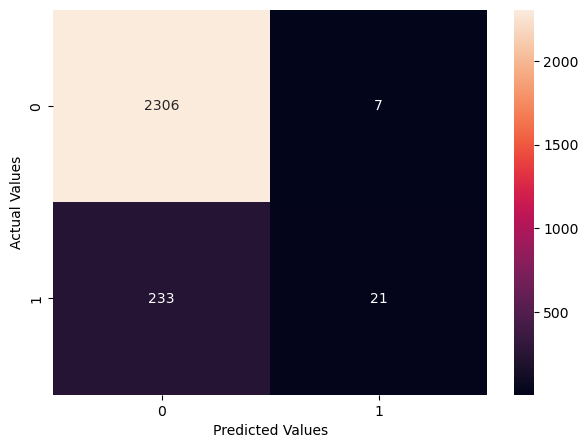

In [69]:
cm = confusion_matrix(y_train, pred_train)
plt.figure(figsize=(7, 5))
sns.heatmap(cm, annot=True, fmt="g")
plt.xlabel("Predicted Values")
plt.ylabel("Actual Values")
plt.show()

The confusion matrix for training set

- True Positives (TP): There are 21 true positive Covid-19 cases.
- True Negatives (TN): There are 2306 true negative Covid-19 cases.
- False Positives (FP): The model predicted 7 false positive cases.
- False Negatives (FN): The model predicted 233 false negatives.

### Checking for Multicolinearity

In [70]:
# let's check the VIF of the predictors
vif_series = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
    dtype=float,
)
print("VIF values: \n\n{}\n".format(vif_series))

VIF values: 

const                                                   16.383
Patient_age_quantile                                     1.106
Patient_admitted_to_regular_ward_1=yes__0=no             1.175
Patient_admitted_to_semi_intensive_unit_1=yes__0=no      1.168
Patient_admitted_to_intensive_care_unit_1=yes__0=no      1.148
Hematocrit                                            1247.367
Hemoglobin                                            1362.359
Mean_platelet_volume                                     1.079
Red_blood_Cells                                         96.796
Lymphocytes                                              1.211
Mean_corpuscular_hemoglobin_concentration MCHC          85.543
Leukocytes                                               1.326
Mean_corpuscular_hemoglobin_MCH                        149.056
Mean_corpuscular_volume_MCV                            157.850
Respiratory_Syncytial_Virus_detected                       inf
Respiratory_Syncytial_Virus_not_detected 

#### Observations:

Features with VIF greater than 5 are:
- Hematocrit
- Hemoglobin
- Red_blood_Cells
- Mean_platelet_volume
- Mean_corpuscular_hemoglobin_MCH
- Mean_corpuscular_volume_MCV

#### Next step will be to drop the above features individually and then recheck multicolinearity

In [71]:
X_train2 = X_train.drop(["Hematocrit"], axis=1)
logit = sm.Logit(y_train, X_train2.astype(float))
lg = logit.fit(
    disp=False
)  # setting disp=False will remove the information on number of iterations

print(lg.summary())

                             Logit Regression Results                             
Dep. Variable:     SARS_Cov_2_exam_result   No. Observations:                 2567
Model:                              Logit   Df Residuals:                     2534
Method:                               MLE   Df Model:                           32
Date:                    Sat, 11 Feb 2023   Pseudo R-squ.:                 -0.3301
Time:                            06:36:13   Log-Likelihood:                -1102.1
converged:                          False   LL-Null:                       -828.54
Covariance Type:                nonrobust   LLR p-value:                     1.000
                                                          coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------
const                                                  -2.9533      0.344     -8.583      0.000 

/Users/kofori/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [72]:
# let's check the VIF of the predictors
vif_series = pd.Series(
    [variance_inflation_factor(X_train2.values, i) for i in range(X_train2.shape[1])],
    index=X_train2.columns,
    dtype=float,
)
print("VIF values: \n\n{}\n".format(vif_series))

VIF values: 

const                                                  16.331
Patient_age_quantile                                    1.104
Patient_admitted_to_regular_ward_1=yes__0=no            1.168
Patient_admitted_to_semi_intensive_unit_1=yes__0=no     1.164
Patient_admitted_to_intensive_care_unit_1=yes__0=no     1.146
Hemoglobin                                             79.025
Mean_platelet_volume                                    1.071
Red_blood_Cells                                        90.763
Lymphocytes                                             1.196
Mean_corpuscular_hemoglobin_concentration MCHC         30.896
Leukocytes                                              1.324
Mean_corpuscular_hemoglobin_MCH                       143.537
Mean_corpuscular_volume_MCV                           145.782
Respiratory_Syncytial_Virus_detected                      inf
Respiratory_Syncytial_Virus_not_detected                  inf
Influenza_A_detected                                    

#### Comment

- Not much changed in the VIF values after droppinf 'Hematocrit'
- Variables with VIF >5.will therefore be dropped until the issue of multicolinearity is resolved.

In [73]:
### Dropping all variables with VIF >5
X_train3 = X_train2.drop(["Red_blood_Cells", "Hemoglobin","Mean_corpuscular_hemoglobin_MCH"], axis=1)
logit = sm.Logit(y_train, X_train3.astype(float))
lg = logit.fit(
    disp=False
)  # setting disp=False will remove the information on number of iterations

print(lg.summary())

                             Logit Regression Results                             
Dep. Variable:     SARS_Cov_2_exam_result   No. Observations:                 2567
Model:                              Logit   Df Residuals:                     2537
Method:                               MLE   Df Model:                           29
Date:                    Sat, 11 Feb 2023   Pseudo R-squ.:                 0.09159
Time:                            06:36:13   Log-Likelihood:                -752.65
converged:                          False   LL-Null:                       -828.54
Covariance Type:                nonrobust   LLR p-value:                 1.397e-18
                                                          coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------
const                                                  -2.8293      0.173    -16.309      0.000 

/Users/kofori/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [74]:
# let's check the VIF of the predictors
vif_series = pd.Series(
    [variance_inflation_factor(X_train3.values, i) for i in range(X_train3.shape[1])],
    index=X_train3.columns,
    dtype=float,
)
print("VIF values: \n\n{}\n".format(vif_series))

VIF values: 

const                                                 5.222
Patient_age_quantile                                  1.087
Patient_admitted_to_regular_ward_1=yes__0=no          1.059
Patient_admitted_to_semi_intensive_unit_1=yes__0=no   1.116
Patient_admitted_to_intensive_care_unit_1=yes__0=no   1.100
Mean_platelet_volume                                  1.057
Lymphocytes                                           1.165
Mean_corpuscular_hemoglobin_concentration MCHC        1.026
Leukocytes                                            1.272
Mean_corpuscular_volume_MCV                           1.029
Respiratory_Syncytial_Virus_detected                    inf
Respiratory_Syncytial_Virus_not_detected                inf
Influenza_A_detected                                    inf
Influenza_A_not_detected                                inf
Influenza_B_detected                                    inf
Influenza_B_not_detected                                inf
Parainfluenza_1_detected  

#### Observation:
- None of the variables exhibit high multicollinearity (VIF >5).
- The values in this summary are therefore reliable

### Using coefficients of the model to find odds 

In [75]:
# converting coefficients to odds
odds = np.exp(lg.params)

# finding the percentage change
perc_change_odds = (np.exp(lg.params) - 1) * 100

# removing limit from number of columns to display
pd.set_option("display.max_columns", None)

# adding the odds to a dataframe
pd.DataFrame({"Odds": odds, "Change_odd%": perc_change_odds}, index=X_train3.columns).T

,const,Patient_age_quantile,Patient_admitted_to_regular_ward_1=yes__0=no,Patient_admitted_to_semi_intensive_unit_1=yes__0=no,Patient_admitted_to_intensive_care_unit_1=yes__0=no,Mean_platelet_volume,Lymphocytes,Mean_corpuscular_hemoglobin_concentration MCHC,Leukocytes,Mean_corpuscular_volume_MCV,Respiratory_Syncytial_Virus_detected,Respiratory_Syncytial_Virus_not_detected,Influenza_A_detected,Influenza_A_not_detected,Influenza_B_detected,Influenza_B_not_detected,Parainfluenza_1_detected,Parainfluenza_1_not_detected,CoronavirusNL63_detected,CoronavirusNL63_not_detected,Rhinovirus_Enterovirus_detected,Rhinovirus_Enterovirus_not_detected,Coronavirus_HKU1_detected,Coronavirus_HKU1_not_detected,Parainfluenza_3_detected,Parainfluenza_3_not_detected,Chlamydophila_pneumoniae_detected,Chlamydophila_pneumoniae_not_detected,Adenovirus_detected,Adenovirus_not_detected,Parainfluenza_4_detected,Parainfluenza_4_not_detected,Coronavirus229E_detected,Coronavirus229E_not_detected,CoronavirusOC43_detected,CoronavirusOC43_not_detected,Inf_A_H1N1_2009_detected,Inf_A_H1N1_2009_not_detected,Bordetella_pertussis_detected,Bordetella_pertussis_not_detected,Metapneumovirus_detected,Metapneumovirus_not_detected,Parainfluenza_2_not_detected,Influenza_B__rapid_test_negative,Influenza_B__rapid_test_positive,Influenza_A__rapid_test_negative,Influenza_A__rapid_test_positive
Odds,0.059,1.037,8.452,2.017,14.623,1.198,0.524,1.117,0.177,0.641,0.000,86.097,0.000,6.356,0.001,0.004,0.000,3.572,0.001,0.002,0.001,0.007,0.000,1.068,0.000,3.387,0.000,28.924,0.000,0.634,0.000,1.477,0.000,34.163,0.000,17.045,0.000,216.355,0.000,6.378,0.000,29.817,0.000,0.004,0.000,206.793,0.000
Change_odd%,-94.094,3.702,745.212,101.693,1362.333,19.820,-47.568,11.706,-82.257,-35.911,-100.000,8509.704,-100.000,535.565,-99.909,-99.620,-100.000,257.242,-99.853,-99.765,-99.949,-99.323,-100.000,6.839,-100.000,238.734,-100.000,2792.426,-99.999,-36.554,-100.000,47.710,-100.000,3316.288,-100.000,1604.452,-100.000,21535.479,-100.000,537.845,-100.000,2881.663,-100.000,-99.605,-99.952,20579.273,-100.000


### Key Coefficient interpretations
- A patient being admitted to the ward with flu-like symptoms increases likelihood of a possible covid-19 infection by 8.45
- Being in the intensive unit with flu-like symptoms makes it 14.62 times more likely that a patient is Covid-19 positive.
- Low Lymphocyte levels reduce likelihood of Covid-19 by 45.57%

### Logistic regression model performance on the training set

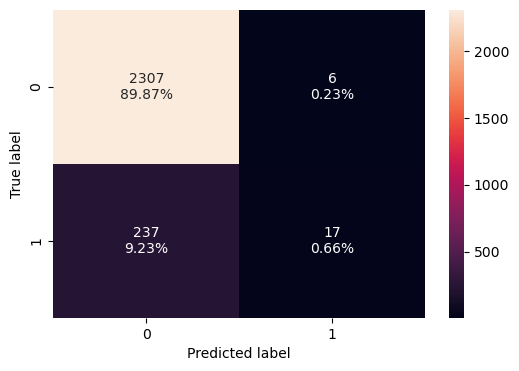

In [76]:
# creating confusion matrix
confusion_matrix_statsmodels(lg, X_train3, y_train)

#### Observations
- True Positives (TP): There are 17 true positive Covid-19 cases.
- True Negatives (TN): There are 2306 true negative Covid-19 cases.
- False Positives (FP): The model predicted 6 false positive cases.
- False Negatives (FN): The model predicted 237 false negatives.

In [77]:
log_reg_model_train_perf = model_performance_classification_statsmodels(
    lg, X_train3, y_train
)

print("Training performance:")
log_reg_model_train_perf

Training performance:


,Accuracy,Recall,Precision,F1
0,0.905,0.067,0.739,0.123


#### Comment
Although the accuracy and pecision of the model are fairly good, recall is poor (6.7%)

### ROC-AUC

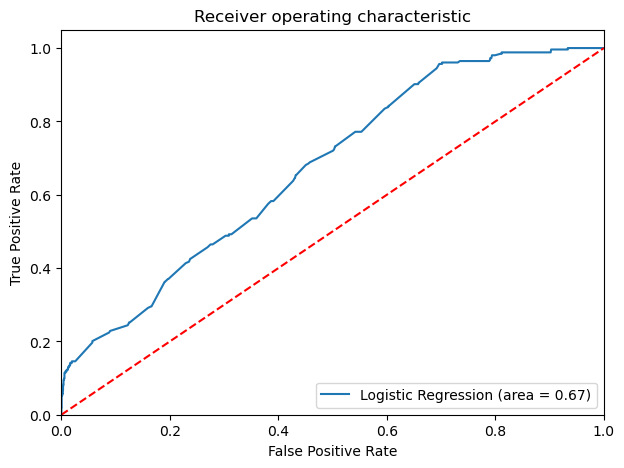

In [78]:
logit_roc_auc_train = roc_auc_score(y_train, lg.predict(X_train3))
fpr, tpr, thresholds = roc_curve(y_train, lg.predict(X_train3))
plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, label="Logistic Regression (area = %0.2f)" % logit_roc_auc_train)
plt.plot([0, 1], [0, 1], "r--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend(loc="lower right")
plt.show()

####Observation:

- Logistic Regression model has a poor recall and but a fair ROC-AUC score 
- This means that in terms of accuracy, this model performs relatively well

### Using Precision-Recall curve to find a threshold

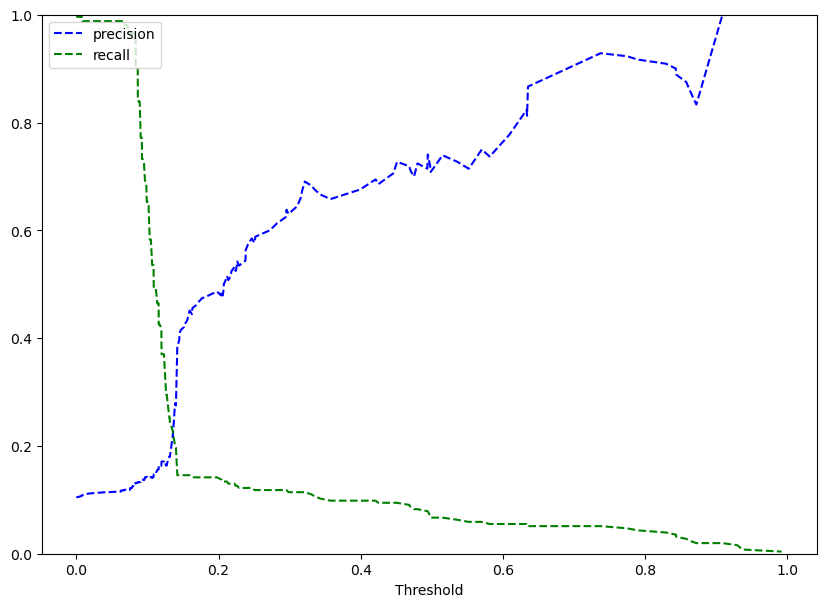

In [79]:
y_scores = lg.predict(X_train3)
prec, rec, tre = precision_recall_curve(y_train, y_scores,)


def plot_prec_recall_vs_tresh(precisions, recalls, thresholds):
    plt.plot(thresholds, precisions[:-1], "b--", label="precision")
    plt.plot(thresholds, recalls[:-1], "g--", label="recall")
    plt.xlabel("Threshold")
    plt.legend(loc="upper left")
    plt.ylim([0, 1])


plt.figure(figsize=(10, 7))
plot_prec_recall_vs_tresh(prec, rec, tre)
plt.show()

#### Observation:

At threshold of about 0.16, precision=recall

In [80]:
# setting the threshold
optimal_threshold_curve = 0.16

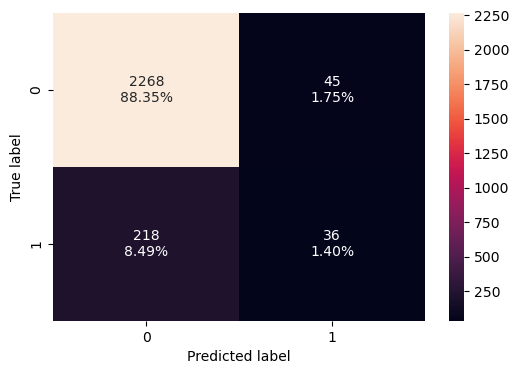

In [81]:
# creating confusion matrix
confusion_matrix_statsmodels(lg, X_train3, y_train, threshold=optimal_threshold_curve)

In [82]:
log_reg_model_train_perf_threshold_curve = model_performance_classification_statsmodels(
    lg, X_train3, y_train, threshold=optimal_threshold_curve
)
print("Training performance:")
log_reg_model_train_perf_threshold_curve

Training performance:


,Accuracy,Recall,Precision,F1
0,0.898,0.142,0.444,0.215


#### Observation
By using the optimal threshold;
- The recall improved to 14% albeit still low.
- The number of true positives increased to 36
- The number of false negatives decreased (218).

### Performance on the validation set

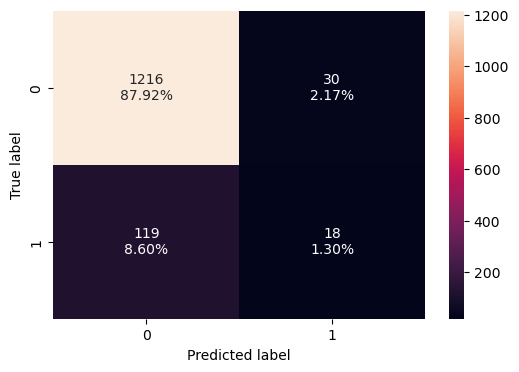

In [83]:
X_val_3 = X_val[X_train3.columns].astype(float)
# creating confusion matrix
confusion_matrix_statsmodels(lg, X_val_3, y_val, threshold=optimal_threshold_curve)



In [84]:
log_reg_model_test_perf = model_performance_classification_statsmodels(
    lg, X_val_3, y_val, threshold=optimal_threshold_curve
)

print("Validation set performance:")
log_reg_model_test_perf

Validation set performance:


,Accuracy,Recall,Precision,F1
0,0.892,0.131,0.375,0.195


#### Observation:
- Performance on the validation set is about the same as that of the training set.
- The model is generalizing well.
- Although accuracy is good (89%), recall is still low (13%)
- This implies that the model is unable to effectively pick up positive cases

### Logistic regession performance on the test set

Test performance:


,Accuracy,Recall,Precision,F1
0,0.901,0.162,0.500,0.244


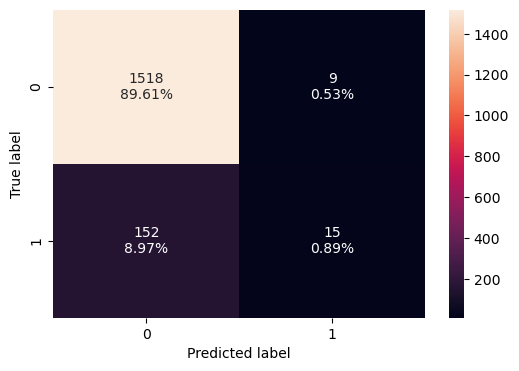

In [85]:
X_test3 = X_test[X_train3.columns].astype(float)
# creating confusion matrix
confusion_matrix_statsmodels(lg, X_test3, y_test)

log_reg_model_test_perf_threshold_curve = model_performance_classification_statsmodels(
    lg, X_test3, y_test, threshold=optimal_threshold_curve
)
print("Test performance:")
log_reg_model_test_perf_threshold_curve

### Final Model Summary for Logistic Regression

In [86]:
print(lg.summary())

                             Logit Regression Results                             
Dep. Variable:     SARS_Cov_2_exam_result   No. Observations:                 2567
Model:                              Logit   Df Residuals:                     2537
Method:                               MLE   Df Model:                           29
Date:                    Sat, 11 Feb 2023   Pseudo R-squ.:                 0.09159
Time:                            06:36:16   Log-Likelihood:                -752.65
converged:                          False   LL-Null:                       -828.54
Covariance Type:                nonrobust   LLR p-value:                 1.397e-18
                                                          coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------
const                                                  -2.8293      0.173    -16.309      0.000 

#### Key Observations
- The model performs well on both training and test data sets
- The recall on the test setis 16.2%.
- Using the model with default threshold the model will give a low recall but good precision scores.
- Using the model with 0.16 threshold the model will give a balance recall and precision score - Some features of value (p value <0.05) are:
1. Patient_age_quantile
2. Patient_admitted_to_regular_ward_1=yes__0=no
3. Patient_admitted_to_intensive_care_unit_1=yes__0=no
4. Lymphocytes
5. Leukocytes

### Decision Trees in detail

In [87]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

In [88]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

In [89]:
## Function to create confusion matrix
def make_confusion_matrix(model,y_actual,labels=[1, 0]):
    '''
    model : classifier to predict values of X
    y_actual : ground truth  
    
    '''
    y_predict = model.predict(X_test)
    cm=metrics.confusion_matrix( y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["Actual - No","Actual - Yes"]],
                  columns = [i for i in ['Predicted - No','Predicted - Yes']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (10,7))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [90]:
##  Function to calculate different metric scores of the model - Accuracy, Recall and Precision
def get_metrics_score(model,flag=True):
    '''
    model : classifier to predict values of X

    '''
    # defining an empty list to store train and test results
    score_list=[] 
    
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    
    train_acc = model.score(X_train,y_train)
    test_acc = model.score(X_test,y_test)
    
    train_recall = metrics.recall_score(y_train,pred_train)
    test_recall = metrics.recall_score(y_test,pred_test)
    
    train_precision = metrics.precision_score(y_train,pred_train)
    test_precision = metrics.precision_score(y_test,pred_test)
    
    score_list.extend((train_acc,test_acc,train_recall,test_recall,train_precision,test_precision))
        
    # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True: 
        print("Accuracy on training set : ",model.score(X_train,y_train))
        print("Accuracy on test set : ",model.score(X_test,y_test))
        print("Recall on training set : ",metrics.recall_score(y_train,pred_train))
        print("Recall on test set : ",metrics.recall_score(y_test,pred_test))
        print("Precision on training set : ",metrics.precision_score(y_train,pred_train))
        print("Precision on test set : ",metrics.precision_score(y_test,pred_test))
    
    return score_list # returning the list with train and test scores

In [91]:
model = DecisionTreeClassifier(random_state=1)
model.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

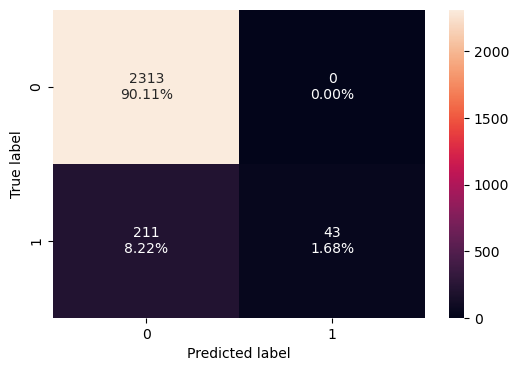

In [92]:
confusion_matrix_sklearn(model, X_train, y_train)

In [93]:
decision_tree_perf_train = model_performance_classification_sklearn(
    model, X_train, y_train
)
decision_tree_perf_train

,Accuracy,Recall,Precision,F1
0,0.918,0.169,1.000,0.290


#### Observation:
1. The model was able to predict 65 true positive cases and 3559 true negative cases in the training set.
2. It did not predict any false positive cases.
3. It has an accuracy of 91.75%, recall of 16.62% and a precision of 100%

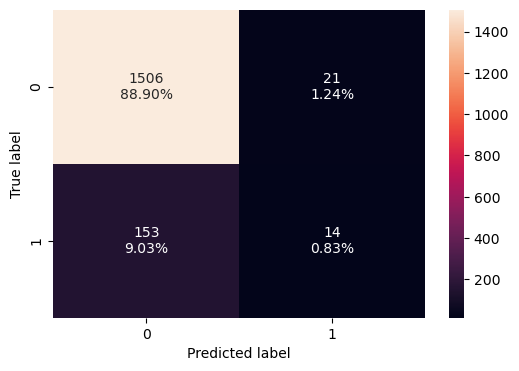

In [94]:
confusion_matrix_sklearn(model, X_test, y_test)

In [95]:
decision_tree_perf_test = model_performance_classification_sklearn(
    model, X_test, y_test
)
decision_tree_perf_test

,Accuracy,Recall,Precision,F1
0,0.897,0.084,0.400,0.139


#### Observation:
In the test set;
1. The model predicted 1502 true negative cases and 21 true positive cases.
2. The model has 90% accuracy, 12.57% recall and 45.65% precision

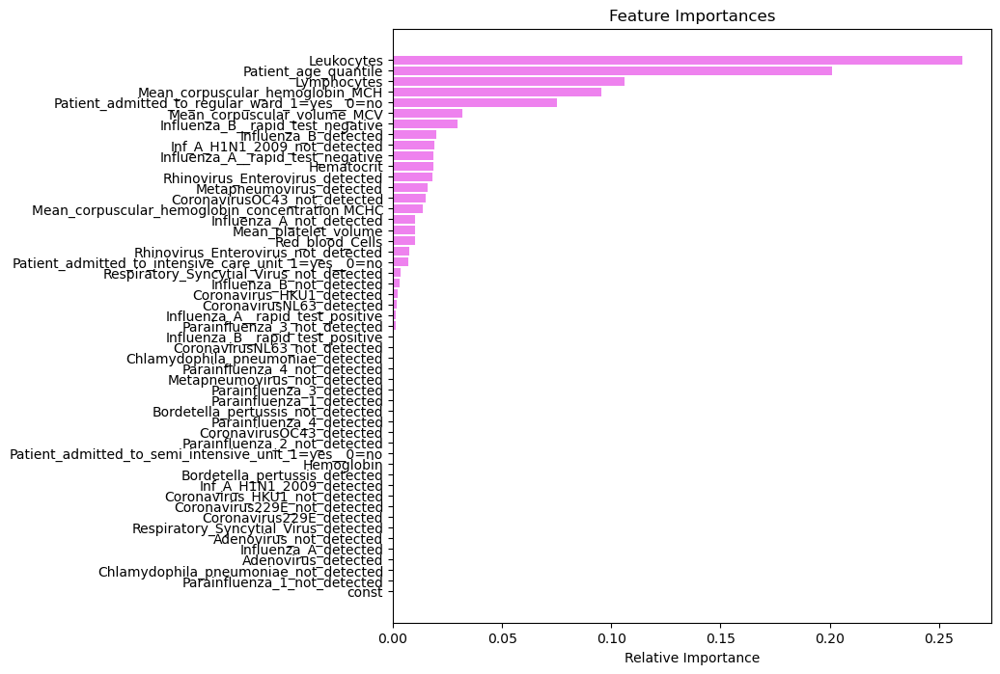

In [96]:
feature_names = list(X_train.columns)
importances = model.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(8, 8))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

#### Observation:
The top 5 features of importance are:
- Leukocytes
- Patient_age_quantile
- Patient_admitted_to_regular_ward_1=yes_0=no
- Lymphocytes
- MCV

### Building bagging and boosting models

### Bagging Model

In [97]:
#base_estimator for bagging classifier is a decision tree by default
bagging_estimator=BaggingClassifier(random_state=1)
bagging_estimator.fit(X_train,y_train)

BaggingClassifier(random_state=1)

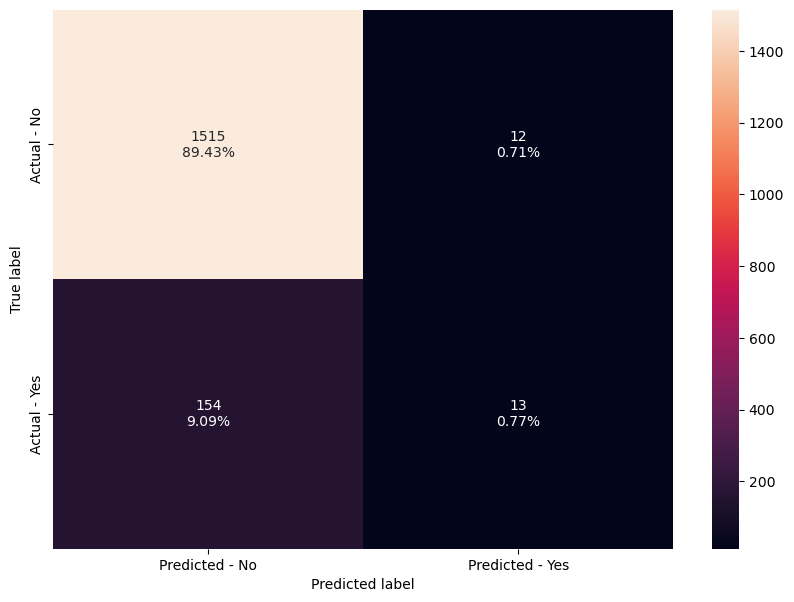

In [98]:
make_confusion_matrix(bagging_estimator,y_test)

In [99]:
#Using above defined function to get accuracy, recall and precision on train and test set
bagging_estimator_score=get_metrics_score(bagging_estimator)

Accuracy on training set :  0.9170237631476431
Accuracy on test set :  0.9020070838252656
Recall on training set :  0.16929133858267717
Recall on test set :  0.07784431137724551
Precision on training set :  0.9555555555555556
Precision on test set :  0.52


#### Observation:
- The model classifier's accuracy is similar in both the train set and test set.

### Random Forest Classifier in detail

In [100]:
#Train the random forest classifier
rf_estimator=RandomForestClassifier(random_state=1)
rf_estimator.fit(X_train,y_train)

RandomForestClassifier(random_state=1)

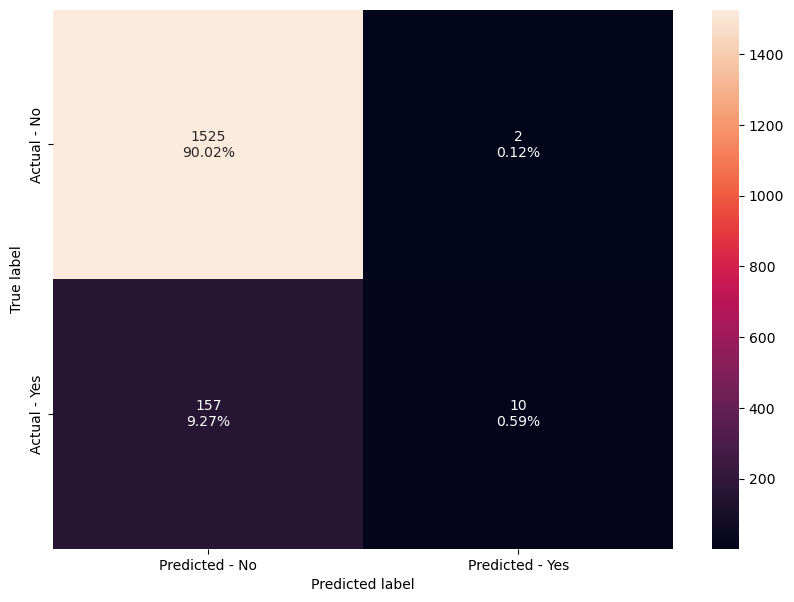

In [101]:
make_confusion_matrix(rf_estimator,y_test)

In [102]:
#Using above defined function to get accuracy, recall and precision on train and test set
rf_estimator_score=get_metrics_score(rf_estimator)

Accuracy on training set :  0.917802882742501
Accuracy on test set :  0.9061393152302243
Recall on training set :  0.17716535433070865
Recall on test set :  0.059880239520958084
Precision on training set :  0.9574468085106383
Precision on test set :  0.8333333333333334


#### Observation:
- The model classifier's accuracy is similar in both the train set and test set.
- Both the bagging classifier and random forest classifier are performing well in the train and test sets using default parameters

### Hyperparameter Tuning

### Bagging Classifier

In [103]:
# Choose the type of classifier. 
bagging_estimator_tuned = BaggingClassifier(random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {'max_samples': [0.7,0.8,0.9,1], 
              'max_features': [0.7,0.8,0.9,1],
              'n_estimators' : [10,20,30,40,50],
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(bagging_estimator_tuned, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
bagging_estimator_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
bagging_estimator_tuned.fit(X_train, y_train)

BaggingClassifier(max_features=0.9, max_samples=0.9, n_estimators=40,
                  random_state=1)

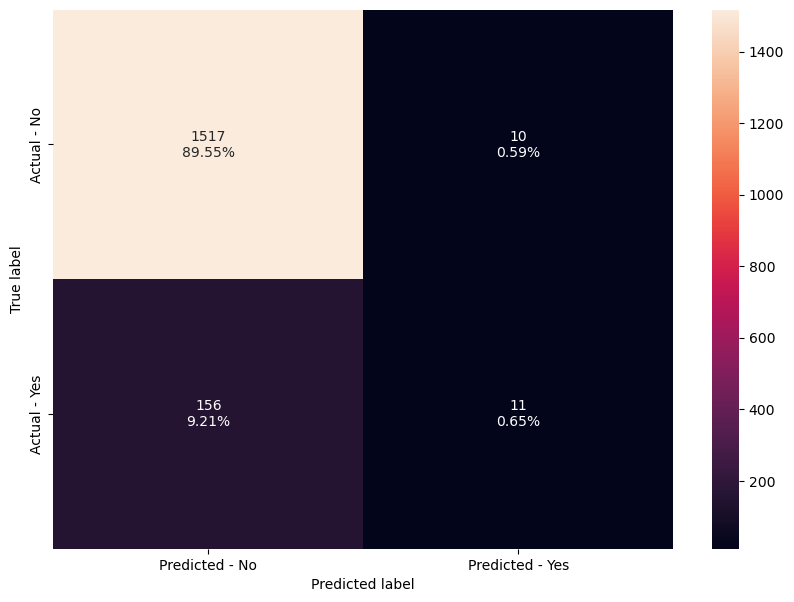

In [104]:
make_confusion_matrix(bagging_estimator_tuned, y_test)

In [105]:
#Using above defined function to get accuracy, recall and precision on train and test set
bagging_estimator_tuned_score=get_metrics_score(bagging_estimator_tuned)

Accuracy on training set :  0.917802882742501
Accuracy on test set :  0.9020070838252656
Recall on training set :  0.16929133858267717
Recall on test set :  0.0658682634730539
Precision on training set :  1.0
Precision on test set :  0.5238095238095238


#### Observation:
The bagging classifier is about the same after hypertuning

### Using logistic regression as the base estimator for bagging classifier

In [106]:
bagging_lr=BaggingClassifier(base_estimator=LogisticRegression(solver='liblinear',random_state=1,max_iter=1000),random_state=1)
bagging_lr.fit(X_train,y_train)

BaggingClassifier(base_estimator=LogisticRegression(max_iter=1000,
                                                    random_state=1,
                                                    solver='liblinear'),
                  random_state=1)

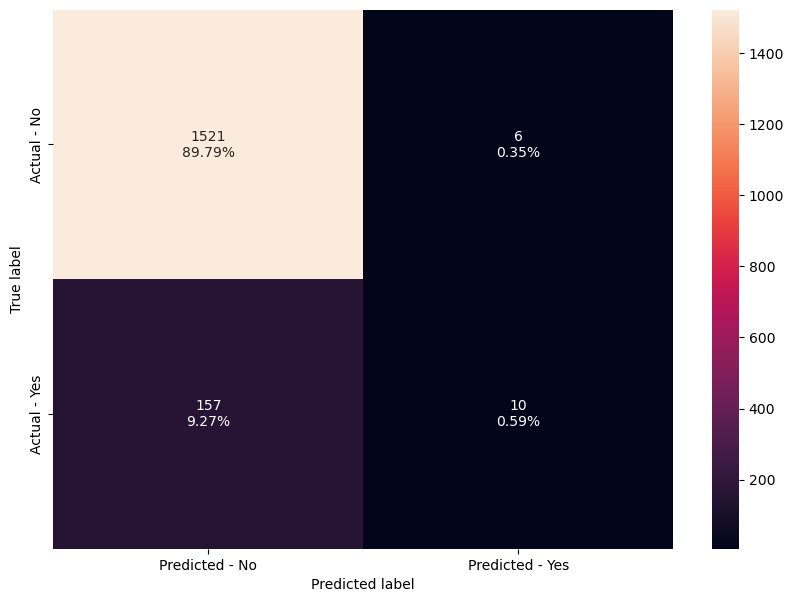

In [107]:
make_confusion_matrix(bagging_lr,y_test)

In [108]:
#Using above defined function to get accuracy, recall and precision on train and test set
bagging_lr_score=get_metrics_score(bagging_lr)

Accuracy on training set :  0.9045578496299181
Accuracy on test set :  0.9037780401416765
Recall on training set :  0.051181102362204724
Recall on test set :  0.059880239520958084
Precision on training set :  0.7647058823529411
Precision on test set :  0.625


#### Observation
- The model performs well on both training and test sets. It is not overfitting.
- Recall is approximately 6%
- It is better at predicting true negative cases than positive.

### Random Forest Classifier

In [109]:
# Choose the type of classifier. 
rf_estimator_tuned = RandomForestClassifier(random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {"n_estimators": [15,26,5],
    "min_samples_leaf": np.arange(5, 10),
    "max_features": ['sqrt', 'log2'],
    "max_samples": np.arange(5, 10, 5),
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(rf_estimator_tuned, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
rf_estimator_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
rf_estimator_tuned.fit(X_train, y_train)

RandomForestClassifier(max_features='sqrt', max_samples=5, min_samples_leaf=5,
                       n_estimators=15, random_state=1)

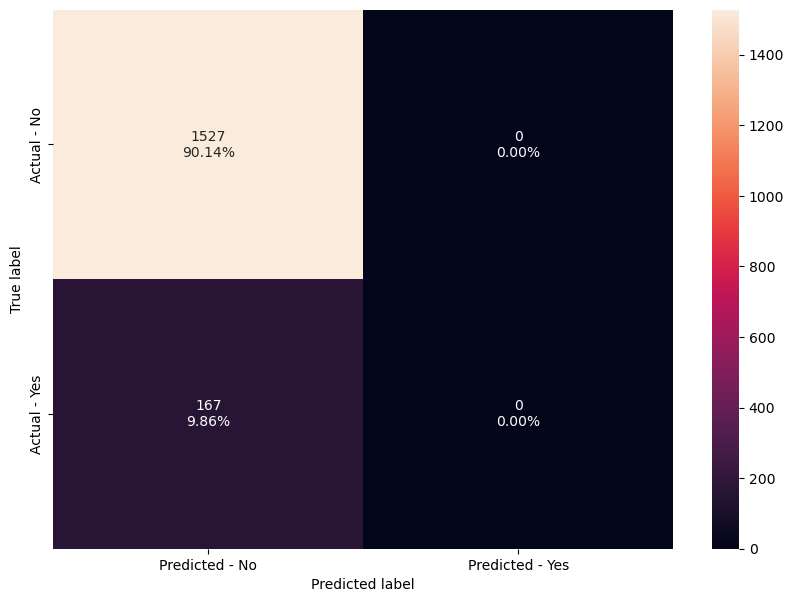

In [110]:
make_confusion_matrix(rf_estimator_tuned,y_test)

In [111]:
#Using above defined function to get accuracy, recall and precision on train and test set
rf_estimator_tuned_score=get_metrics_score(rf_estimator_tuned)

Accuracy on training set :  0.901051811453058
Accuracy on test set :  0.9014167650531287
Recall on training set :  0.0
Recall on test set :  0.0
Precision on training set :  0.0
Precision on test set :  0.0


#### Observation:
Although this model has is not overfitting, it has poor precision and recall

### Using class_weights for random forest

In [112]:
rf_wt = RandomForestClassifier(class_weight={0:0.4,1:0.6}, random_state=1)
rf_wt.fit(X_train,y_train)

RandomForestClassifier(class_weight={0: 0.4, 1: 0.6}, random_state=1)

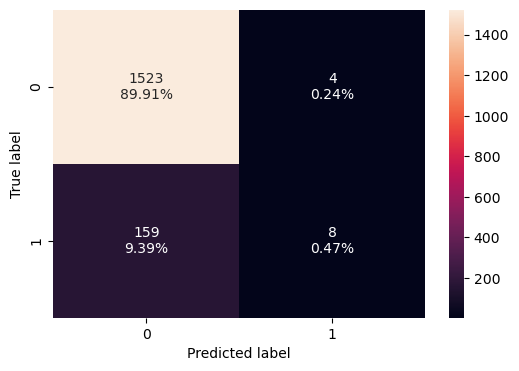

In [113]:
confusion_matrix_sklearn(rf_wt, X_test,y_test)

In [114]:
rf_wt_model_train_perf=model_performance_classification_sklearn(rf_wt, X_train,y_train)
print("Training performance \n",rf_wt_model_train_perf)

Training performance 
    Accuracy  Recall  Precision    F1
0     0.917   0.185      0.904 0.307


In [115]:
rf_wt_model_test_perf=model_performance_classification_sklearn(rf_wt, X_test,y_test)
print("Testing performance \n",rf_wt_model_test_perf)

Testing performance 
    Accuracy  Recall  Precision    F1
0     0.904   0.048      0.667 0.089


#### Observation
Precision and recall have improved in the weighted class model

### Importance of features

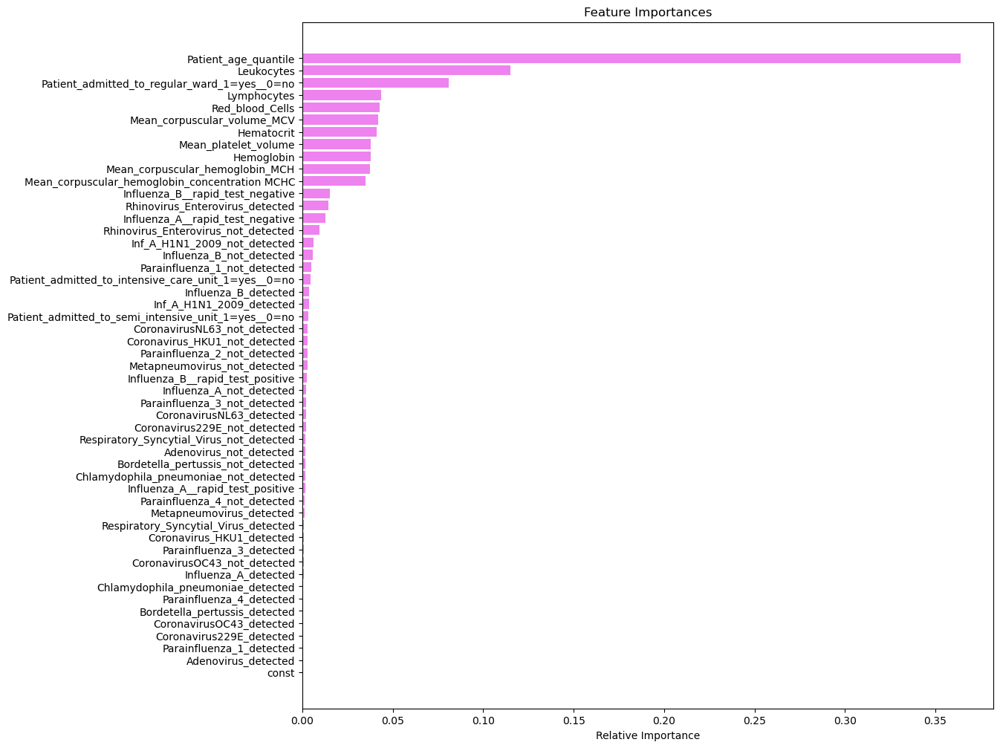

In [116]:
importances = rf_wt.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

#### Observation:
The top 5 features in the class-weights random forest model are:
- Patient_age_quantile
- Leukocytes
- Patient_admitted_to_regular_ward_1=yes_0=no
- Hematocrit
- Mean_platelet_volume

### Boosting Models

The model will be boosted with:
1. Adaboost
2. Gradient boosting classifier

### 1. AdaBoost

In [117]:
abc = AdaBoostClassifier(random_state=1)
abc.fit(X_train,y_train)

AdaBoostClassifier(random_state=1)

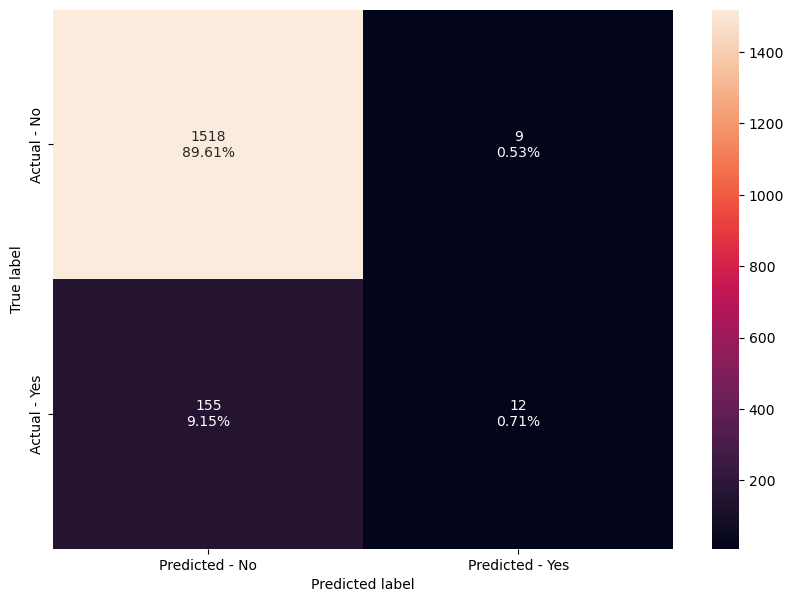

In [118]:
make_confusion_matrix(abc,y_test)

In [119]:
#Code to determine accuracy, recall and precision on train and test set
abc_score=get_metrics_score(abc)

Accuracy on training set :  0.9139072847682119
Accuracy on test set :  0.9031877213695395
Recall on training set :  0.14173228346456693
Recall on test set :  0.0718562874251497
Precision on training set :  0.9230769230769231
Precision on test set :  0.5714285714285714


### 2. Gradient Boosting Classifier

In [120]:
gbc = GradientBoostingClassifier(random_state=1)
gbc.fit(X_train,y_train)

GradientBoostingClassifier(random_state=1)

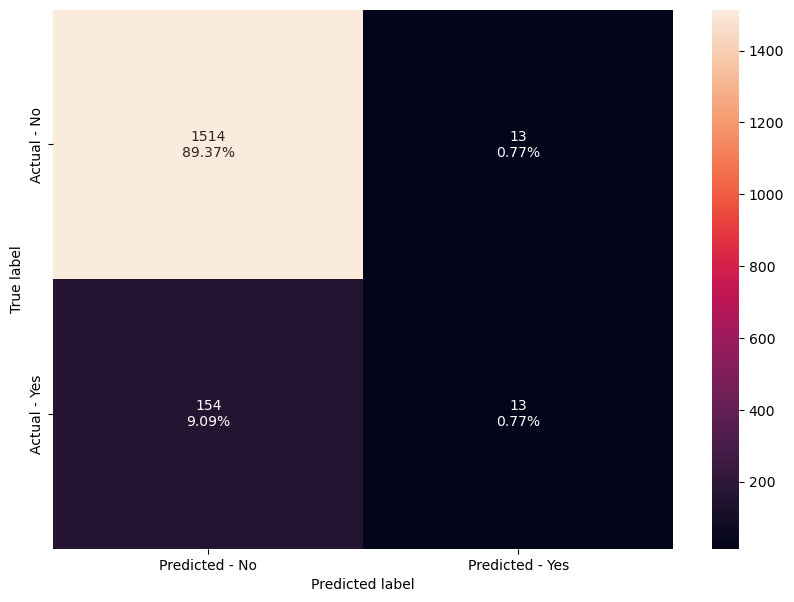

In [121]:
make_confusion_matrix(gbc,y_test)

In [122]:
#Determining accuracy, recall and precision on train and test set
gbc_score=get_metrics_score(gbc)

Accuracy on training set :  0.9170237631476431
Accuracy on test set :  0.9014167650531287
Recall on training set :  0.16535433070866143
Recall on test set :  0.07784431137724551
Precision on training set :  0.9767441860465116
Precision on test set :  0.5


#### Observations:
- Both boosting models perform well in both traing and test sets under default parameters. 
- Recall has improved significantly in both boosting models.
- Precision has also improved although not ideal.

### Hyperparameter Tuning

### 1. AdaBoost Classifier

In [123]:
# Choose the type of classifier. 
abc_tuned = AdaBoostClassifier(random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    #Let's try different max_depth for base_estimator
    "base_estimator":[DecisionTreeClassifier(max_depth=1, random_state=1),DecisionTreeClassifier(max_depth=2, random_state=1),DecisionTreeClassifier(max_depth=3, random_state=1)],
    "n_estimators": np.arange(15,26,5),
    "learning_rate":np.arange(0.1,2,0.1)
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(abc_tuned, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
abc_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
abc_tuned.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3,
                                                         random_state=1),
                   learning_rate=0.8, n_estimators=15, random_state=1)

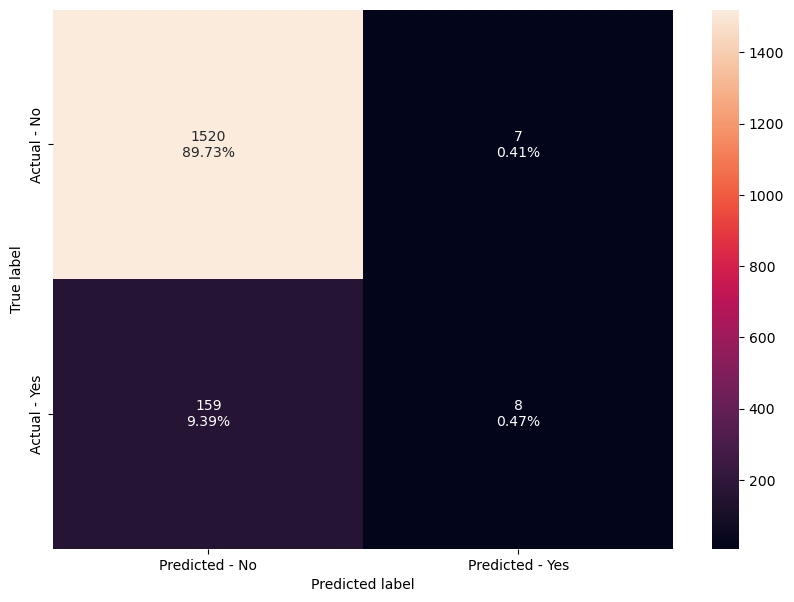

In [124]:
make_confusion_matrix(abc_tuned,y_test)

In [125]:
#Using above defined function to get accuracy, recall and precision on train and test set
abc_tuned_score=get_metrics_score(abc_tuned)

Accuracy on training set :  0.9170237631476431
Accuracy on test set :  0.9020070838252656
Recall on training set :  0.16535433070866143
Recall on test set :  0.04790419161676647
Precision on training set :  0.9767441860465116
Precision on test set :  0.5333333333333333


### 2. Gradient Boosting Classifier (Hyperparameter tuning)

In [126]:
#Using AdaBoost classifier as the estimator for initial predictions
gbc_init = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)
gbc_init.fit(X_train,y_train)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           random_state=1)

In [127]:
gbc_init_score=get_metrics_score(gbc_init)

Accuracy on training set :  0.9166342033502143
Accuracy on test set :  0.9020070838252656
Recall on training set :  0.16141732283464566
Recall on test set :  0.07784431137724551
Precision on training set :  0.9761904761904762
Precision on test set :  0.52


In [128]:
# Choose the type of classifier. 
gbc_tuned = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    "n_estimators": [15,26,5],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,0.9,1]
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(gbc_tuned, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
gbc_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
gbc_tuned.fit(X_train, y_train)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           max_features=0.9, n_estimators=26, random_state=1,
                           subsample=1)

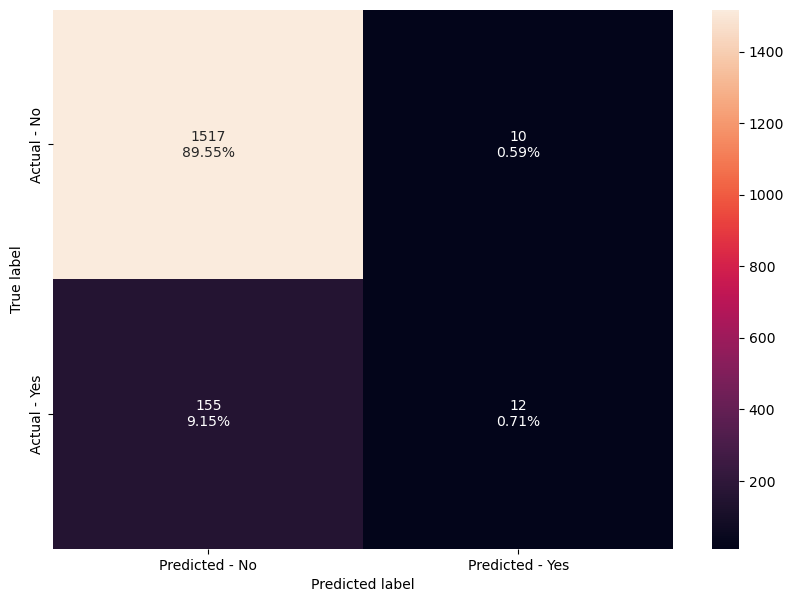

In [129]:
make_confusion_matrix(gbc_tuned,y_test)

In [130]:
#Accuracy, recall and precision on train and test set
gbc_tuned_score=get_metrics_score(gbc_tuned)

Accuracy on training set :  0.9123490455784963
Accuracy on test set :  0.9025974025974026
Recall on training set :  0.11811023622047244
Recall on test set :  0.0718562874251497
Precision on training set :  0.967741935483871
Precision on test set :  0.5454545454545454


#### Observations:
- After hyperparameter tuning, the performance metrics of the models have not changed significantly.
- The models perform wellon both training and test sets.
- Tuned Adaboost has a relatively better recall than tuned gradient boosting classifier

### Feature ranking


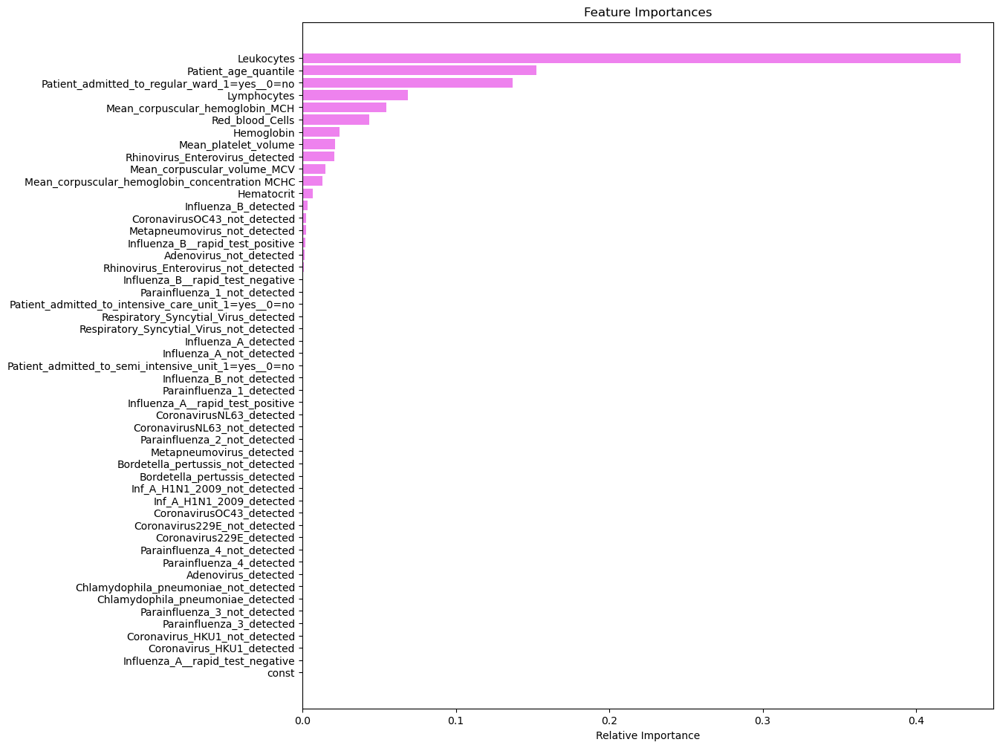

In [131]:
importances = gbc_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

#### Observation:
The top 5 features after hyperparameter tuning are as follows;
- Leukocytes
- Patient_admitted_to_regular_ward_1=yes_0=no
- Patient_age_quantile
- Lymphocytes
- Red_blood_cells

### Comparing bagging models

In [132]:
# defining list of models
models = [bagging_estimator,bagging_estimator_tuned,bagging_lr,rf_estimator,rf_estimator_tuned,
          rf_wt]

# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []

# looping through all the models to get the accuracy, precall and precision scores
for model in models:
    j = get_metrics_score(model,False)
    acc_train.append(np.round(j[0],2))
    acc_test.append(np.round(j[1],2))
    recall_train.append(np.round(j[2],2))
    recall_test.append(np.round(j[3],2))
    precision_train.append(np.round(j[4],2))
    precision_test.append(np.round(j[5],2))

In [133]:
comparison_frame = pd.DataFrame({'Model':['Bagging classifier with default parameters','Tuned Bagging Classifier',
                                        'Bagging classifier with base_estimator=LR', 'Random Forest with deafult parameters',
                                         'Tuned Random Forest Classifier','Random Forest with class_weights'], 
                                          'Train_Accuracy': acc_train,'Test_Accuracy': acc_test,
                                          'Train_Recall':recall_train,'Test_Recall':recall_test,
                                          'Train_Precision':precision_train,'Test_Precision':precision_test}) 
comparison_frame

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision
0,Bagging classifier with default parameters,0.920,0.900,0.170,0.080,0.960,0.520
1,Tuned Bagging Classifier,0.920,0.900,0.170,0.070,1.000,0.520
2,Bagging classifier with base_estimator=LR,0.900,0.900,0.050,0.060,0.760,0.620
3,Random Forest with deafult parameters,0.920,0.910,0.180,0.060,0.960,0.830
4,Tuned Random Forest Classifier,0.900,0.900,0.000,0.000,0.000,0.000
5,Random Forest with class_weights,0.920,0.900,0.190,0.050,0.900,0.670


### Comparing boosting models

In [134]:
# defining list of models
models = [abc, abc_tuned, gbc, gbc_init, gbc_tuned]

# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []

# looping through all the models to get the accuracy, precall and precision scores
for model in models:
    j = get_metrics_score(model,False)
    acc_train.append(np.round(j[0],2))
    acc_test.append(np.round(j[1],2))
    recall_train.append(np.round(j[2],2))
    recall_test.append(np.round(j[3],2))
    precision_train.append(np.round(j[4],2))
    precision_test.append(np.round(j[5],2))

In [135]:
comparison_frame = pd.DataFrame({'Model':['AdaBoost with default paramters','AdaBoost Tuned', 
                                          'Gradient Boosting with default parameters','Gradient Boosting with init=AdaBoost',
                                          'Gradient Boosting Tuned'], 
                                          'Train_Accuracy': acc_train,'Test_Accuracy': acc_test,
                                          'Train_Recall':recall_train,'Test_Recall':recall_test,
                                          'Train_Precision':precision_train,'Test_Precision':precision_test}) 
comparison_frame

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision
0,AdaBoost with default paramters,0.910,0.900,0.140,0.070,0.920,0.570
1,AdaBoost Tuned,0.920,0.900,0.170,0.050,0.980,0.530
2,Gradient Boosting with default parameters,0.920,0.900,0.170,0.080,0.980,0.500
3,Gradient Boosting with init=AdaBoost,0.920,0.900,0.160,0.080,0.980,0.520
4,Gradient Boosting Tuned,0.910,0.900,0.120,0.070,0.970,0.550


#### Observations:
- All decision tree and random forest models did not overfit.
- Although the Recall values in the boosted models were slightly better, Recall was generally poor in all decision tree and random forest models.

### Conclusion
- The decision tree and random forest models as they are, cannot be used to effectively predict Covid-19 positive patients nor enable confirmatory tests to be carried out accurately.
- The models will be optimized to suit the oversampled/ undersampled nature of the dataset

### Model Building with Oversampled data

In [136]:
# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

In [137]:
print("Before OverSampling, count of label '1': {}".format(sum(y_train == 1)))
print("Before OverSampling, count of label '0': {} \n".format(sum(y_train == 0)))

print("After OverSampling, count of label '1': {}".format(sum(y_train_over == 1)))
print("After OverSampling, count of label '0': {} \n".format(sum(y_train_over == 0)))

print("After OverSampling, the shape of train_X: {}".format(X_train_over.shape))
print("After OverSampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before OverSampling, count of label '1': 254
Before OverSampling, count of label '0': 2313 

After OverSampling, count of label '1': 2313
After OverSampling, count of label '0': 2313 

After OverSampling, the shape of train_X: (4626, 51)
After OverSampling, the shape of train_y: (4626,) 



In [138]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models


# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")

for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))

print("\n" "Training Performance:" "\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_train_over, model.predict(X_train_over)) * 100
    print("{}: {}".format(name, scores))


Cross-Validation Performance:

Bagging: 85.82059409273232
Random forest: 87.72114854188288
GBM: 89.5360578945892
Adaboost: 86.42226024515442
dtree: 85.69053696483502

Training Performance:

Bagging: 88.49978383052313
Random forest: 89.06182447038478
GBM: 92.95287505404237
Adaboost: 87.8945092952875
dtree: 88.84565499351491


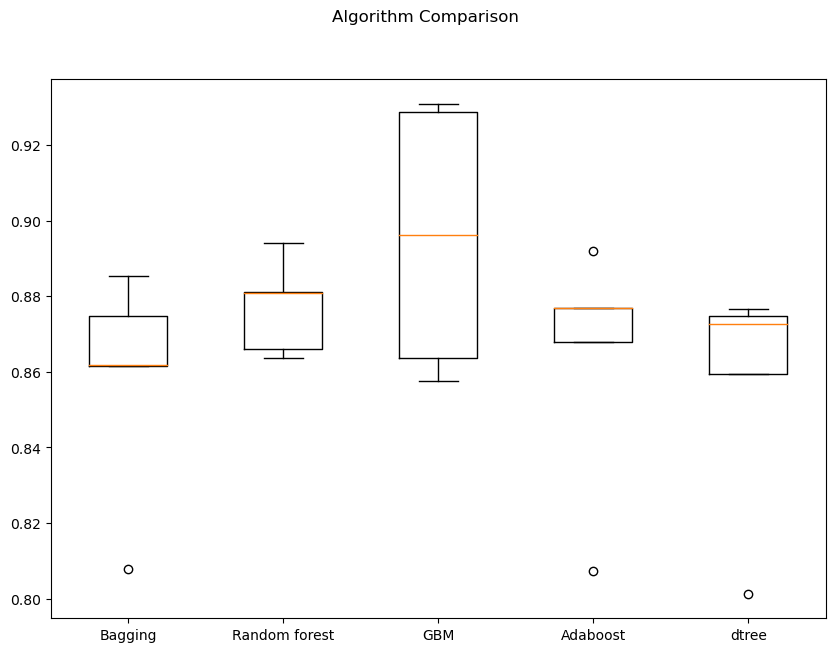

In [139]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure(figsize=(10, 7))

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

#### Observation

The gradient boosting model (GBM)is the best performing model for oversampled data.

### Model Building with Undersampled data

In [140]:
# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

In [141]:
print("Before Under Sampling, count of label '1': {}".format(sum(y_train == 1)))
print("Before Under Sampling, count of label '0': {} \n".format(sum(y_train == 0)))

print("After Under Sampling, count of label '1': {}".format(sum(y_train_un == 1)))
print("After Under Sampling, count of label '0': {} \n".format(sum(y_train_un == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_un.shape))

Before Under Sampling, count of label '1': 254
Before Under Sampling, count of label '0': 2313 

After Under Sampling, count of label '1': 254
After Under Sampling, count of label '0': 254 

After Under Sampling, the shape of train_X: (508, 51)
After Under Sampling, the shape of train_y: (508,) 



In [142]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models


# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")

for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))

print("\n" "Training Performance:" "\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_train_un, model.predict(X_train_un)) * 100
    print("{}: {}".format(name, scores))


Cross-Validation Performance:

Bagging: 70.47058823529412
Random forest: 69.65490196078431
GBM: 76.7686274509804
Adaboost: 79.12941176470589
dtree: 65.31764705882352

Training Performance:

Bagging: 75.59055118110236
Random forest: 80.70866141732283
GBM: 85.43307086614173
Adaboost: 92.91338582677166
dtree: 77.55905511811024


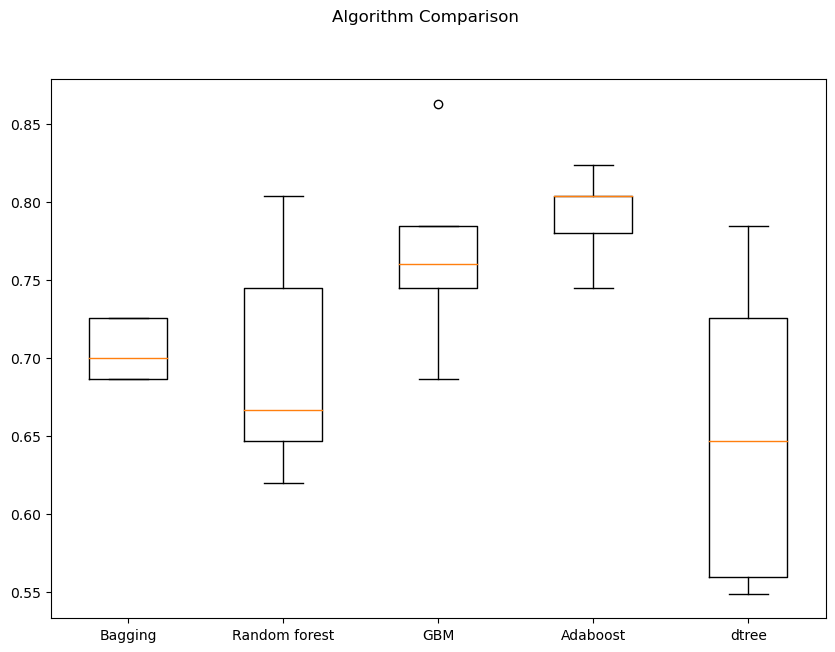

In [143]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure(figsize=(10, 7))

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

#### Observation:

Adaboost is the best performing model for the undersampled data

### Sample tuning method for Decision tree with oversampled data

In [144]:
# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

In [145]:
# defining model
Model = DecisionTreeClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "max_depth": np.arange(2, 6),
    "min_samples_leaf": [1, 4, 7],
    "max_leaf_nodes": [10, 15],
    "min_impurity_decrease": [0.0001, 0.001],
}

# Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(
    estimator=Model,
    param_distributions=param_grid,
    n_iter=10,
    n_jobs=-1,
    scoring=scorer,
    cv=5,
    random_state=1,
)

# Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over, y_train_over)

print(
    "Best parameters are {} with CV score={}:".format(
        randomized_cv.best_params_, randomized_cv.best_score_
    )
)

Best parameters are {'min_samples_leaf': 7, 'min_impurity_decrease': 0.0001, 'max_leaf_nodes': 10, 'max_depth': 2} with CV score=0.9982712032388058:


In [146]:
# Set the clf to the best combination of parameters
dt_tuned = DecisionTreeClassifier(
    max_depth=4, min_samples_leaf=1, max_leaf_nodes=15, min_impurity_decrease=0.001,
)

# Fit the best algorithm to the data.
dt_tuned.fit(X_train_over, y_train_over)

DecisionTreeClassifier(max_depth=4, max_leaf_nodes=15,
                       min_impurity_decrease=0.001)

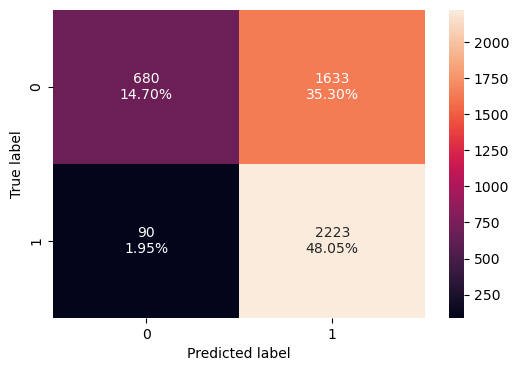

In [147]:
# creating confusion matrix
confusion_matrix_sklearn(dt_tuned, X_train_over, y_train_over)

In [148]:
# Calculating different metrics on train set
dt_random_train = model_performance_classification_sklearn(
    dt_tuned, X_train_over, y_train_over
)
print("Training performance:")
dt_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.628,0.961,0.577,0.721


#### Observation:

Recall has improved in this model.

### Tuning Random Forest with Randomized Search (Oversampled data)

In [149]:
%%time

# Choose the type of classifier. 
rf2 = RandomForestClassifier(random_state=1)

# Grid of parameters to choose from
parameters = {"n_estimators": [200,250,300],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'], 
    "max_samples": np.arange(0.4, 0.7, 0.1),
    "max_depth":np.arange(3,4,5),
    "class_weight" : ['balanced', 'balanced_subsample'],
    "min_impurity_decrease":[0.001, 0.002, 0.003]
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the random search
grid_obj = RandomizedSearchCV(rf2, parameters,n_iter=30, scoring=acc_scorer,cv=5, random_state = 1, n_jobs = -1, verbose = 2)
# using n_iter = 30, so randomized search will try 30 different combinations of hyperparameters
# by default, n_iter = 10

grid_obj = grid_obj.fit(X_train_over, y_train_over)

# Print the best combination of parameters
grid_obj.best_params_


Fitting 5 folds for each of 30 candidates, totalling 150 fits
CPU times: user 1.28 s, sys: 65.8 ms, total: 1.34 s
Wall time: 39.1 s


{'n_estimators': 250,
 'min_samples_leaf': 1,
 'min_impurity_decrease': 0.001,
 'max_samples': 0.6,
 'max_features': 'sqrt',
 'max_depth': 3,
 'class_weight': 'balanced_subsample'}

In [150]:
# Set the clf to the best combination of parameters
rf2_tuned = RandomForestClassifier(
    class_weight="balanced",
    max_features="sqrt",
    max_samples=0.5,
    min_samples_leaf=2,
    n_estimators=200,
    random_state=1,
    max_depth=3,
    min_impurity_decrease=0.001,
)

# Fit the best algorithm to the data.
rf2_tuned.fit(X_train_over, y_train_over)

RandomForestClassifier(class_weight='balanced', max_depth=3,
                       max_features='sqrt', max_samples=0.5,
                       min_impurity_decrease=0.001, min_samples_leaf=2,
                       n_estimators=200, random_state=1)

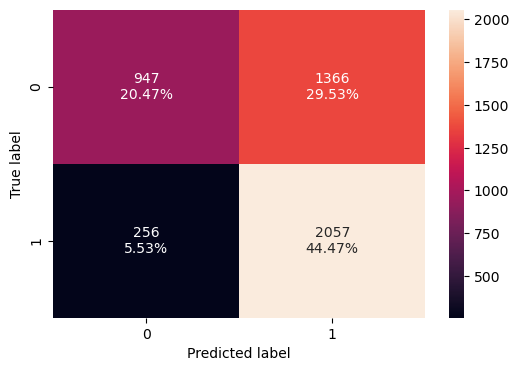

In [151]:
# creating confusion matrix
confusion_matrix_sklearn(rf2_tuned, X_train_over, y_train_over)

In [152]:
# Calculating different metrics on train set
rf2_random_train = model_performance_classification_sklearn(
    rf2_tuned, X_train_over, y_train_over
)
print("Training performance:")
rf2_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.649,0.889,0.601,0.717


#### Observation:

Recall on the training set has improved for random forest


### Tuning Adaboost with Randomized Search (Oversampled data)

In [153]:
%%time 

# defining model
model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in GridSearchCV

param_grid = {
    "n_estimators": np.arange(100, 150, 200),
    "learning_rate": [0.2, 0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over, y_train_over)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 100, 'learning_rate': 0.05, 'base_estimator': DecisionTreeClassifier(max_depth=1, random_state=1)} with CV score=0.9719072863781287:
CPU times: user 675 ms, sys: 23.8 ms, total: 699 ms
Wall time: 10.8 s


In [154]:
# building model with best parameters
adb_tuned2 = AdaBoostClassifier(
    n_estimators=100,
    learning_rate=0.05,
    random_state=1,
    base_estimator=DecisionTreeClassifier(max_depth=3, random_state=1),
)

# Fit the model on training data
adb_tuned2.fit(X_train_over, y_train_over)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3,
                                                         random_state=1),
                   learning_rate=0.05, n_estimators=100, random_state=1)

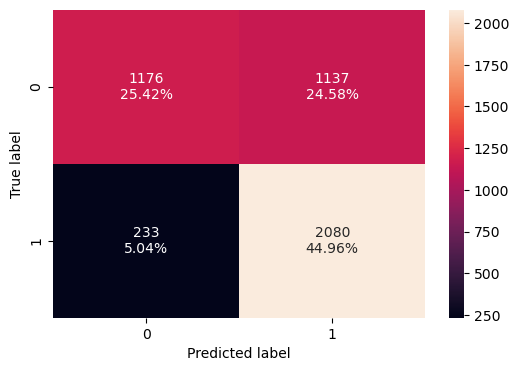

In [155]:
# creating confusion matrix
confusion_matrix_sklearn(adb_tuned2,  X_train_over, y_train_over)

In [156]:
# Calculating different metrics on train set
Adaboost_random_train = model_performance_classification_sklearn(
    adb_tuned2, X_train_over, y_train_over
)
print("Training performance:")
Adaboost_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.704,0.899,0.647,0.752


#### Observation

Recall has also improved in this model

### Tuning GBM  with Gridsearch (Oversampled data)

In [157]:
# Choose the type of classifier. 
gbc_tuned_1= GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    "n_estimators": [15,26,5],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,0.9,1]
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(gbc_tuned_1, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train_over, y_train_over)

# Set the clf to the best combination of parameters
gbc_tuned_1 = grid_obj.best_estimator_

# Fit the best algorithm to the data.
gbc_tuned_1.fit(X_train_over, y_train_over)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           max_features=0.8, n_estimators=5, random_state=1,
                           subsample=0.9)

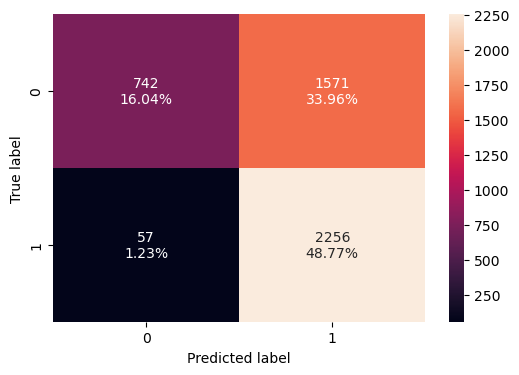

In [158]:
# creating confusion matrix
confusion_matrix_sklearn(gbc_tuned_1, X_train_over, y_train_over)

In [159]:
gbc_random_train1 = model_performance_classification_sklearn(
    gbc_tuned_1, X_train_over, y_train_over
)
print("Training performance:")
gbc_random_train1

Training performance:


,Accuracy,Recall,Precision,F1
0,0.648,0.975,0.589,0.735


### Sample tuning method for Decision tree with undersampled data

In [160]:
# Set the clf to the best combination of parameters
dt1_tuned = DecisionTreeClassifier(
    max_depth=6, min_samples_leaf=7, max_leaf_nodes=15, min_impurity_decrease=0.001,
)

# Fit the best algorithm to the data.
dt1_tuned.fit(X_train_un, y_train_un)

DecisionTreeClassifier(max_depth=6, max_leaf_nodes=15,
                       min_impurity_decrease=0.001, min_samples_leaf=7)

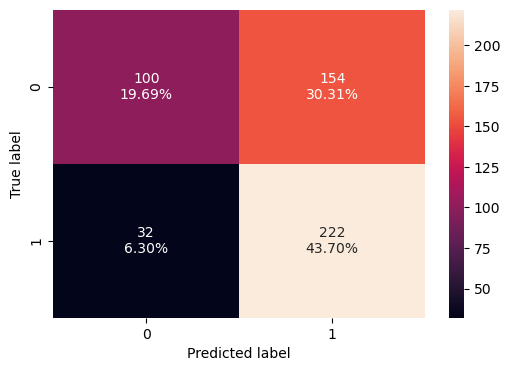

In [161]:
# creating confusion matrix
confusion_matrix_sklearn(dt1_tuned, X_train_un, y_train_un)

In [162]:
# Calculating different metrics on validation set
dt1_random_train = model_performance_classification_sklearn(dt1_tuned, X_train_un, y_train_un)
print("Training performance:")
dt1_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.634,0.874,0.590,0.705


### Tuning Random forests with Randomized Search (Undersampled data)

In [163]:
%%time

# Choose the type of classifier. 
rf2 = RandomForestClassifier(random_state=1)

# Grid of parameters to choose from
parameters = {"n_estimators": [200,250,300],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'], 
    "max_samples": np.arange(0.4, 0.7, 0.1),
    "max_depth":np.arange(3,4,5),
    "class_weight" : ['balanced', 'balanced_subsample'],
    "min_impurity_decrease":[0.001, 0.002, 0.003]
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the random search
grid_obj = RandomizedSearchCV(rf2, parameters,n_iter=30, scoring=acc_scorer,cv=5, random_state = 1, n_jobs = -1, verbose = 2)
# using n_iter = 30, so randomized search will try 30 different combinations of hyperparameters
# by default, n_iter = 10

grid_obj = grid_obj.fit(X_train_un, y_train_un)

# Print the best combination of parameters
grid_obj.best_params_

Fitting 5 folds for each of 30 candidates, totalling 150 fits
CPU times: user 876 ms, sys: 65.8 ms, total: 942 ms
Wall time: 24.4 s


{'n_estimators': 200,
 'min_samples_leaf': 2,
 'min_impurity_decrease': 0.001,
 'max_samples': 0.5,
 'max_features': 'sqrt',
 'max_depth': 3,
 'class_weight': 'balanced'}

In [164]:
# Set the clf to the best combination of parameters
rf2_tuned = RandomForestClassifier(
    class_weight="balanced",
    max_features="sqrt",
    max_samples=0.6,
    min_samples_leaf=1,
    n_estimators=200,
    random_state=1,
    max_depth=3,
    min_impurity_decrease=0.001,
)

# Fit the best algorithm to the data.
rf2_tuned.fit(X_train_un, y_train_un)

RandomForestClassifier(class_weight='balanced', max_depth=3,
                       max_features='sqrt', max_samples=0.6,
                       min_impurity_decrease=0.001, n_estimators=200,
                       random_state=1)

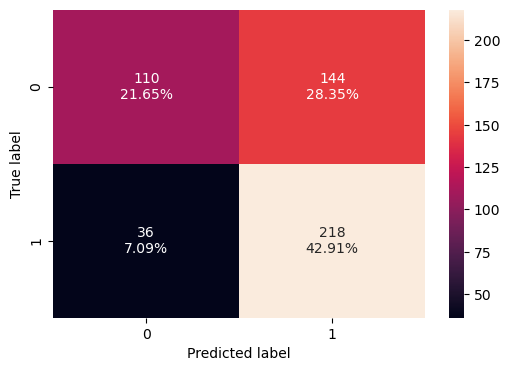

In [165]:
# creating confusion matrix
confusion_matrix_sklearn(rf2_tuned, X_train_un, y_train_un)

In [166]:
# Calculating different metrics on train set
rf2_random_train = model_performance_classification_sklearn(
    rf2_tuned, X_train_un, y_train_un
)
print("Training performance:")
rf2_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.646,0.858,0.602,0.708


### Tuning Adaboost with Randomized Search (Undersampled data)

In [167]:
%%time 

# defining model
model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in GridSearchCV

param_grid = {
    "n_estimators": np.arange(100, 150, 200),
    "learning_rate": [0.2, 0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un, y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 100, 'learning_rate': 0.05, 'base_estimator': DecisionTreeClassifier(max_depth=1, random_state=1)} with CV score=0.8936470588235295:
CPU times: user 266 ms, sys: 12.4 ms, total: 279 ms
Wall time: 3.4 s


In [168]:
# building model with best parameters
adb_tuned2 = AdaBoostClassifier(
    n_estimators=100,
    learning_rate=0.2,
    random_state=1,
    base_estimator=DecisionTreeClassifier(max_depth=3, random_state=1),
)

# Fit the model on training data
adb_tuned2.fit(X_train_un, y_train_un)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3,
                                                         random_state=1),
                   learning_rate=0.2, n_estimators=100, random_state=1)

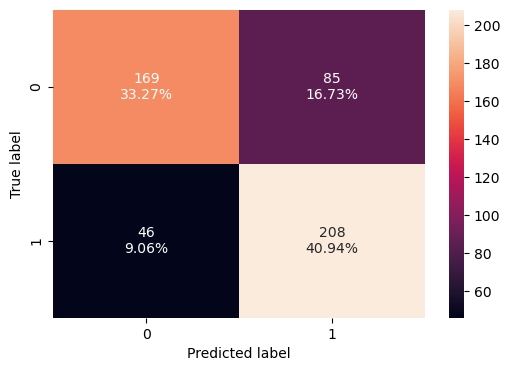

In [169]:
# creating confusion matrix
confusion_matrix_sklearn(adb_tuned2, X_train_un, y_train_un)

In [170]:
Adaboost_random_train = model_performance_classification_sklearn(
    adb_tuned2, X_train_un, y_train_un
)
print("Training performance:")
Adaboost_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.742,0.819,0.710,0.761


### Observation:

The models have a comparatively better recall and precision for undersampled data than with the original data.

### Tuning GBM  with Gridsearch (Undersampled data)

In [171]:
# Choose the type of classifier. 
gbc_tuned_2= GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    "n_estimators": [15,26,5],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,0.9,1]
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(gbc_tuned_1, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train_un, y_train_un)

# Set the clf to the best combination of parameters
gbc_tuned_2 = grid_obj.best_estimator_

# Fit the best algorithm to the data.
gbc_tuned_2.fit(X_train_un, y_train_un)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           max_features=0.7, n_estimators=5, random_state=1,
                           subsample=0.9)

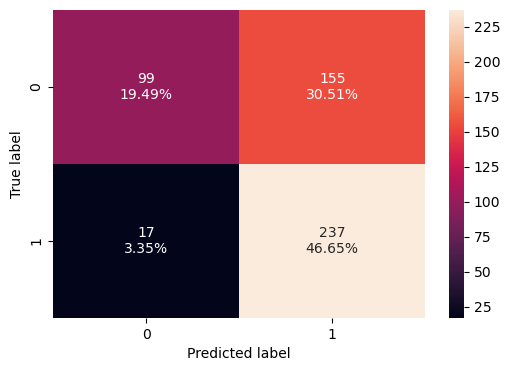

In [172]:
# creating confusion matrix
confusion_matrix_sklearn(gbc_tuned_2, X_train_un, y_train_un)

In [173]:
gbc_random_train2 = model_performance_classification_sklearn(
    gbc_tuned_2, X_train_un, y_train_un
)
print("Training performance:")
gbc_random_train2

Training performance:


,Accuracy,Recall,Precision,F1
0,0.661,0.933,0.605,0.734


#### Observation:
The models have a comparatively better recall and precision for undersampled data than with the original data.

### Model performance comparison for oversampled and undersampled data training set

In [174]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        dt_random_train.T,
        rf2_random_train.T,
        Adaboost_random_train.T,
        dt1_random_train.T,
        rf2_random_train.T,
        Adaboost_random_train.T,
        gbc_random_train1.T,
        gbc_random_train2.T,
        
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Tuned DTree oversampled",
    "Random forest Oversampled",
    "AdaBoost Tuned with Random search",
    "Tuned DTree undersampled",
    "Random forest undersampled",
    "Adaboost tuned with Random Search undersampled",
    "GBM tuned with oversampled data",
    "GBM tuned with undersampled data"
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Tuned DTree oversampled,Random forest Oversampled,AdaBoost Tuned with Random search,Tuned DTree undersampled,Random forest undersampled,Adaboost tuned with Random Search undersampled,GBM tuned with oversampled data,GBM tuned with undersampled data
Accuracy,0.628,0.646,0.742,0.634,0.646,0.742,0.648,0.661
Recall,0.961,0.858,0.819,0.874,0.858,0.819,0.975,0.933
Precision,0.577,0.602,0.710,0.590,0.602,0.710,0.589,0.605
F1,0.721,0.708,0.761,0.705,0.708,0.761,0.735,0.734


#### Observation:
The tuned gradient boosting model has the best recall for both oversampled and undersampled training sets

### Model Performance on Validation set

In [175]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Logistic regression", LogisticRegression(random_state=1)))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models


# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")

for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_val, model.predict(X_val)) * 100
    print("{}: {}".format(name, scores))


Cross-Validation Performance:

Logistic regression: 63.37254901960784
Bagging: 70.47058823529412
Random forest: 69.65490196078431
GBM: 76.7686274509804
Adaboost: 79.12941176470589
dtree: 65.31764705882352

Validation Performance:

Logistic regression: 63.503649635036496
Bagging: 62.04379562043796
Random forest: 66.42335766423358
GBM: 73.72262773722628
Adaboost: 86.86131386861314
dtree: 56.934306569343065


### Performance of Tuned Models on Validation Set

In [176]:
# Calculating different metrics on validation set
dt1_random_val = model_performance_classification_sklearn(dt1_tuned, X_val, y_val)
print("Validation performance:")
dt1_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.411,0.832,0.126,0.219


In [177]:
# Calculating different metrics on validation set
rf2_random_val = model_performance_classification_sklearn(
    rf2_tuned, X_val, y_val
)
print("Validation performance:")
rf2_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.415,0.810,0.124,0.215


In [178]:
# Calculating different metrics on validation set
Adaboost_random_val = model_performance_classification_sklearn(
    adb_tuned2, X_val, y_val
)
print("Validation performance:")
Adaboost_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.524,0.635,0.125,0.209


In [179]:
gbc_random_val = model_performance_classification_sklearn(
    gbc_tuned_2, X_val, y_val
)
print("Validation performance:")
gbc_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.390,0.905,0.130,0.227


In [180]:
# validation performance comparison

models_val_comp_df = pd.concat(
    [
        dt1_random_val.T,
        rf2_random_val.T,
        Adaboost_random_val.T,
        gbc_random_val.T,
        
    ],
    axis=1,
)
models_val_comp_df.columns = [
    "Tuned DTree val",
    "Random forest val",
    "AdaBoost Tuned with Random search val",
    "GBM tuned val"
]
print("Validation performance comparison:")
models_val_comp_df

Validation performance comparison:


,Tuned DTree val,Random forest val,AdaBoost Tuned with Random search val,GBM tuned val
Accuracy,0.411,0.415,0.524,0.390
Recall,0.832,0.810,0.635,0.905
Precision,0.126,0.124,0.125,0.130
F1,0.219,0.215,0.209,0.227


#### Comment
- The Tuned Gradient Boosted Modelhas the best recall (90.5%) performance on the validation set
- The tuned Adaboost model has the worst recall (63.5%).

### Test set final performance

In [181]:
# Calculating different metrics on test set
dt1_random_test = model_performance_classification_sklearn(dt1_tuned, X_test, y_test)
print("Test performance:")
dt1_random_test

Test performance:


,Accuracy,Recall,Precision,F1
0,0.402,0.868,0.128,0.223


In [182]:
# Calculating different metrics on test set
rf2_random_test = model_performance_classification_sklearn(
    rf2_tuned, X_test, y_test
)
print("Test performance:")
rf2_random_test

Test performance:


,Accuracy,Recall,Precision,F1
0,0.416,0.826,0.126,0.218


In [183]:
# Calculating different metrics on test set
Adaboost_random_test = model_performance_classification_sklearn(
    adb_tuned2, X_test, y_test
)
print("Test performance:")
Adaboost_random_test

Test performance:


,Accuracy,Recall,Precision,F1
0,0.537,0.677,0.134,0.224


In [184]:
gbc_random_test = model_performance_classification_sklearn(
    gbc_tuned_2, X_test, y_test
)
print("Test performance:")
gbc_random_test

Test performance:


,Accuracy,Recall,Precision,F1
0,0.384,0.856,0.123,0.215


In [185]:
# test performance comparison

models_test_comp_df = pd.concat(
    [
        dt1_random_test.T,
        rf2_random_test.T,
        Adaboost_random_test.T,
        gbc_random_test.T,
        
    ],
    axis=1,
)
models_test_comp_df.columns = [
    "Tuned DTree test",
    "Random forest test",
    "AdaBoost Tuned with Random search test",
    "GBM tuned test"
]
print("Test performance comparison:")
models_test_comp_df

Test performance comparison:


,Tuned DTree test,Random forest test,AdaBoost Tuned with Random search test,GBM tuned test
Accuracy,0.402,0.416,0.537,0.384
Recall,0.868,0.826,0.677,0.856
Precision,0.128,0.126,0.134,0.123
F1,0.223,0.218,0.224,0.215


### Observation:
- The model is slightly overfitting.
- Accuracy and precision are low for all 3 models but recall is good.
- The tuned decision tree model is preferred because it has the highest recall (86.8%) in the test set.
- The tuned GBM has the second best recall metric (85.6%)
- The ability of a screening algorithm to pick up positive Covid-19 cases is an invaluable and hence Recall is a desired property of the final model.

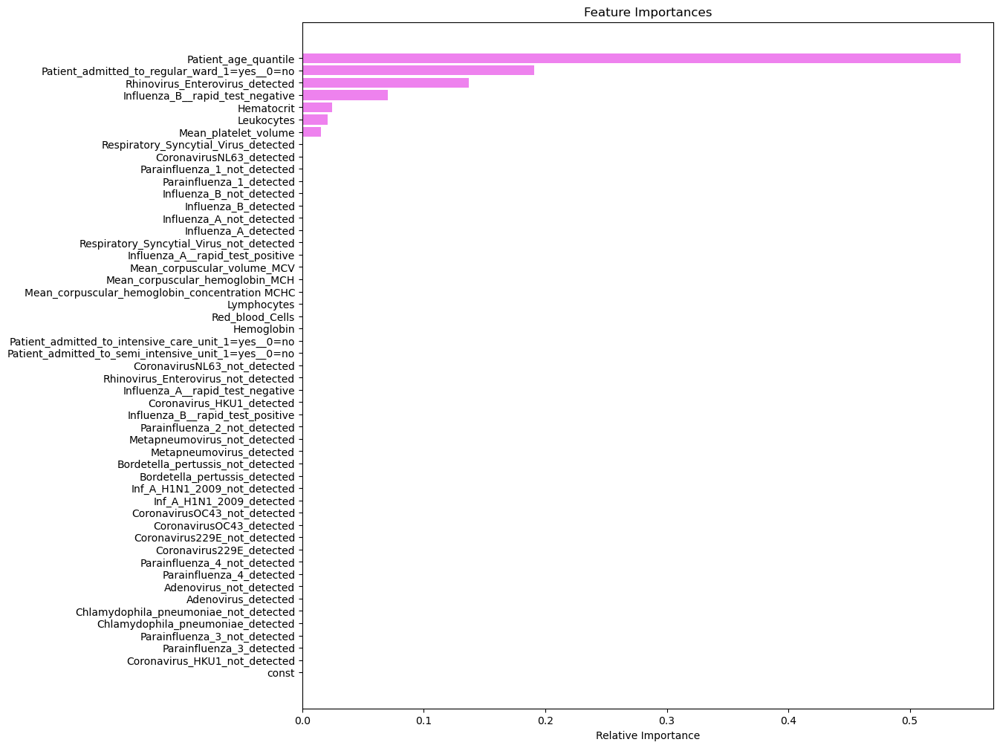

[CV] END class_weight=balanced, max_depth=3, max_features=sqrt, max_samples=0.6, min_impurity_decrease=0.001, min_samples_leaf=2, n_estimators=250; total time=   1.2s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=[0.3 0.4 0.5], max_samples=0.6, min_impurity_decrease=0.002, min_samples_leaf=3, n_estimators=250; total time=   0.2s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=[0.3 0.4 0.5], max_samples=0.6, min_impurity_decrease=0.002, min_samples_leaf=3, n_estimators=250; total time=   0.2s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=[0.3 0.4 0.5], max_samples=0.5, min_impurity_decrease=0.003, min_samples_leaf=3, n_estimators=200; total time=   0.2s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=[0.3 0.4 0.5], max_samples=0.4, min_impurity_decrease=0.003, min_samples_leaf=2, n_estimators=250; total time=   0.2s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=[0.3 0.4 0.5], max_sa

[CV] END class_weight=balanced, max_depth=3, max_features=sqrt, max_samples=0.6, min_impurity_decrease=0.001, min_samples_leaf=2, n_estimators=250; total time=   1.2s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=[0.3 0.4 0.5], max_samples=0.6, min_impurity_decrease=0.002, min_samples_leaf=3, n_estimators=250; total time=   0.2s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=[0.3 0.4 0.5], max_samples=0.6, min_impurity_decrease=0.002, min_samples_leaf=3, n_estimators=250; total time=   0.2s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=[0.3 0.4 0.5], max_samples=0.5, min_impurity_decrease=0.003, min_samples_leaf=3, n_estimators=200; total time=   0.2s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=[0.3 0.4 0.5], max_samples=0.5, min_impurity_decrease=0.003, min_samples_leaf=3, n_estimators=200; total time=   0.2s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=[0.3 0.4 0.5], max_sa

[CV] END class_weight=balanced, max_depth=3, max_features=sqrt, max_samples=0.6, min_impurity_decrease=0.001, min_samples_leaf=2, n_estimators=250; total time=   1.2s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=[0.3 0.4 0.5], max_samples=0.6, min_impurity_decrease=0.002, min_samples_leaf=3, n_estimators=250; total time=   0.2s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=[0.3 0.4 0.5], max_samples=0.5, min_impurity_decrease=0.003, min_samples_leaf=3, n_estimators=200; total time=   0.2s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=[0.3 0.4 0.5], max_samples=0.5, min_impurity_decrease=0.003, min_samples_leaf=3, n_estimators=200; total time=   0.2s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=[0.3 0.4 0.5], max_samples=0.4, min_impurity_decrease=0.003, min_samples_leaf=2, n_estimators=250; total time=   0.2s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=[0.3 0.4 0.5], max_sa

[CV] END class_weight=balanced, max_depth=3, max_features=sqrt, max_samples=0.6, min_impurity_decrease=0.001, min_samples_leaf=2, n_estimators=250; total time=   1.2s
[CV] END class_weight=balanced, max_depth=3, max_features=sqrt, max_samples=0.6, min_impurity_decrease=0.001, min_samples_leaf=2, n_estimators=250; total time=   1.1s
[CV] END class_weight=balanced, max_depth=3, max_features=sqrt, max_samples=0.6, min_impurity_decrease=0.001, min_samples_leaf=2, n_estimators=200; total time=   0.9s
[CV] END class_weight=balanced, max_depth=3, max_features=sqrt, max_samples=0.6, min_impurity_decrease=0.001, min_samples_leaf=2, n_estimators=200; total time=   1.0s
[CV] END class_weight=balanced, max_depth=3, max_features=sqrt, max_samples=0.4, min_impurity_decrease=0.002, min_samples_leaf=2, n_estimators=300; total time=   1.7s
[CV] END class_weight=balanced_subsample, max_depth=3, max_features=sqrt, max_samples=0.4, min_impurity_decrease=0.001, min_samples_leaf=2, n_estimators=250; total t

In [186]:
feature_names = X.columns
importances = dt_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

#### Interpretation of the best model
- As mentioned earlier, the ideal model should be able to identify positive Covid-19 cases when people with flu-like symptomes present at a hospital.
- The metric that best captures this property of any analytic model is Recall
- The tuned decision tree model has a recall of 0.87. 
- This means that it will be able to correctly predict positive cases 87% of the time.
- It also means it will be be able to predict 87% of positive Covid-19 cases.
- For the purposes of our project, this makes it the best model.

## Business Insights  And Recommendations 
1. There are few positive Covid-19 cases and a large number of negative cases in the dataset. This can affect modeling when splitting of datasets into training and test sets is done randomly.Stratification of the split sets and optimization of models aid in acheiving good performance metrics.
2. Oversampling and undersampling techniques are employed to enable adequate model training.
3. Factors or variables such as the patient's age, leukocyte count, whether or not they are admitted into the ward, hematocrit, Influenza B and Rhinovirus_Enterovirus infections are the most important in predicting positive Covid-19 cases.
4. The institution can therefore effectively manage the burden of extensive Covid-19 testing in under-resourced hospitals by assessing and investing in the above mentioned variables in patients who present with flu-like illnesses.
5. The tuned decision tree model is the best predictive model with the highest sensitivity or recall to enable effective screening of Covid-19 cases. It is able to correctly predict positive Covid-19 cases about 87% of the time


## Executive Summary

#### Key takeways:

- The dataset, in its raw form, needed to undergo processing to enable comprehensive predictive models to be built.
- The dataset was fairly large, consisting of data from 5644 unique patients.
- Working with this data required a great deal of meticulousness and diligence.
- Being a fairly new disease, Covid-19 is not yet fully understood and predicting by using patient parameters other than PCR testing is no mean task.
- By employing machine learning techniques, a predictive model has been identified to work as a screening to assist the organization effectively allocate its resources in fighting the Covid-19 pandemic.

#### Final model selection:
- The final model was chosen after rigorously, evaluating the. dataset, going through data pre-processing and subsequently building, training and testing several models.
- The model with the highest recall was finally selected to serve the purpose of a sensitive screening tool.
- Metrics such as accuracy and precision were also evaluated for each model.
- Expectations of the final model:
1. It should have a good recall- the ability to accurately predict positive cases.
2. It should generalize well on both train and test sets.

#### Next Steps
- The Tuned Decision Tree Model can be used by the organization in predicting positive Covid-19 cases in its patient population.
- Some important features or parameters that can influence the predictions are:
1. Patient age
2. Leukocytes
3. Ward admission
4. Hematocrit
- Resources can therefore be allocated to ensure that these parameters are measured in suspected Covid-19 cases.


## Problems and Solution Summary

#### Problems: 
1. Hospitals such as the Hospital Israelita Albert Einstein of Sao Paolo, Brazil are overwhelmed and under-resourced in identifying positive Covid-19 cases in patients with flu-like symptoms

2.  Patients present with a multitude of signs and symptoms that make it difficult to isolate Covid-19 cases

3. Patient data is numerous, varied and contains errors and missing data.


4. Choosing the best predictive model out of the many machine learning models

#### Solution:
1. Develop a predictive analytical model that can serve as a sensitive screening tool

2. Identify most important parameters that can be used to influence positive predictions.

3. Data cleaning and other pre-processing techniques enable salient and useful data to be picked up from the dataset

4. Performance metrics will be used to evaluate various analytical models and the model with the best recall will be selected.

#### Is the model a valid solution to the problem?
- ANSWER: YES
- Having such a good recall means it will be able to correctly predict positive cases 87% of the time.
- It also means it will be be able to predict 87% of positive Covid-19 cases.


## Recommendations on implementation

- The hospital management should redistribute resources to ensure that the key features or parameters that influence the prediction of positive Covid-19 cases are captured.

- Patient age and type of admission must be recorded at all times.

- In the absence of PCR machines and other direct modalities for covid testing, the necessary equipment and reagents needed to test for leukocytes, hematocrit, red blood cell parameters as well as Influenza and Rhinovirus_Enterovirus infections must be supplied to the frontline areas of the hospital where patients are first encountered.

#### Cost-Benefit Analysis
Benefits: 
- Early identification and management of Covid-19 cases.
- Prevention of cross-infection and spread of the disease among patients and staff
- Protection of hospital’s workforce from infection and in doing so, maintaining productivity.
- Adequate allocation of hospital’s resources in managing Covid-19 infections.

Cost:
- More staff required for data capture , laboratory testing and implementation of models.
- Regular education and capacity-building exercises on identification of predictive parameters and the use of the predictive model.
- Building a standardized protocol for the use of the model in the entire hospital will be labor-intensive.

#### Risks and Challenges
- Poor data capture necessary for model prediction.
- Inadequate technical know-how by staff.
- Insufficient workforce to implement data collection, testing and implementation of the model

## Conclusion
- The hospital management is prudent in using predictive machine learning models in making business intelligence decisions that will save lives, increase productivity and enable the delivery of value-based healthcare.

- The tuned decision tree model will be an effective screening tool for the identification of positive Covid-19 cases among patients with flu-like symptoms.

- It will complement hospitals in areas where it is impossible or impractical to test everyone for Covid-19 infection